In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install heartpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 7.7 MB/s eta 0:00:00


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import heartpy as hp
import matplotlib.dates as mdates

# **HR Metrics and REM data analysis**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
False
Average Heart Rate per Sleep Cycle:
  Sleep_Stage  Heart_Rate
0        Deep   79.653425
1       Light   77.757792
2         Rem   78.518863
3        Wake   82.570510
True
True
False
Average Heart Rate per Sleep Cycle:
  Sleep_Stage  Heart_Rate
0        Deep   95.642491
1       Light   99.707913
2         Rem  117.809500
3        Wake   82.982175
False
Average Heart Rate per Sleep Cycle:
  Sleep_Stage  Heart_Rate
0        Deep   91.404750
1       Light  104.926457
2         Rem  110.133167
3        Wake   91.487203
[485, 361, 293]
[1169, 853, 687]
Slope (m): 2.515053460889138
Intercept (c): -51.88196398424308


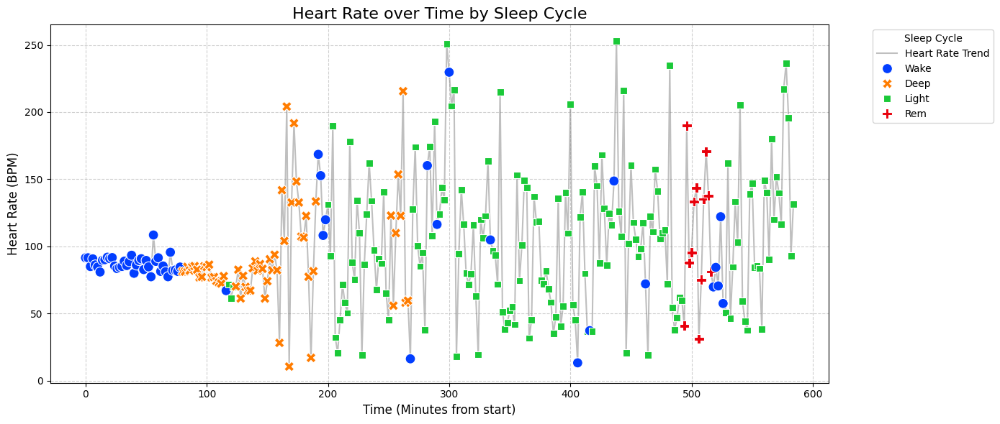

/tmp/ipython-input-182/1425711078.py:139: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_hr_per_stage, x='Sleep_Stage', y='Heart_Rate', palette='viridis')


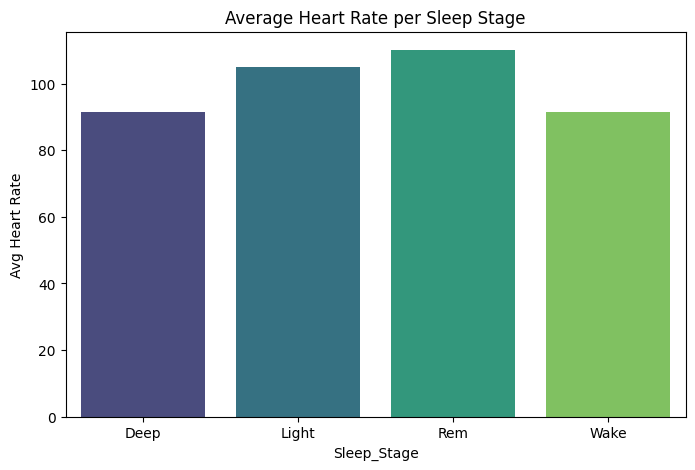

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

# 1. Mount Google Drive (Run this once to authorize access)
from google.colab import drive
drive.mount('/content/drive')

# 2. Load the Data
file_path = '/content/drive/MyDrive/Sleepingbeauty_v4_merged_test.csv'
df = pd.read_csv(file_path)

# Function to process a single row of data
def process_sleep_data(row_index, dataframe):
    # --- Extract HR Metrics (5-minute intervals) ---
    hr_raw = str(dataframe.iloc[row_index]['hr_metrics'])
    if not hr_raw:
      return pd.DataFrame()
    # Split by pipe, filter empty strings, convert to float
    hr_values = [float(x) for x in hr_raw.split('|') if x.strip() != '' and x != "null"]

    # print(min(hr_values))
    # print(max(hr_values))
    # Create a time axis for HR (0, 5, 10, 15 minutes...)
    hr_timestamps_min = [i * 2 for i in range(len(hr_values))]

    # --- Extract Scoring/Sleep Stages (30-second intervals) ---
    scoring_raw = str(dataframe.iloc[row_index]['scoring'])

    # Split by pipe
    # Note: The prompt implies a format like "...timestampfalse|Rem..."
    # where timestamp and the next flag might be concatenated.
    score_tokens = scoring_raw.split('|')

    extracted_stages = []

    REMPercent = dataframe.iloc[row_index]['REMPercent']
    lightPercent = dataframe.iloc[row_index]['lightPercent']
    deepPercent = dataframe.iloc[row_index]['deepPercent']
    NREMPercent = dataframe.iloc[row_index]['NREMPercent']
    # print(REMPercent)
    # print(lightPercent)
    # print(deepPercent)
    # print(NREMPercent)
    #print(score_tokens)

    # Logic to parse the specific format:
    # We look for the boolean flag (false/true). The Sleep Stage is immediately after it.
    for i, token in enumerate(score_tokens):
        # Check if token is exactly 'false'/'true' or ends with them (handling the concatenated timestamp case)
        if token.endswith('false') or token.endswith('true'):
            # Ensure there is a next token available which should be the Sleep Stage
            if i + 1 < len(score_tokens):
                extracted_stages.append(score_tokens[i+1])
    # --- Align Data ---
    # HR is every 5 minutes (300 seconds)
    # Scoring is every 30 seconds
    # Ratio: 1 HR point = 10 Scoring points (300 / 30 = 10)

    aligned_data = []
    #print(len(hr_values))
    #print(len(extracted_stages))

    for i, hr_val in enumerate(hr_values):
        # Calculate the corresponding index in the scoring array
        # HR index 0 -> Score index 0
        # HR index 1 -> Score index 10
        score_index = i * 2

        # Ensure we don't go out of bounds if HR data is longer than Scoring data
        if score_index < len(extracted_stages):
            # print(hr_val, "  ", extracted_stages[score_index])
            current_stage = extracted_stages[score_index]
            aligned_data.append({
                'Time_Minute': hr_timestamps_min[i],
                'Heart_Rate': hr_val,
                'Sleep_Stage': current_stage,
                'hr_len': len(hr_values),
                'Sleep_Stage_len' : len(extracted_stages)
            })
    return pd.DataFrame(aligned_data), len(hr_values), len(extracted_stages)
#df_analysis = pd.DataFrame()
X_hr = []
Y_stage = []
for i in range(0, 5):
# Process the first row (change index 0 to process other rows)
  df_analysis, hr_len, stage_len = process_sleep_data(i, df)
  print(df_analysis.empty)
  if not df_analysis.empty:
    # --- 3. Calculate Average Heart Rate per Sleep Cycle ---
    avg_hr_per_stage = df_analysis.groupby('Sleep_Stage')['Heart_Rate'].mean().reset_index()
    print("Average Heart Rate per Sleep Cycle:")
    print(avg_hr_per_stage)
    X_hr.append(hr_len)
    Y_stage.append(stage_len)


# 1. Define data (Convert to numpy arrays for better performance)
x = X_hr
y = Y_stage
print(x)
print(y)
# 2. Fit a polynomial of degree 1 (Linear)
# m = slope, c = intercept
m, c = np.polyfit(x, y, 1)

print(f"Slope (m): {m}")
print(f"Intercept (c): {c}")

# --- 4. Plotting ---
plt.figure(figsize=(14, 6))
sns.scatterplot()

# Define a color palette for sleep stages
stage_order = df_analysis['Sleep_Stage'].unique()
palette = sns.color_palette("husl", len(stage_order))

# Plot Heart Rate Line
sns.lineplot(data=df_analysis, x='Time_Minute', y='Heart_Rate', color='gray', alpha=0.5, label='Heart Rate Trend')

# Plot Scatter points colored by Sleep Stage
sns.scatterplot(data=df_analysis, x='Time_Minute', y='Heart_Rate',
                hue='Sleep_Stage', style='Sleep_Stage',
                s=100, palette='bright', zorder=2)

plt.title('Heart Rate over Time by Sleep Cycle', fontsize=16)
plt.xlabel('Time (Minutes from start)', fontsize=12)
plt.ylabel('Heart Rate (BPM)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title='Sleep Cycle', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# Optional: Bar chart for the averages
plt.figure(figsize=(8, 5))
sns.barplot(data=avg_hr_per_stage, x='Sleep_Stage', y='Heart_Rate', palette='viridis')
plt.title('Average Heart Rate per Sleep Stage')
plt.ylabel('Avg Heart Rate')
plt.show()

                                             scoring  \
0  false|Wake|0|0|0|1|22:02:34.585000|false|Wake|...   
1                                                NaN   
2                                                NaN   
3  false|Wake|0|0|0|1|22:34:24.442000|false|Wake|...   
4  false|Wake|0.0010000000474974513|0.00100000004...   

                                          hr_metrics  
0  104.311|104.311|102.52|103.584|100.339|100.324...  
1                                                NaN  
2                                                NaN  
3  80.051|80.051|80.318|82.305|93.584|81.479|86.1...  
4  91.468|91.468|84.953|90.665|86.164|84.577|80.8...  


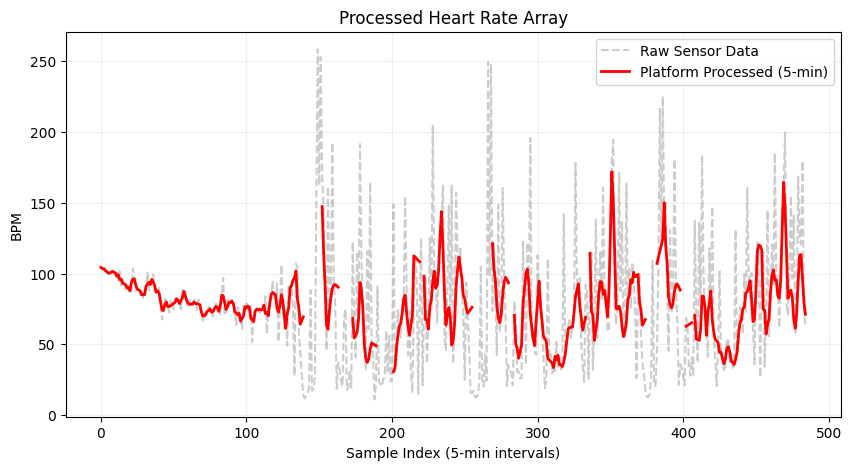

Input samples: 485
Processed samples: 485
Final average: 78.68 BPM


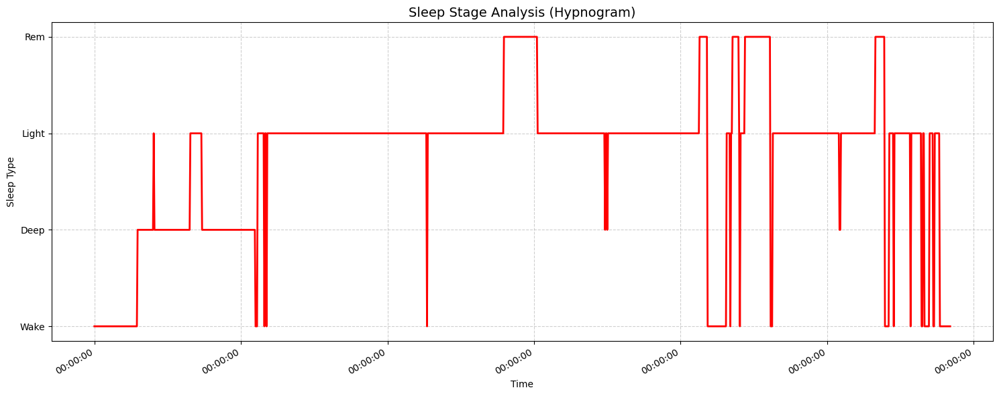

sleep_type
Light    777
Deep     148
Wake     130
Rem      114
Name: count, dtype: int64
485
485
SKIPPING
SKIPPING


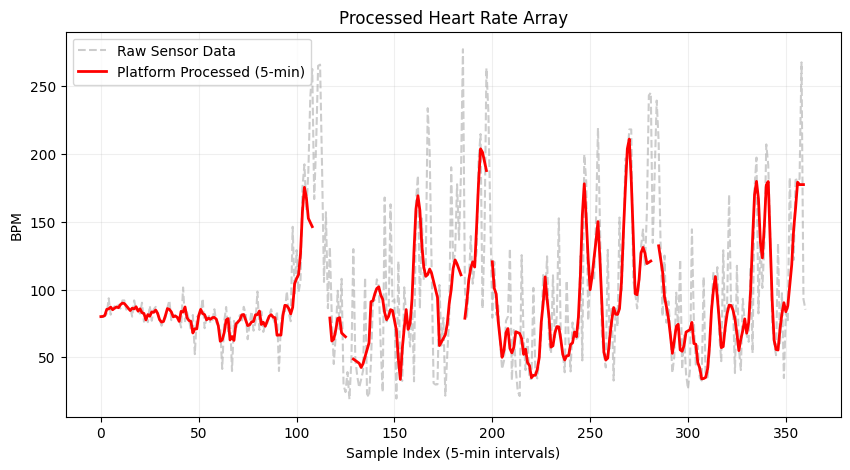

Input samples: 361
Processed samples: 361
Final average: 89.85 BPM


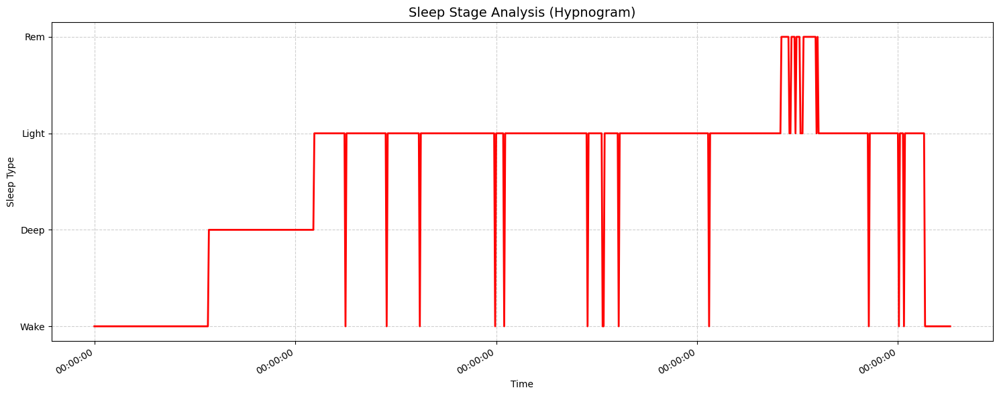

sleep_type
Light    565
Wake     153
Deep     105
Rem       30
Name: count, dtype: int64
361
361


In [6]:
df = pd.read_csv('/content/drive/MyDrive/Sleepingbeauty_v4_merged_test.csv', usecols=['hr_metrics', 'scoring'])
print(df.head() )

#raw_str = df['hr_metrics']
#raw_scoring = df['scoring']

def platform_style_preprocess(hr_array):
    """
    Accepts a list or NumPy array of heart rate values.
    Returns a cleaned and smoothed NumPy array.
    """
    # 1. Convert to Pandas Series for advanced windowing functions
    s = pd.Series(hr_array)

    # 2. Physiological Filter: Set impossible values to NaN
    # (Human range usually 30-220 BPM)
    s = s.where((s >= 30) & (s <= 220), np.nan)

    # 3. Outlier Removal: Detect sudden "unphysical" spikes
    # If a value deviates more than 40 BPM from its neighbors, it's likely noise
    rolling_median = s.rolling(window=3, center=True).median()
    s = s.where((s - rolling_median).abs() < 40, np.nan)

    # 4. Interpolation: Fill in the NaNs we just created (up to 2 consecutive missing points)
    # This keeps the timeline continuous
    s = s.interpolate(method='linear', limit=2)

    # 5. Smoothing: 15-minute moving average (window of 3 for 5-min intervals)
    # min_periods=1 ensures we get a value even at the very start/end of the array
    smoothed = s.rolling(window=3, center=True, min_periods=1).mean()

    # 6. Return as a clean NumPy array (filling any remaining NaNs with the mean)
    return smoothed.to_numpy()

def process_scoring(entry):
    parts = str(entry).split('|')
    parsed_data = []
    # Each record has 7 parts. We loop through the list in chunks of 7.
    # index 1 = sleep_type, index 6 = timestamp
    for i in range(0, len(parts), 7):
        try:
            # Ensure we have a full record (7 items)
            if (i + 6) < len(parts):
                sleep_type = parts[i + 1]
                timestamp_str = parts[i + 6]

                parsed_data.append({
                    'sleep_type': sleep_type,
                    'timestamp': timestamp_str
                })
        except IndexError:
            continue
    return parsed_data

# 2. Iterate through each row and process the data
for index, row in df.iterrows():
    raw_str = row['hr_metrics']

    #print(raw_str)
    # Skip empty rows
    if pd.isna(raw_str):
        print("SKIPPING")
        continue

    raw_scoring = row['scoring']
    if pd.isna(raw_scoring):
        print("SKIPPING 2")
        continue

    try:
        # 4. Preprocess: Convert pipe-string to NumPy array
        # HeartPy works best with float arrays
        hr_data = np.array([float(x) for x in str(raw_str).split('|')])
        # --- 2. Process using our new function ---
        processed_hr = platform_style_preprocess(hr_data)


        # --- 3. Plotting ---
        plt.figure(figsize=(10, 5))
        plt.plot(hr_data, label='Raw Sensor Data', color='gray', alpha=0.4, linestyle='--')
        plt.plot(processed_hr, label='Platform Processed (5-min)', color='red', linewidth=2)

        plt.title('Processed Heart Rate Array')
        plt.ylabel('BPM')
        plt.xlabel('Sample Index (5-min intervals)')
        plt.legend()
        plt.grid(True, alpha=0.2)
        plt.show()

        # Print results
        print(f"Input samples: {len(hr_data)}")
        print(f"Processed samples: {len(processed_hr)}")
        print(f"Final average: {np.nanmean(processed_hr):.2f} BPM")
        # Stop after 3 rows to avoid too many windows



        # REM
        sleep_df = pd.DataFrame(process_scoring(raw_scoring))
        distinct_list = sleep_df['sleep_type'].unique().tolist()
        #print(distinct_list)
        # 4. Preprocess Timestamps
        # We convert the strings into datetime objects for proper time-axis scaling
        sleep_df['timestamp'] = pd.to_datetime(sleep_df['timestamp'], format='%H:%M:%S.%f')
        #print(sleep_df.head())
        # 5. Preprocess Sleep Types (Categorical Ordering)
        # This ensures the Y-axis follows a logical order (Awake at top, Deep at bottom)
        stage_order = ['Wake', 'Rem', 'Light', 'Deep']
        #sleep_df['sleep_type'] = pd.Categorical(sleep_df['sleep_type'], categories=stage_order, ordered=True)
        # Map only the values that exist in our stage_order to avoid float/category conflicts
        sleep_df = sleep_df[sleep_df['sleep_type'].isin(stage_order)]

        sleep_df['sleep_type'] = pd.Categorical(
            sleep_df['sleep_type'],
            categories=stage_order,
            ordered=True
        )
        # Sort by time to ensure the lines connect correctly
        #sleep_df = sleep_df.sort_values('timestamp')
        #print(sleep_df['timestamp'])
        # 6. Plotting
        plt.figure(figsize=(15, 6))

        # Use a step plot to show transitions between stages
        #plt.step(sleep_df['sleep_type'], where='post', color='#58508d', linewidth=2)
        plt.plot(sleep_df['sleep_type'], label='Platform Processed (5-min)', color='red', linewidth=2)
        #plt.plot(processed_hr, label='Platform Processed (5-min)', color='blue', linewidth=1)

        # Add dots to show the actual data points
        #plt.scatter(sleep_df['timestamp'], sleep_df['sleep_type'], color='#ff6361', s=20, zorder=3)

        # Formatting the X-Axis (Time)
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
        plt.gcf().autofmt_xdate() # Tilt timestamps for readability

        plt.title('Sleep Stage Analysis (Hypnogram)', fontsize=14)
        plt.ylabel('Sleep Type')
        plt.xlabel('Time')
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()

        plt.show()

        print(sleep_df['sleep_type'].value_counts())
        print(hr_data.size)
        print(processed_hr.size)

        if index >= 2:
            break

    except Exception as e:
        print(f"Could not process row {index}: {e}")


# **Data Cleaning and model experimentation - Dont run it**

In [6]:
!pip install xgboost tensorflow

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import warnings

warnings.filterwarnings('ignore')

In [8]:
# PHASE 0: DATA PREPARATION & HR METRIC EXTRACTION
def parse_hr_metrics(hr_str):
    """Parses pipe-separated HR string into Mean and StdDev."""
    if pd.isna(hr_str) or hr_str == '':
        return np.nan, np.nan
    try:
        # Split string by '|', convert to float, ignore empty strings
        values = [float(x) for x in str(hr_str).split('|') if x.strip()]
        if not values:
            return np.nan, np.nan
        return np.mean(values), np.std(values)
    except:
        return np.nan, np.nan

# 1. Load Data
df = pd.read_csv('/content/drive/MyDrive/Sleepingbeauty_v5_csv.csv')
# 2. Date Handling
df['diary_date'] = pd.to_datetime(df['diary_date'], errors='coerce')
df = df.dropna(subset=['diary_date']).sort_values('diary_date').set_index('diary_date')

# 3. Handle Sleep Time (Merge Sensor and Manual)
# Priority: stat_total_sleep_time_minutes. If missing, assume it might be a manual attack entry
df['sleep_minutes'] = pd.to_numeric(df['stat_total_sleep_time_minutes'], errors='coerce')

# 4. Extract HR Metrics
print("Extracting Heart Rate Metrics...")
hr_data = df['hr_metrics'].apply(parse_hr_metrics)
df['hr_mean'] = hr_data.apply(lambda x: x[0])
df['hr_std'] = hr_data.apply(lambda x: x[1])

# 5. Handle Missing Dates (The "Hidden" Attacks)
# We create a full date range. Any date missing in original is considered an attack day
full_idx = pd.date_range(start=df.index.min(), end=df.index.max(), freq='D')
df_full = df.reindex(full_idx)

# Logic: If 'sleep_minutes' is NaN after reindexing, it was a missing date -> Attack
# Logic: If 'sleep_minutes' > 960 (16 hours) -> Attack
df_full['is_attack'] = 0

# Mark explicitly recorded long sleep
df_full.loc[df_full['sleep_minutes'] > 960, 'is_attack'] = 1

# Mark missing dates (gaps) as attacks, assuming patient slept through them
missing_mask = df_full['sleep_minutes'].isna()
df_full.loc[missing_mask, 'is_attack'] = 1
df_full.loc[missing_mask, 'sleep_minutes'] = 1200 # Impute 20 hours for missing days

# 6. HR Normalization & Imputation
# Forward fill HR metrics (assuming physiology doesn't jump wildly during gaps)
df_full['hr_mean'] = df_full['hr_mean'].fillna(method='ffill').fillna(method='bfill')
df_full['hr_std'] = df_full['hr_std'].fillna(method='ffill').fillna(method='bfill')

# Normalize HR Metrics (Z-Score)
scaler = StandardScaler()
df_full[['hr_mean_norm', 'hr_std_norm']] = scaler.fit_transform(df_full[['hr_mean', 'hr_std']])

print(f"Total Days Analyzed: {len(df_full)}")
print(f"Total Attack Days Identified: {df_full['is_attack'].sum()}")
print("-" * 30)

Extracting Heart Rate Metrics...
Total Days Analyzed: 128
Total Attack Days Identified: 23
------------------------------


In [9]:
# ==============================================================================
# PHASE 1: BASELINE (Cycle Heuristic)
# ==============================================================================
print("\n--- PHASE 1: Baseline (Cycle Analysis) ---")

# Identify start dates of attack episodes
# An episode starts if today is an attack and yesterday was not
df_full['attack_start'] = (df_full['is_attack'] == 1) & (df_full['is_attack'].shift(1) == 0)
attack_dates = df_full[df_full['attack_start']].index

if len(attack_dates) < 2:
    print("Not enough episodes to calculate a cycle.")
else:
    # Calculate days between episodes
    cycles = attack_dates.to_series().diff().dt.days.dropna()
    avg_cycle = cycles.mean()
    std_cycle = cycles.std()
    last_attack = attack_dates[-1]

    next_attack_est = last_attack + pd.Timedelta(days=avg_cycle)

    print(f"Average Cycle Length: {avg_cycle:.1f} days (+/- {std_cycle:.1f})")
    print(f"Last Episode Start: {last_attack.date()}")
    print(f"PREDICTION: Next attack estimated around {next_attack_est.date()}")


--- PHASE 1: Baseline (Cycle Analysis) ---
Average Cycle Length: 6.9 days (+/- 2.4)
Last Episode Start: 2024-04-26
PREDICTION: Next attack estimated around 2024-05-02


In [10]:
print(df_full.head())

            Unnamed: 0           username  level  \
2023-12-23         1.0  harry@caloran.com    1.0   
2023-12-24         2.0  harry@caloran.com    1.0   
2023-12-25         NaN  harry@caloran.com    1.0   
2023-12-26         3.0  harry@caloran.com    1.0   
2023-12-27         4.0  harry@caloran.com    1.0   

                               scoring_result_id        stat_bed_time  \
2023-12-23  2b17f94c-3d15-4ce6-9ba0-b7e6b880580c  2024-04-11 23:02:00   
2023-12-24                                   NaN                  NaN   
2023-12-25                                   NaN                  NaN   
2023-12-26  1f7d3aba-302e-48a6-934b-d6d8f43aa99b  2024-04-11 23:34:00   
2023-12-27  6fb23859-b525-43ac-b979-2282532a6844  2024-04-12 01:02:00   

           stat_sleep_time  stat_time_to_sleep_minutes  \
2023-12-23        23:13:00                        11.0   
2023-12-24        00:55:00                         NaN   
2023-12-25             NaN                         NaN   
2023-12-26      

In [11]:
# ==============================================================================
# PHASE 3: MACHINE LEARNING (XGBoost Analysis) - FIXED
# ==============================================================================
print("\n--- PHASE 3: Machine Learning (Parameter Analysis) ---")

# 1. Feature Engineering
df_ml = df_full.copy()

# Temporal Features
df_ml['day_of_year'] = df_ml.index.dayofyear
df_ml['weekday'] = df_ml.index.weekday

# Physiological Features (Lags)
df_ml['hr_mean_lag1'] = df_ml['hr_mean_norm'].shift(1)
df_ml['hr_std_lag1'] = df_ml['hr_std_norm'].shift(1)
df_ml['sleep_lag1'] = df_ml['sleep_minutes'].shift(1)

# Rolling Averages
df_ml['hr_mean_rolling_7'] = df_ml['hr_mean_norm'].rolling(3).mean()
df_ml['sleep_rolling_7'] = df_ml['sleep_minutes'].rolling(3).mean()

# Days since last attack
df_ml['days_since_attack'] = df_ml.groupby((df_ml['is_attack'] == 1).cumsum()).cumcount()

# Target: Predict if tomorrow is an attack
df_ml['target_tomorrow'] = df_ml['is_attack'].shift(-1)

# --- FIX 1: Clean Data rigorously ---
df_ml = df_ml.dropna()
# Ensure target is Integer (0 or 1), not Float (0.0 or 1.0)
df_ml['target_tomorrow'] = df_ml['target_tomorrow'].astype(int)

# 2. Train XGBoost
features = ['days_since_attack', 'hr_mean_norm', 'hr_std_norm',
            'sleep_rolling_7', 'hr_mean_rolling_7', 'sleep_lag1']
X = df_ml[features]
y = df_ml['target_tomorrow']

# Train/Test Split
split_idx = int(len(X) * 0.8)
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

# --- FIX 2: Safe Class Imbalance Calculation ---
num_pos = (y_train == 1).sum()
num_neg = (y_train == 0).sum()

print(f"Training Data - Normal Days: {num_neg}, Attack Days: {num_pos}")

if num_pos == 0:
    print("WARNING: Training set has NO attacks. Model cannot learn to predict attacks.")
    # Fallback to avoid division by zero error, though model will be poor
    scale_pos = 1.0
else:
    scale_pos = num_neg / num_pos

# --- FIX 3: Explicit Base Score ---
# We add base_score=0.5 to prevent XGBoost from auto-calculating invalid start values
model = xgb.XGBClassifier(
    base_score=0.5,
    scale_pos_weight=scale_pos,
    eval_metric='logloss',
    random_state=42
)

try:
    model.fit(X_train, y_train)

    # 3. Evaluation & Feature Importance
    preds = model.predict(X_test)
    print("\nClassification Report (Predicting Attack Tomorrow):")
    # Handle case where Test set might only have one class
    if len(np.unique(y_test)) > 1:
        print(classification_report(y_test, preds))
    else:
        print("Test set contains only one class. Accuracy:", (y_test == preds).mean())

    # Feature Importance
    importance = pd.DataFrame({'Feature': features, 'Importance': model.feature_importances_})
    importance = importance.sort_values(by='Importance', ascending=False)
    print("\nTop Parameters Contributing to Attack:")
    print(importance)

    # 4. Predict Next Attack Loop
    print("\n--- PREDICTING NEXT ATTACK DATE ---")
    current_state = df_ml.iloc[-1].copy()
    current_date = df_ml.index[-1]
    found = False

    for i in range(1, 60): # Look 60 days ahead
        next_date = current_date + pd.Timedelta(days=1)

        # Update state (Simulation)
        current_state['days_since_attack'] += 1
        current_state['hr_mean_norm'] = 0

        # Predict
        input_data = pd.DataFrame([current_state[features]])
        prob = model.predict_proba(input_data)[0, 1]

        if prob > 0.5:
            print(f"XGBoost Model predicts high risk of attack on: {next_date.date()} (Prob: {prob:.2f})")
            found = True
            break

        current_date = next_date

    if not found:
        print("No attack predicted in the next 60 days by the ML model.")

except Exception as e:
    print(f"Model training failed: {e}")
    print("Tip: If you have very few attacks, try increasing the dataset size.")


--- PHASE 3: Machine Learning (Parameter Analysis) ---
Training Data - Normal Days: 0, Attack Days: 0

Classification Report (Predicting Attack Tomorrow):
Test set contains only one class. Accuracy: nan

Top Parameters Contributing to Attack:
             Feature  Importance
0  days_since_attack         0.0
1       hr_mean_norm         0.0
2        hr_std_norm         0.0
3    sleep_rolling_7         0.0
4  hr_mean_rolling_7         0.0
5         sleep_lag1         0.0

--- PREDICTING NEXT ATTACK DATE ---
Model training failed: single positional indexer is out-of-bounds
Tip: If you have very few attacks, try increasing the dataset size.


In [12]:
# ==============================================================================
# PHASE 4: DEEP LEARNING (LSTM) - ROBUST FIX
# ==============================================================================
print("\n--- PHASE 4: Deep Learning (LSTM) ---")

# 1. Re-prepare Data for LSTM to ensure it's not empty
# We go back to df_full to ensure we have the raw data
df_lstm = df_full.copy()

# Feature Engineering (Same as Phase 3 but robust to NaNs)
df_lstm['hr_mean_norm'] = df_lstm['hr_mean_norm'].fillna(0) # Fill missing HR with mean (0)
df_lstm['hr_std_norm'] = df_lstm['hr_std_norm'].fillna(0)

# Create Lags & Rolling with Fill
df_lstm['days_since_attack'] = df_lstm.groupby((df_lstm['is_attack'] == 1).cumsum()).cumcount()

# Use 3-day rolling instead of 7 if data is scarce, and fill gaps
df_lstm['hr_mean_rolling'] = df_lstm['hr_mean_norm'].rolling(3, min_periods=1).mean().fillna(df_lstm['hr_mean_norm'])
df_lstm['sleep_rolling'] = df_lstm['sleep_minutes'].rolling(3, min_periods=1).mean().fillna(df_lstm['sleep_minutes'])
df_lstm['sleep_lag1'] = df_lstm['sleep_minutes'].shift(1).fillna(480) # Assume 8 hours sleep if unknown

# Define Features
features_lstm = ['days_since_attack', 'hr_mean_norm', 'hr_std_norm',
                 'sleep_rolling', 'hr_mean_rolling', 'sleep_lag1']

# Target
df_lstm['target_tomorrow'] = df_lstm['is_attack'].shift(-1).fillna(0)

# Select data
X_data = df_lstm[features_lstm]
y_data = df_lstm['target_tomorrow']

# Check if data exists
if len(X_data) < 10:
    print("Error: Not enough data points to train LSTM (Need > 10 days).")
else:
    # 2. Scaling
    scaler_lstm = MinMaxScaler()
    try:
        scaled_data = scaler_lstm.fit_transform(X_data)

        # 3. Create Sequences
        look_back = 3 # Reduced look_back from 7 to 3 to handle smaller datasets
        X_seq, y_seq = [], []

        for i in range(look_back, len(scaled_data)):
            X_seq.append(scaled_data[i-look_back:i])
            y_seq.append(y_data.iloc[i])

        X_seq, y_seq = np.array(X_seq), np.array(y_seq)

        if len(X_seq) == 0:
            print("Error: Sequence creation resulted in empty array. Dataset too short for Look-back.")
        else:
            # 4. Build & Train Model
            model_lstm = Sequential()
            model_lstm.add(LSTM(32, input_shape=(look_back, len(features_lstm)), return_sequences=False))
            model_lstm.add(Dropout(0.2))
            model_lstm.add(Dense(1, activation='sigmoid'))
            model_lstm.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

            # Train (Suppressed output)
            model_lstm.fit(X_seq, y_seq, epochs=30, batch_size=4, verbose=0)
            print("LSTM Model Trained Successfully.")

            # 5. Predict Tomorrow
            # Take the last 'look_back' days from the data
            last_sequence = scaled_data[-look_back:]
            last_sequence = last_sequence.reshape((1, look_back, len(features_lstm)))

            prediction = model_lstm.predict(last_sequence, verbose=0)[0][0]
            print(f"LSTM Probability of attack tomorrow: {prediction:.4f}")

            if prediction > 0.5:
                print(">> ALERT: LSTM detects patterns consistent with an oncoming attack.")
            else:
                print(">> Status: LSTM predicts normal stability for tomorrow.")

    except Exception as e:
        print(f"LSTM Error: {e}")


--- PHASE 4: Deep Learning (LSTM) ---
LSTM Model Trained Successfully.
LSTM Probability of attack tomorrow: 0.1985
>> Status: LSTM predicts normal stability for tomorrow.


# **Data processing and Model Testing Phase 2**

In [7]:
import pandas as pd
import io

# 1. Load the data
try:
    df = pd.read_csv('/content/drive/MyDrive/Sleepingbeauty_v5_csv.csv')
    print("File loaded successfully.\n")
except Exception as e:
    print(f"Error loading file: {e}")
    # Stop here if file not found, otherwise continue

# 2. Display all columns and their data types
print(f"Total Columns: {len(df.columns)}")
print("-" * 30)
print("List of all columns:")
for col in df.columns:
    print(f"- {col}")

# 3. Preview the 'Complex' columns (The ones with strings)
print("\n" + "-" * 30)
print("Preview of complex string columns (First 2 rows):")
cols_to_check = ['hr_metrics', 'ranked_stats', 'sleep_factors']
for col in cols_to_check:
    if col in df.columns:
        print(f"\n[{col}]:")
        print(df[col].head(2).values)

File loaded successfully.

Total Columns: 70
------------------------------
List of all columns:
- Unnamed: 0
- username
- level
- diary_date
- scoring_result_id
- stat_bed_time
- stat_sleep_time
- stat_time_to_sleep_minutes
- stat_sleep_interruption_count
- stat_sleep_interruption_minutes
- stat_wake_time
- stat_out_of_bed_time
- stat_total_sleep_time_minutes
- stat_bed_time_deviation_minutes
- subjective_sleep_time
- subjective_sleep_interruption_count
- subjective_sleep_interruption_minutes
- sleep_quality
- sleep_score_averaged
- sleep_score
- SE
- TIB
- TSP
- TST
- WTSP
- WTSP_2
- WASO
- SOL_5
- SOL_10
- SOL_AASM
- deep
- deepPercent
- NOA
- NOA_2
- NREM
- REM
- WAFA
- REM_FH
- REM_SH
- REMPercent
- NREMPercent
- SOL_REM
- SOL_DEEP
- lightPercent
- wake
- light
- SME
- NSS
- LGHT_FH
- LGHT_SH
- DEEP_FH
- DEEP_SH
- FA
- workfree_day
- workfree_day_tomorrow
- SSC
- bed_time
- out_of_bed_time
- mode
- subjective_SOL
- data_type
- WeekDay
- WeekEnd
- level_num
- Unnamed: 64
- hr_metri

In [14]:
'''
import pandas as pd
import numpy as np
from scipy.signal import medfilt
from scipy.stats import zscore

import numpy as np
import pandas as pd
from scipy.signal import medfilt

def preprocess_hr_metrics(hr_string):
    if pd.isna(hr_string):
        return pd.Series({
            "hr_mean": np.nan,
            "hr_std": np.nan,
            "hr_min": np.nan,
            "hr_max": np.nan,
            "hr_trend": np.nan,
            "hr_missing_pct": 100.0,
            "hr_bin_30_60_pct": np.nan,
            "hr_bin_60_120_pct": np.nan,
            "hr_bin_120_180_pct": np.nan,
            "hr_bin_180_220_pct": np.nan,
        })

    # -----------------------------
    # Safe parsing
    # -----------------------------
    invalid_tokens = {"", "null", "nan", "None", "NONE", "NaN"}
    hr_raw = []

    for x in str(hr_string).split("|"):
        x = x.strip()
        if x not in invalid_tokens:
            try:
                hr_raw.append(float(x))
            except ValueError:
                continue

    hr_raw = np.array(hr_raw)

    if len(hr_raw) == 0:
        return pd.Series({
            "hr_mean": np.nan,
            "hr_std": np.nan,
            "hr_min": np.nan,
            "hr_max": np.nan,
            "hr_trend": np.nan,
            "hr_missing_pct": 100.0,
            "hr_bin_30_60_pct": np.nan,
            "hr_bin_60_120_pct": np.nan,
            "hr_bin_120_180_pct": np.nan,
            "hr_bin_180_220_pct": np.nan,
        })

    # -----------------------------
    # Physiological filtering
    # -----------------------------
    hr_valid = hr_raw[(hr_raw >= 30) & (hr_raw <= 220)]

    if len(hr_valid) == 0:
        return pd.Series({
            "hr_mean": np.nan,
            "hr_std": np.nan,
            "hr_min": np.nan,
            "hr_max": np.nan,
            "hr_trend": np.nan,
            "hr_missing_pct": 100.0,
            "hr_bin_30_60_pct": np.nan,
            "hr_bin_60_120_pct": np.nan,
            "hr_bin_120_180_pct": np.nan,
            "hr_bin_180_220_pct": np.nan,
        })

    # -----------------------------
    # Artifact removal (sudden jumps)
    # -----------------------------
    diff = np.abs(np.diff(hr_valid))
    hr_valid = hr_valid[np.insert(diff < 40, 0, True)]

    # -----------------------------
    # Median filtering
    # -----------------------------
    if len(hr_valid) >= 3:
        hr_smooth = medfilt(hr_valid, kernel_size=3)
    else:
        hr_smooth = hr_valid

    # -----------------------------
    # Core HR features
    # -----------------------------
    hr_mean = hr_smooth.mean()
    hr_std = hr_smooth.std(ddof=1) if len(hr_smooth) > 1 else 0.0
    hr_min = hr_smooth.min()
    hr_max = hr_smooth.max()

    time_idx = np.arange(len(hr_smooth))
    hr_trend = np.polyfit(time_idx, hr_smooth, 1)[0] if len(hr_smooth) > 1 else 0.0

    hr_missing_pct = 100 * (1 - len(hr_smooth) / len(hr_raw))

    # -----------------------------
    # Heart-rate bins
    # -----------------------------
    total = len(hr_smooth)

    hr_bin_30_60_pct = np.sum((hr_smooth >= 30) & (hr_smooth < 60)) / total * 100
    hr_bin_60_120_pct = np.sum((hr_smooth >= 60) & (hr_smooth < 120)) / total * 100
    hr_bin_120_180_pct = np.sum((hr_smooth >= 120) & (hr_smooth < 180)) / total * 100
    hr_bin_180_220_pct = np.sum((hr_smooth >= 180) & (hr_smooth <= 220)) / total * 100

    return pd.Series({
        "hr_mean": hr_mean,
        "hr_std": hr_std,
        "hr_min": hr_min,
        "hr_max": hr_max,
        "hr_trend": hr_trend,
        "hr_missing_pct": hr_missing_pct,
        "hr_bin_30_60_pct": hr_bin_30_60_pct,
        "hr_bin_60_120_pct": hr_bin_60_120_pct,
        "hr_bin_120_180_pct": hr_bin_120_180_pct,
        "hr_bin_180_220_pct": hr_bin_180_220_pct,
    }), hr_smooth

# -------------------------------------------------
# 3. Apply preprocessing
# -------------------------------------------------
for i in range(len(df)):
  if pd.isna(df["hr_metrics"][i]):
    continue
  # -------------------------------------------------
  processed_hr_df, hr_smooth = preprocess_hr_metrics(df["hr_metrics"][i])
  print(processed_hr_df)
  print(hr_smooth)
  # -------------------------------------------------
  # 4. Final processed DataFrame
  # -------------------------------------------------
final_df = pd.concat([df, processed_hr_df, print(hr_smooth)], axis=1)

# -------------------------------------------------
# 5. Preview
# -------------------------------------------------
print(final_df.head())
'''


hr_mean                78.575676
hr_std                 24.294999
hr_min                 30.986000
hr_max                180.243000
hr_trend               -0.056489
hr_missing_pct         40.824742
hr_bin_30_60_pct       18.118467
hr_bin_60_120_pct      77.351916
hr_bin_120_180_pct      3.832753
hr_bin_180_220_pct      0.696864
dtype: float64
[104.311 104.311 103.584 102.52  100.339 100.324 100.324 100.381 102.029
 102.029 100.806  98.392 100.806  94.971  95.776  92.865  92.865  92.865
  89.43   91.121  86.958  91.121  97.467  97.467  89.641  89.641  89.641
  87.787  84.859  84.23   84.23   88.333  88.333  93.123  93.123  95.15
  95.15   87.418  87.122  87.418  86.07   82.586  72.277  72.277  81.187
  81.187  76.285  76.285  78.142  78.142  78.142  80.356  81.954  80.923
  80.923  80.923  86.349  87.546  86.349  78.319  78.319  76.977  77.688
  77.688  80.537  80.537  80.537  79.255  79.255  72.971  70.725  70.725
  70.725  72.556  74.412  74.412  74.14   74.14   75.388  75.388  74.662

In [8]:
import pandas as pd
import numpy as np

# 1. Load the original file
try:
    df = pd.read_csv('/content/drive/MyDrive/Sleepingbeauty_v5_csv.csv')
    print("File loaded successfully.")
except FileNotFoundError:
    print("Error: 'Sleepingbeauty_v5_csv.csv' not found.")
    df = pd.DataFrame()

if not df.empty:
    # 2. Define columns to keep (REMOVED 'stat_wake_time')
    columns_to_keep = [
        'diary_date', 'scoring_result_id', 'stat_bed_time', 'stat_sleep_time',
        'stat_time_to_sleep_minutes', 'stat_sleep_interruption_count',
        'stat_sleep_interruption_minutes', 'stat_out_of_bed_time',
        'stat_total_sleep_time_minutes', 'stat_bed_time_deviation_minutes',
        'subjective_sleep_interruption_count', 'subjective_sleep_interruption_minutes',
        'sleep_quality', 'sleep_score_averaged', 'sleep_score', 'SE', 'TIB', 'TSP',
         'WTSP', 'WTSP_2', 'WASO', 'SOL_5', 'SOL_10', 'SOL_AASM', 'deep',
        'deepPercent', 'NOA', 'NOA_2', 'NREM', 'REM', 'WAFA', 'REM_FH', 'REM_SH',
        'REMPercent', 'NREMPercent', 'SOL_REM', 'SOL_DEEP', 'lightPercent', 'wake',
        'light', 'SME', 'NSS', 'LGHT_FH', 'LGHT_SH', 'DEEP_FH', 'DEEP_SH', 'FA',
        'workfree_day', 'workfree_day_tomorrow', 'bed_time', 'out_of_bed_time',
        'mode', 'subjective_SOL', 'WeekDay', 'WeekEnd', 'hr_metrics', 'sleep_factors'
    ]

    # Filter columns
    existing_cols = [col for col in columns_to_keep if col in df.columns]
    df_clean = df[existing_cols].copy()

    # 3. Ensure Sleep Minutes is Numeric
    # Coerce errors to NaN to prevent crashes on bad data
    df_clean['stat_total_sleep_time_minutes'] = pd.to_numeric(
        df_clean['stat_total_sleep_time_minutes'],
        errors='coerce'
    )

    # 4. Define 'is_attack' Logic
    # Condition 1: Missing Scoring ID (Manual entry usually implies attack context here)
    cond_missing_id = df_clean['scoring_result_id'].isna()
    # Condition 2: Sleep > 900 minutes (15 hours)
    cond_long_sleep = df_clean['stat_total_sleep_time_minutes'] > 900 #15 hours

    df_clean['is_attack'] = ( cond_long_sleep).astype(int)

    # 5. Define 'is_slept' Logic
    # 1 if sleep > 0, else 0 (handles 0, NaN, and NaT as 0)
    df_clean['is_slept'] = (df_clean['stat_total_sleep_time_minutes'].fillna(0) > 0).astype(int)

    # 6. Format Date and Sort
    df_clean['diary_date'] = pd.to_datetime(df_clean['diary_date'], errors='coerce')
    df_clean = df_clean.sort_values('diary_date')

    # 7. Display Summary
    print("-" * 30)
    print("DATA PROCESSING COMPLETE")
    print("-" * 30)
    print(f"Total Rows: {len(df_clean)}")
    print(f"Attack Days Identified: {df_clean['is_attack'].sum()}")
    print(f"Days with Sleep Recorded (is_slept=1): {df_clean['is_slept'].sum()}")
    print("-" * 30)

    # Show examples
    cols_to_show = ['diary_date', 'stat_total_sleep_time_minutes', 'is_attack', 'is_slept']
    print("\nSample Data (First 10 rows):")
    print(df_clean[cols_to_show].head(10))

    # Optional: Save
    df_clean.to_csv('SleepingBeauty_Processed.csv', index=False)
    print("\nFile saved as: SleepingBeauty_Processed.csv")

File loaded successfully.
------------------------------
DATA PROCESSING COMPLETE
------------------------------
Total Rows: 126
Attack Days Identified: 20
Days with Sleep Recorded (is_slept=1): 100
------------------------------

Sample Data (First 10 rows):
  diary_date  stat_total_sleep_time_minutes  is_attack  is_slept
0 2023-12-23                            522          0         1
1 2023-12-24                           1015          1         1
2 2023-12-25                              0          0         0
3 2023-12-26                            402          0         1
4 2023-12-27                            327          0         1
5 2023-12-28                            667          0         1
6 2023-12-29                            371          0         1
7 2023-12-30                            646          0         1
8 2023-12-31                            481          0         1
9 2024-01-01                            291          0         1

File saved as: SleepingB

plot
485
287


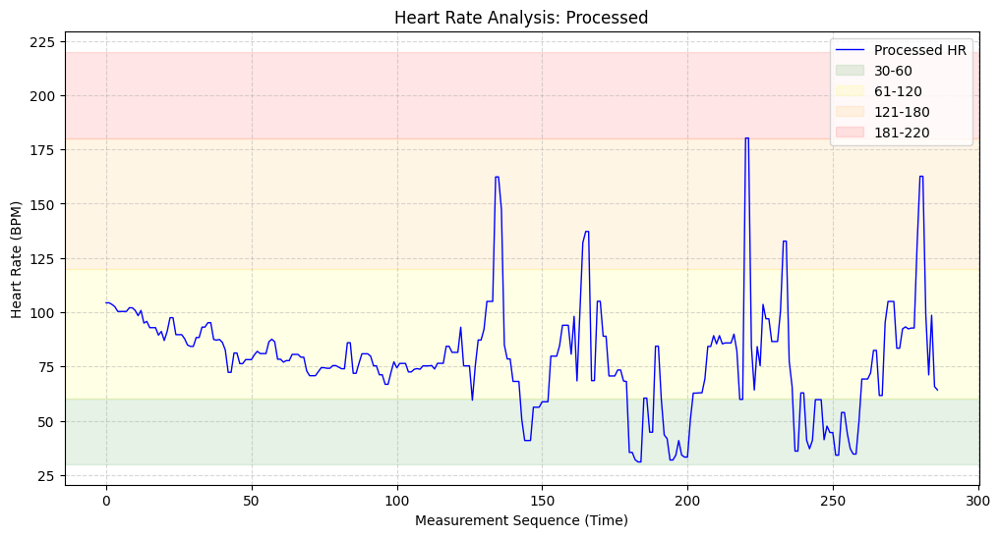

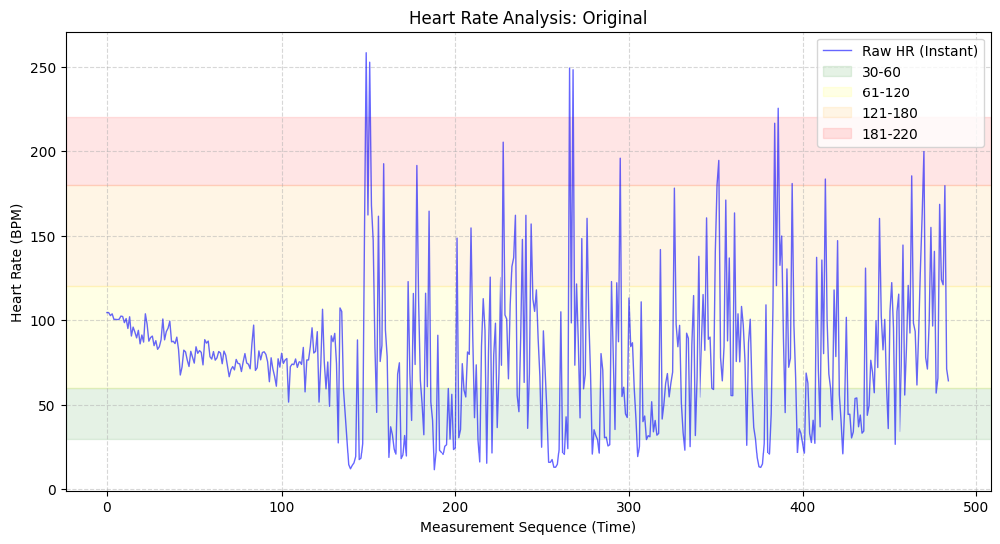

plot
361
224


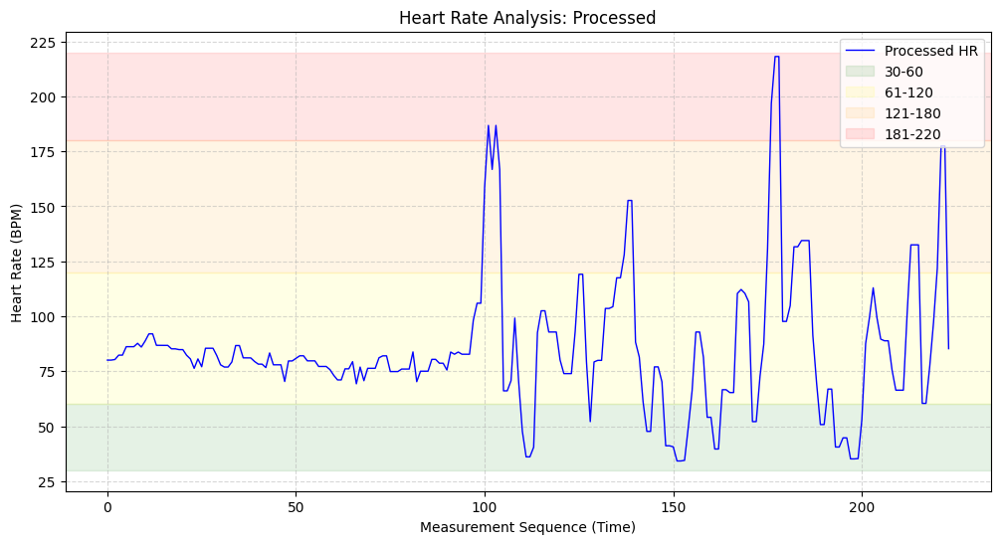

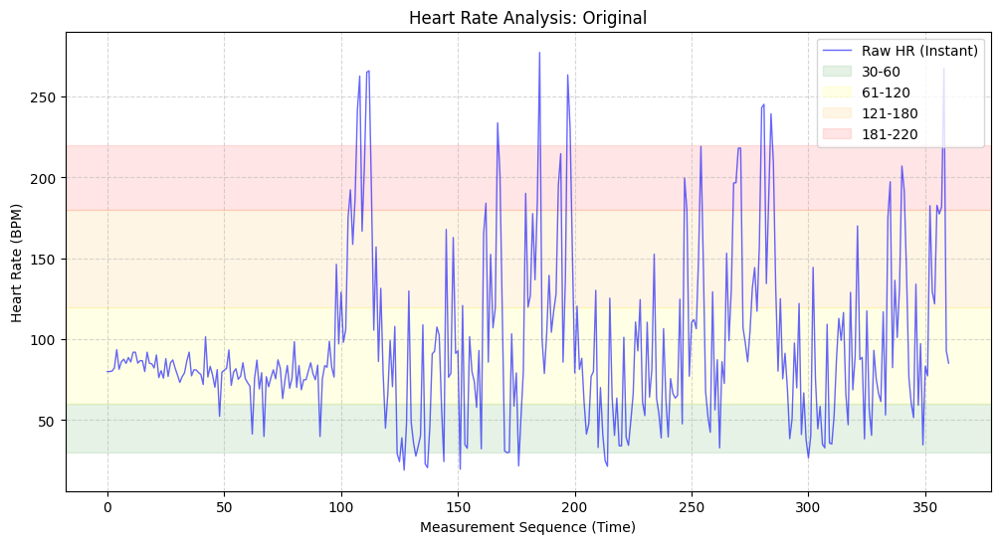

plot
293
191


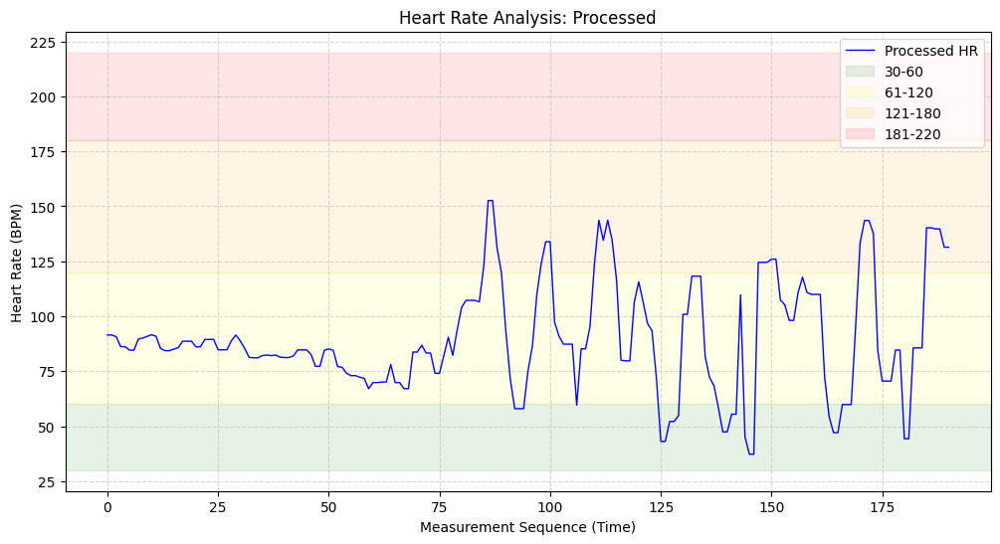

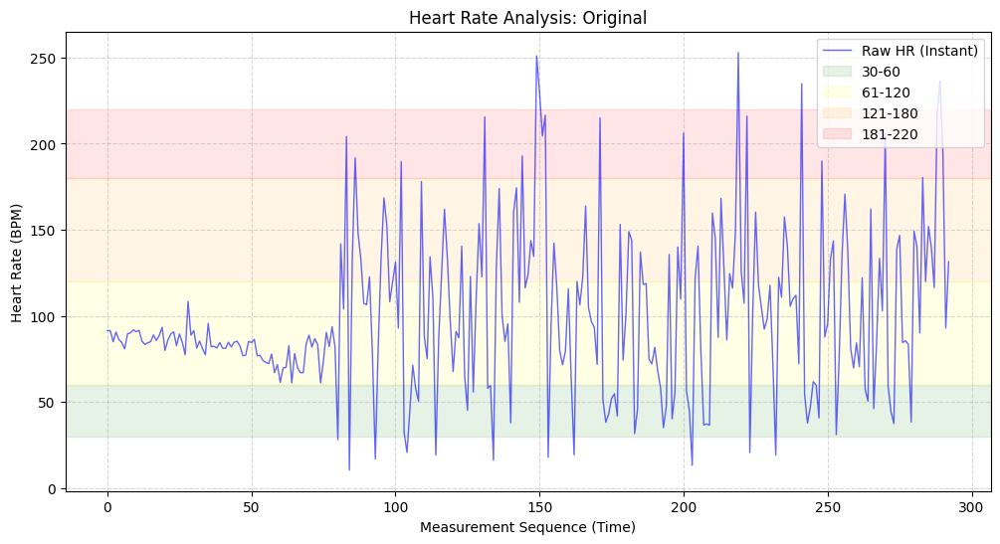

plot
621
405


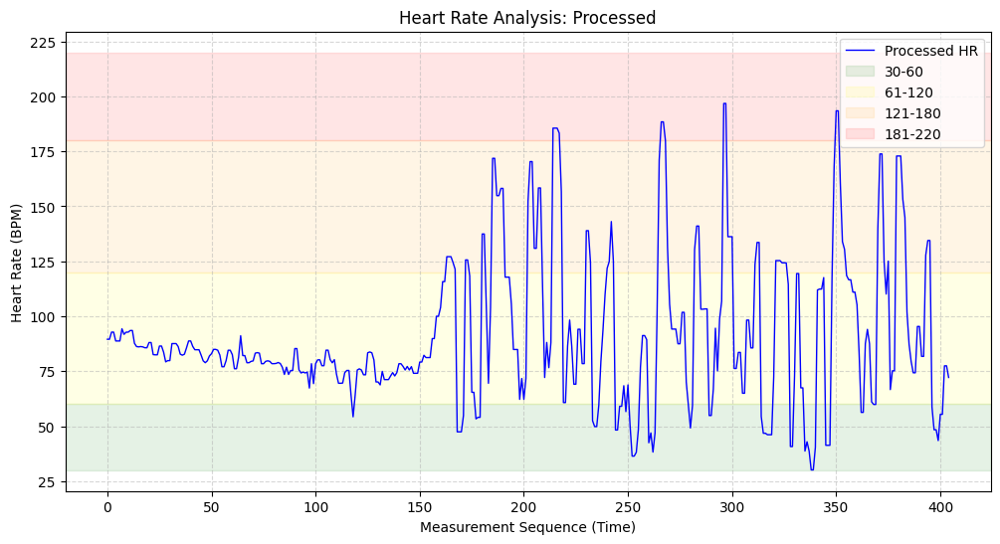

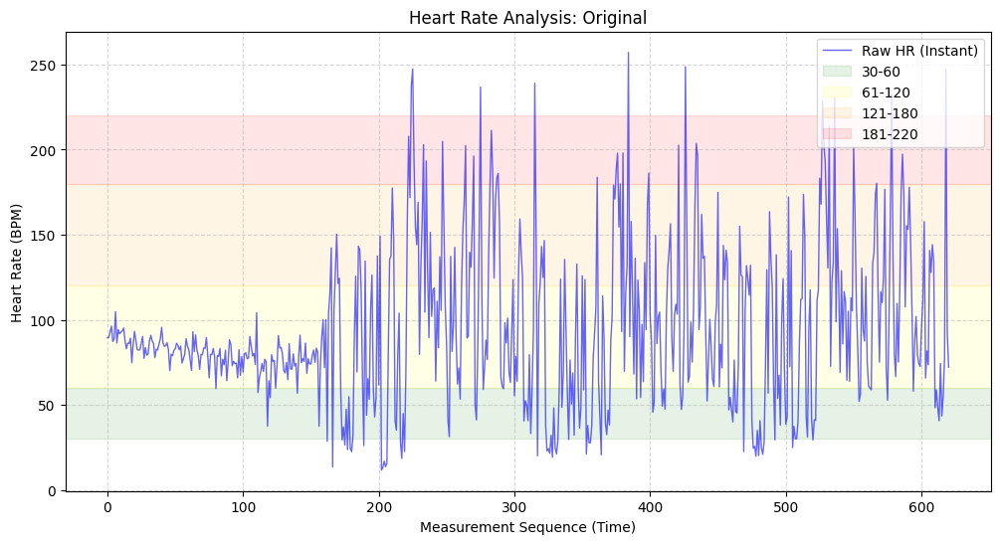

plot
581
376


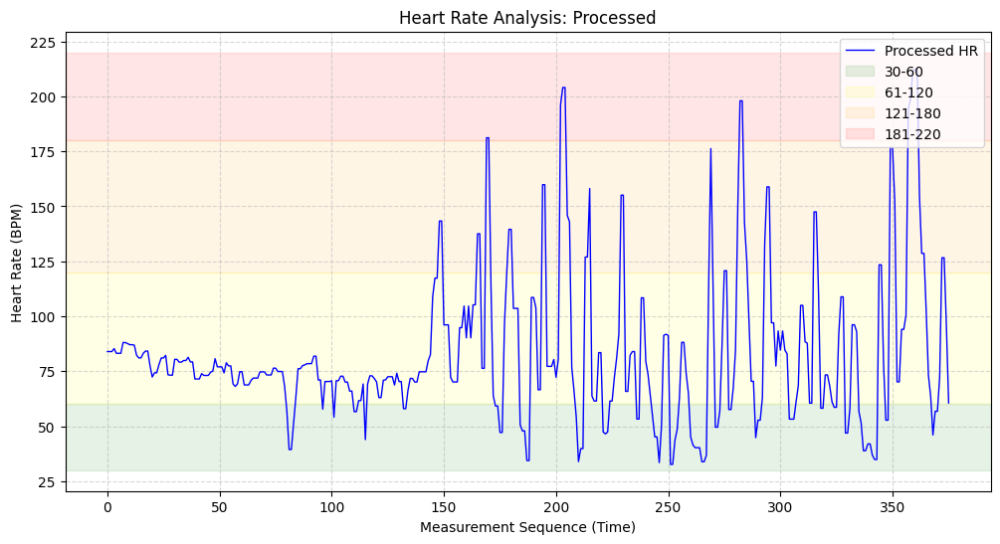

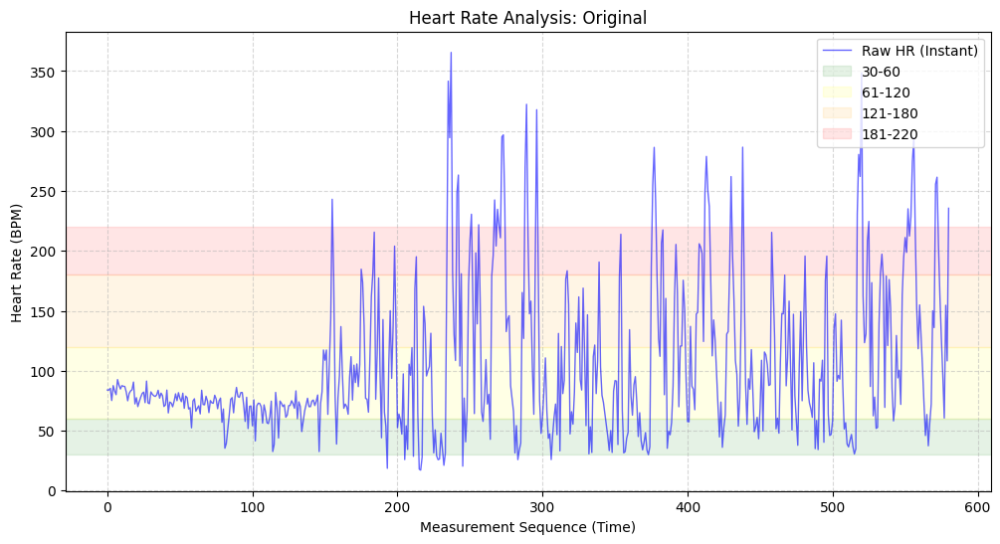

plot
427
292


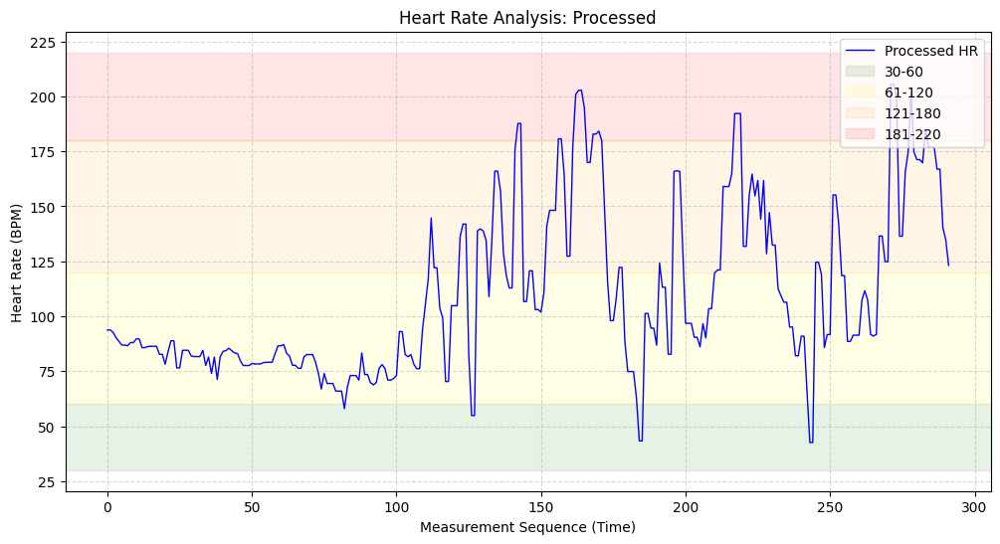

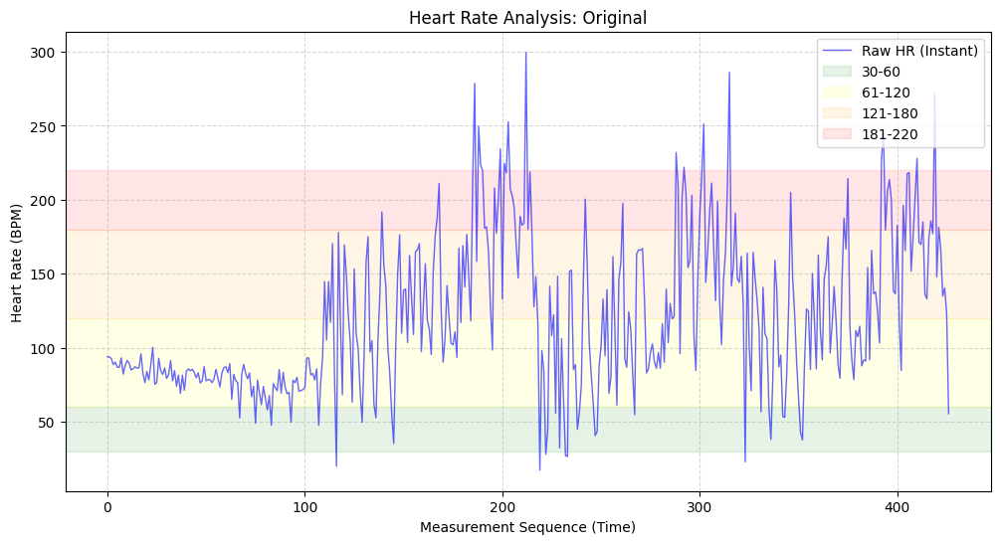

plot
261
169


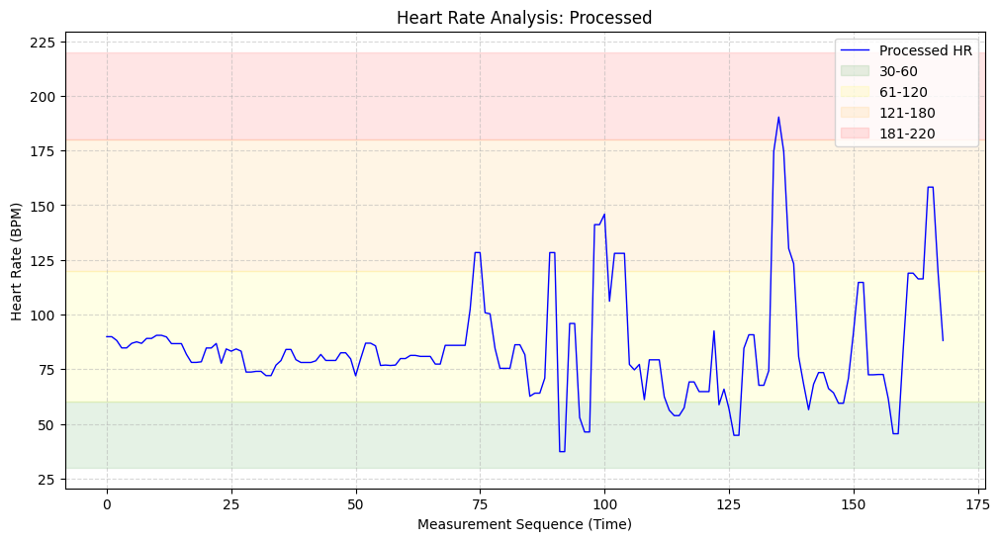

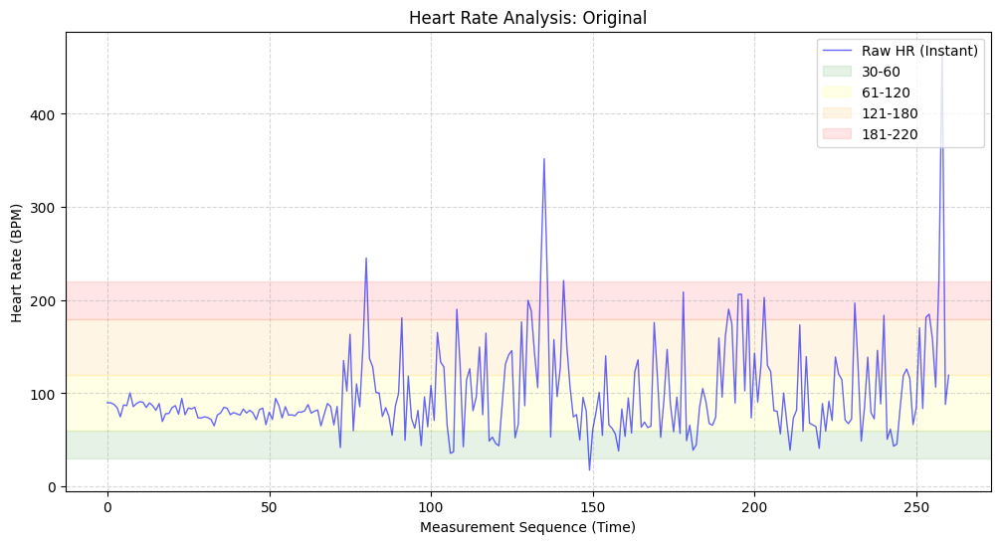

plot
305
197


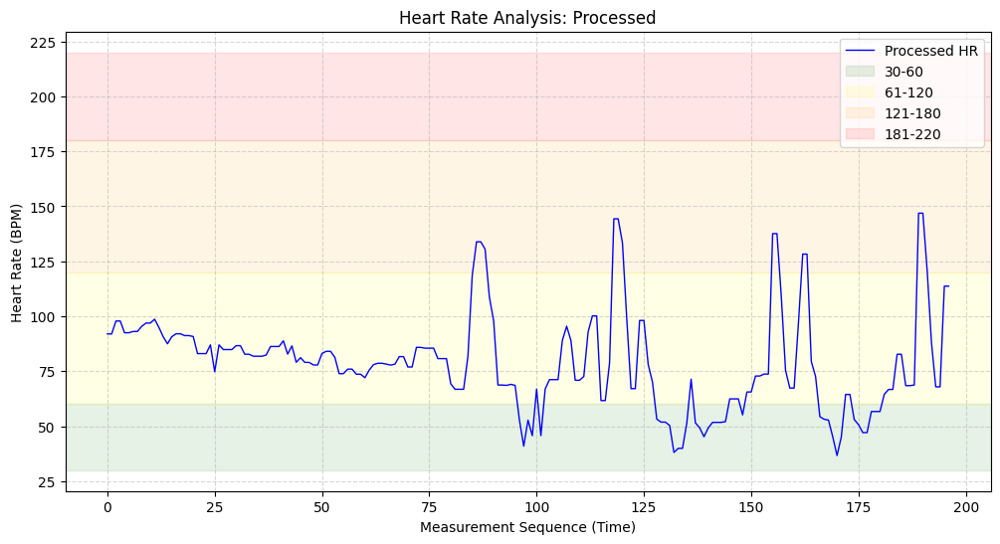

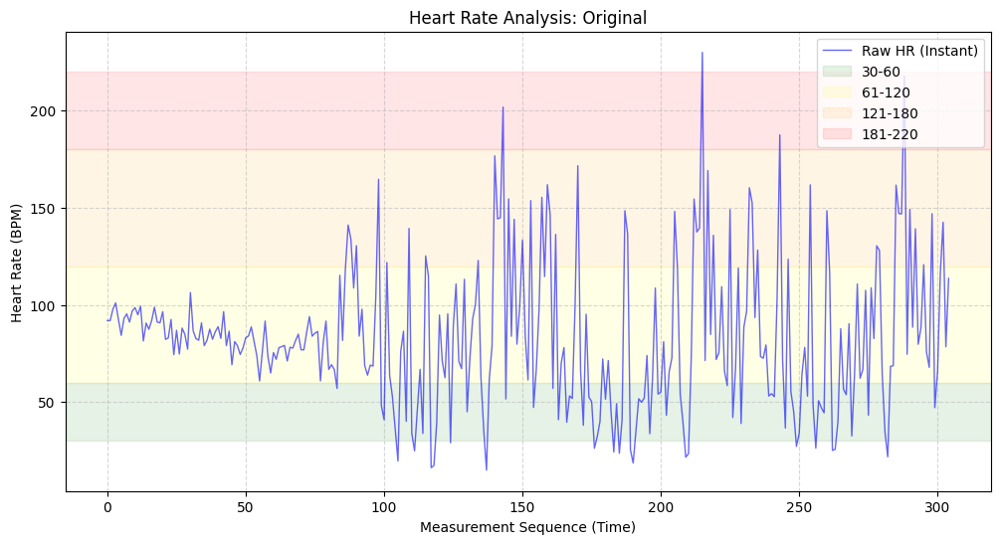

plot
381
238


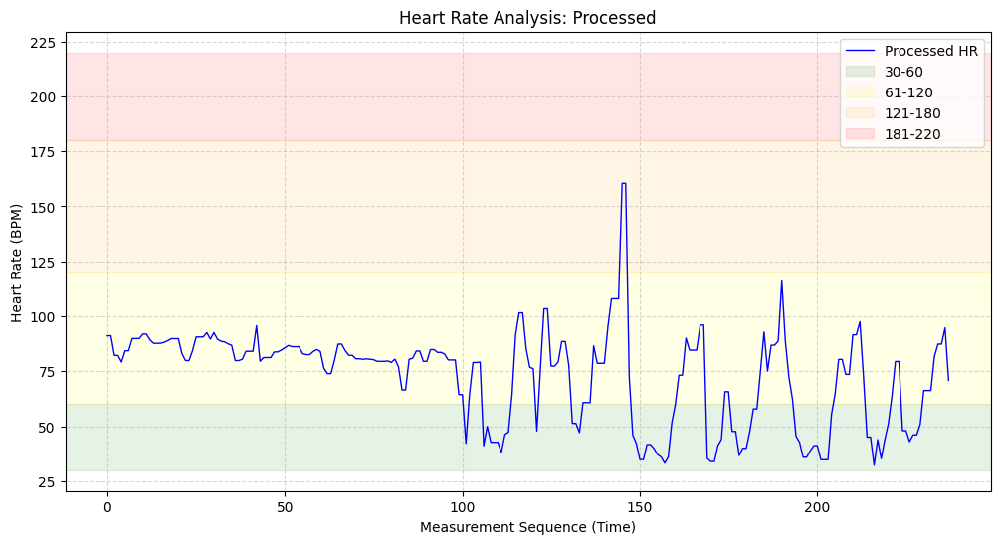

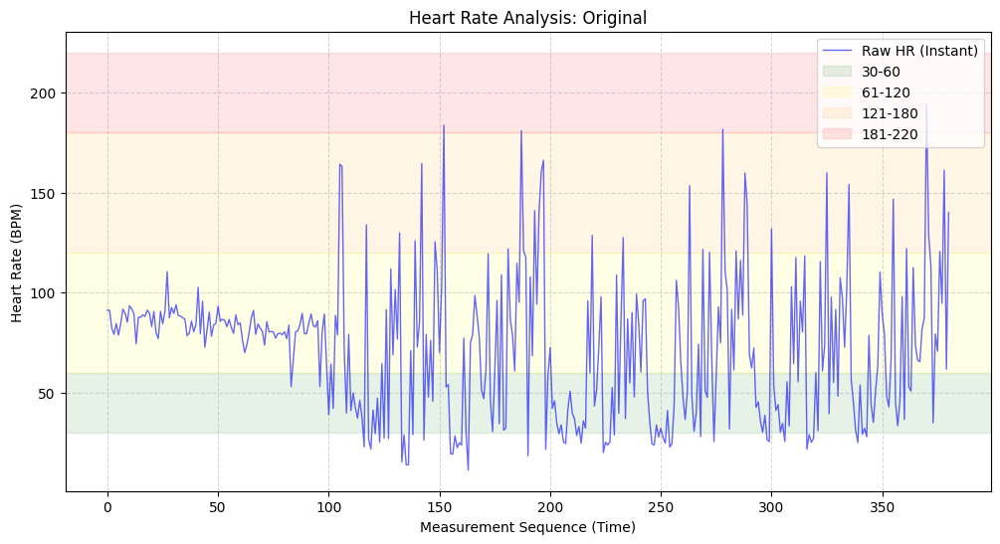

plot
297
192


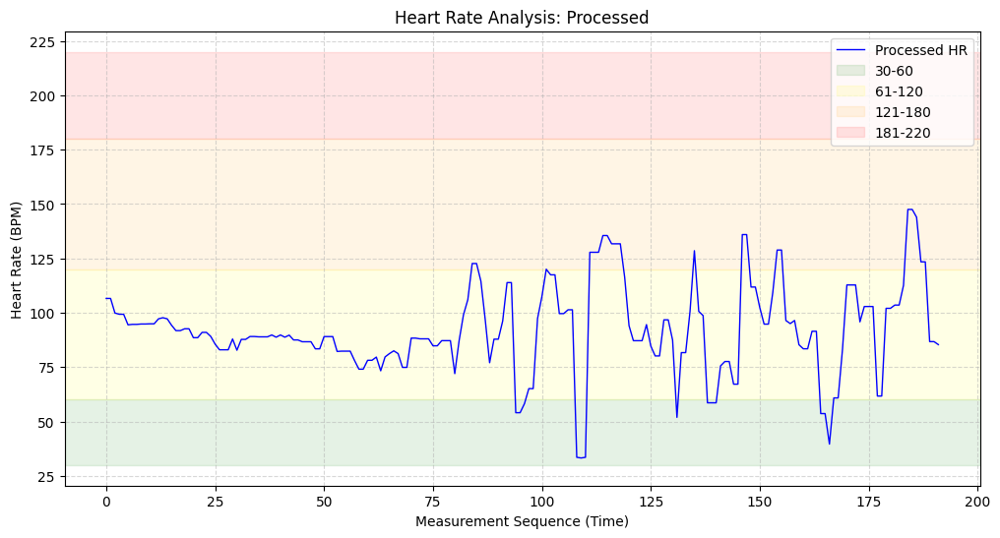

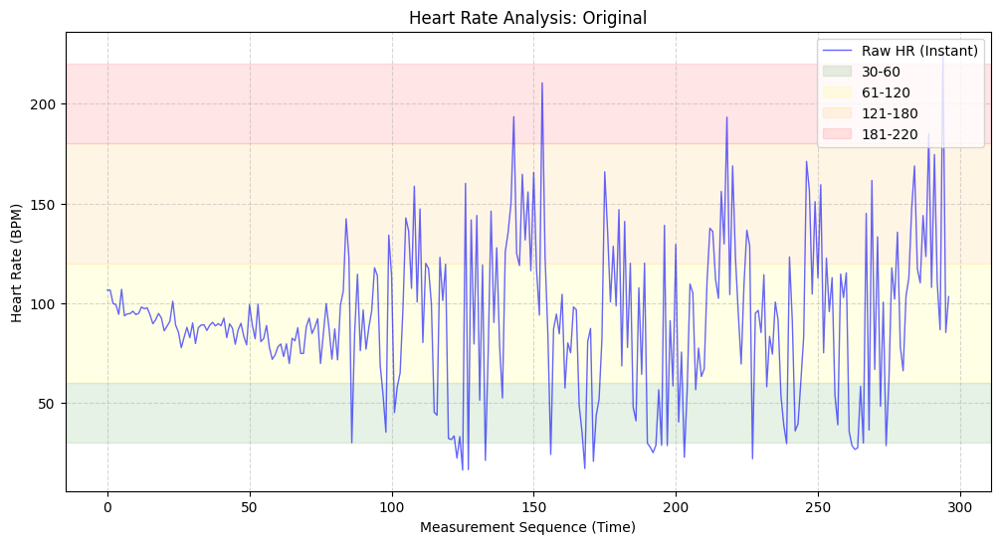

plot
265
164


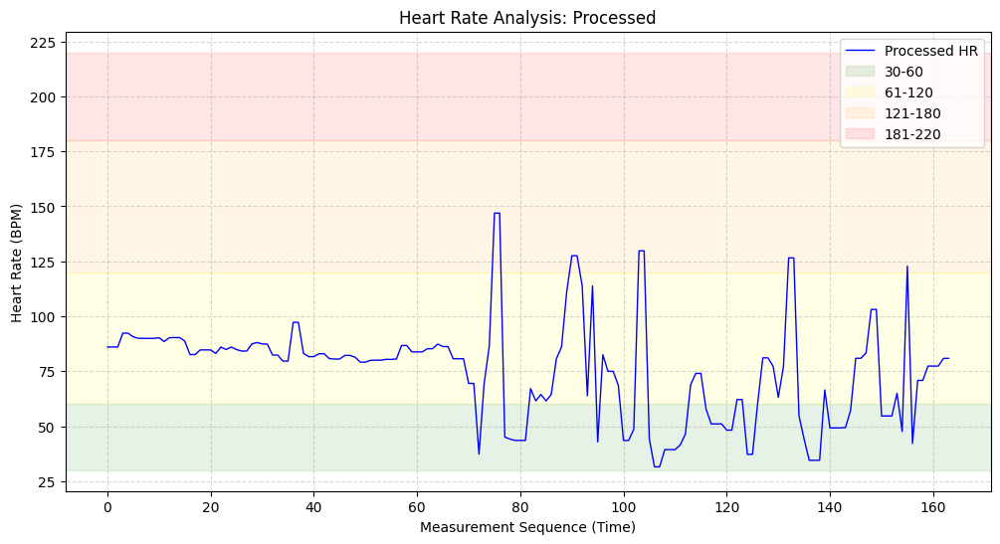

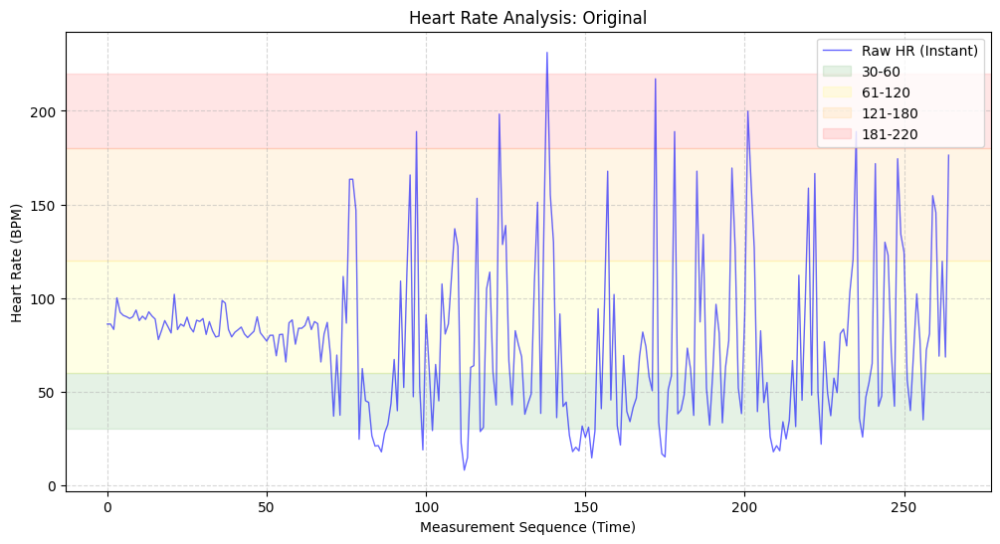

plot
349
240


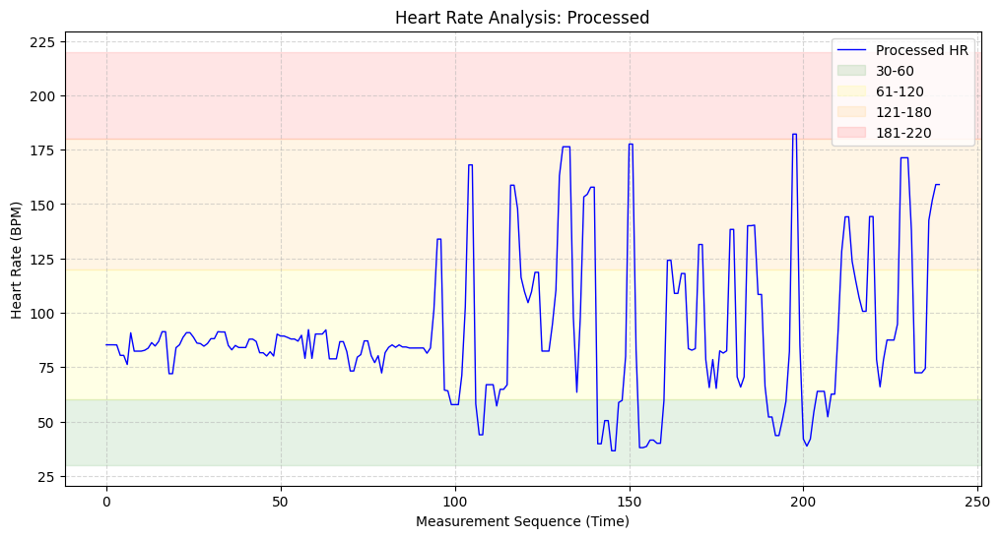

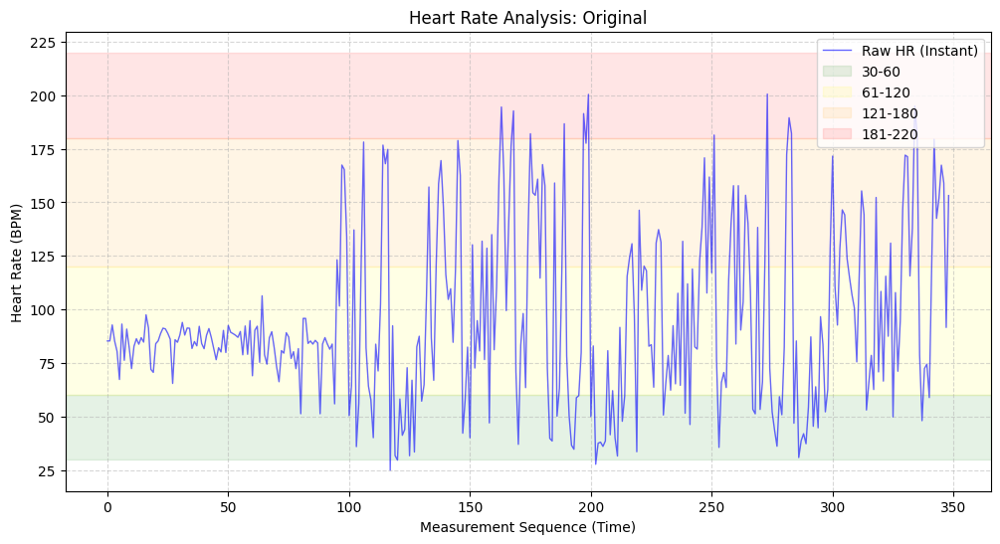

plot
285
177


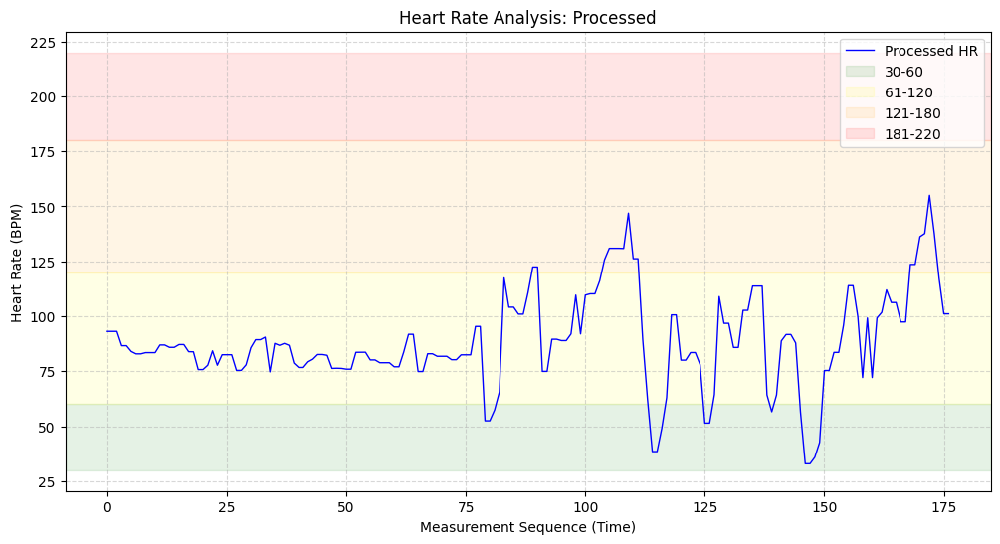

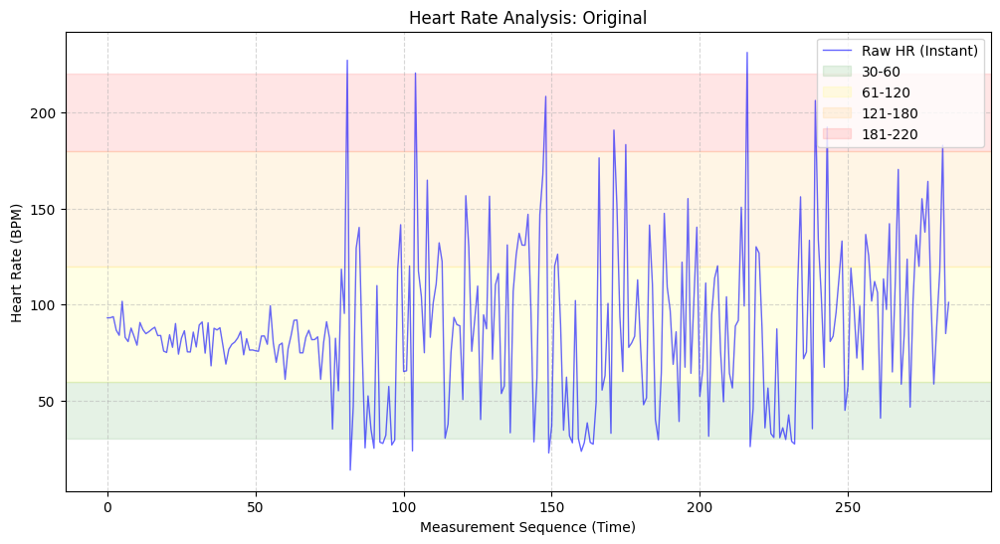

plot
217
153


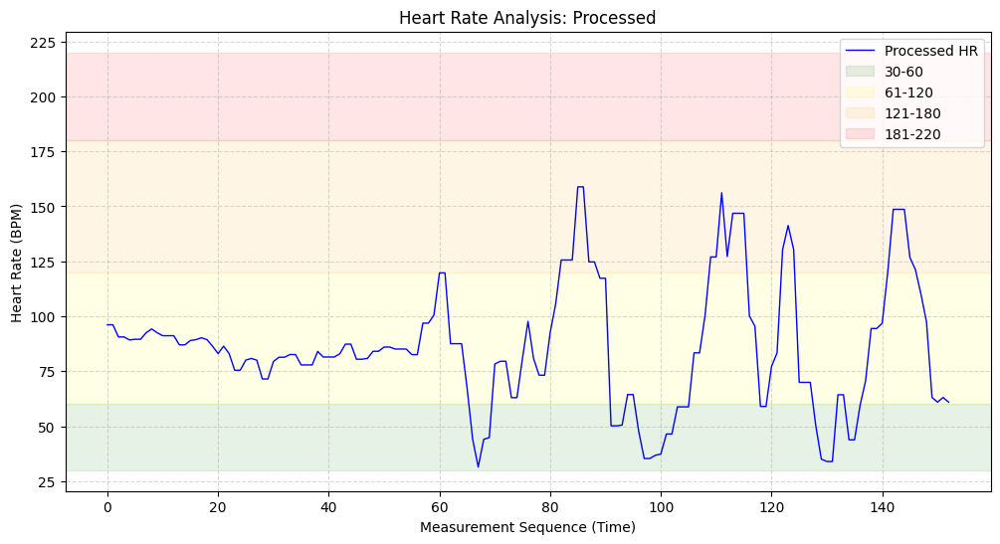

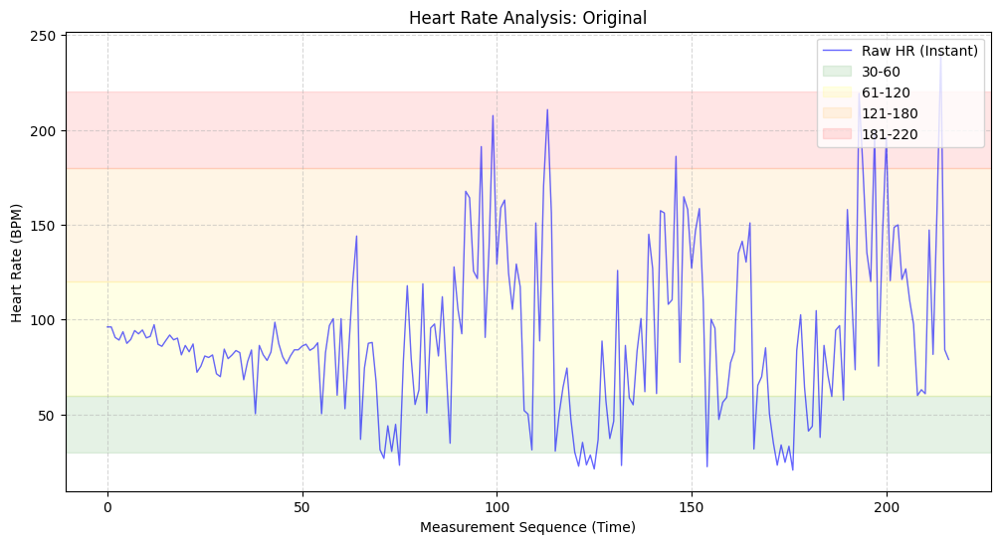

plot
361
245


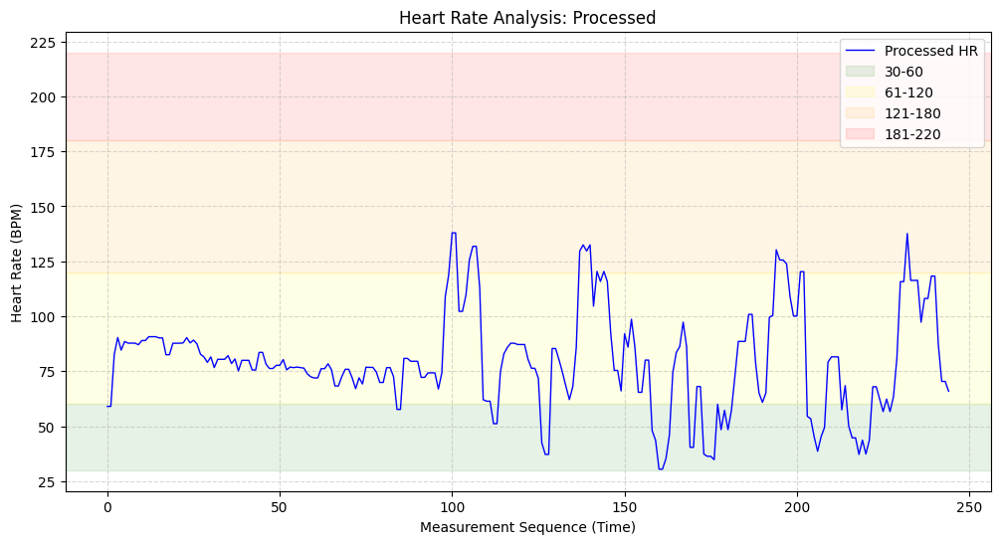

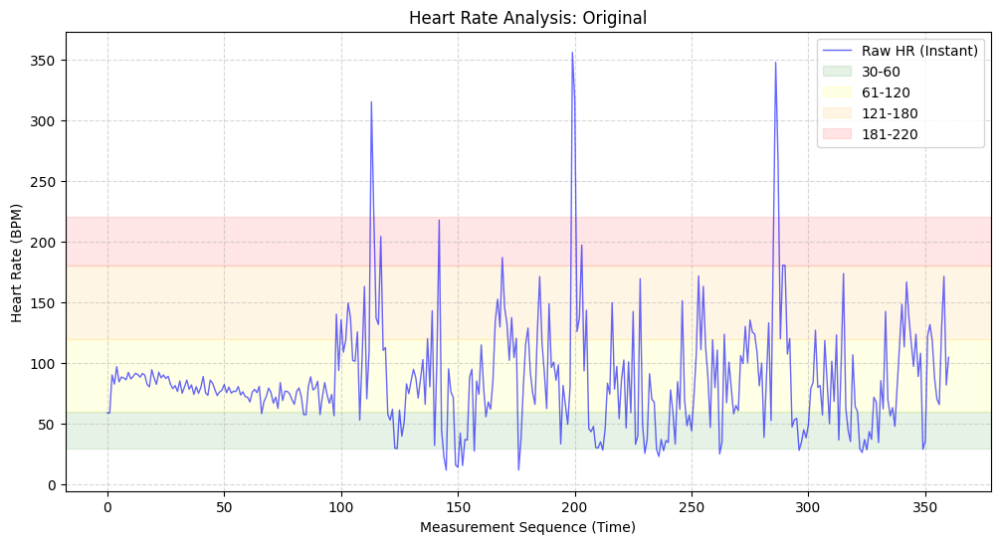

plot
269
182


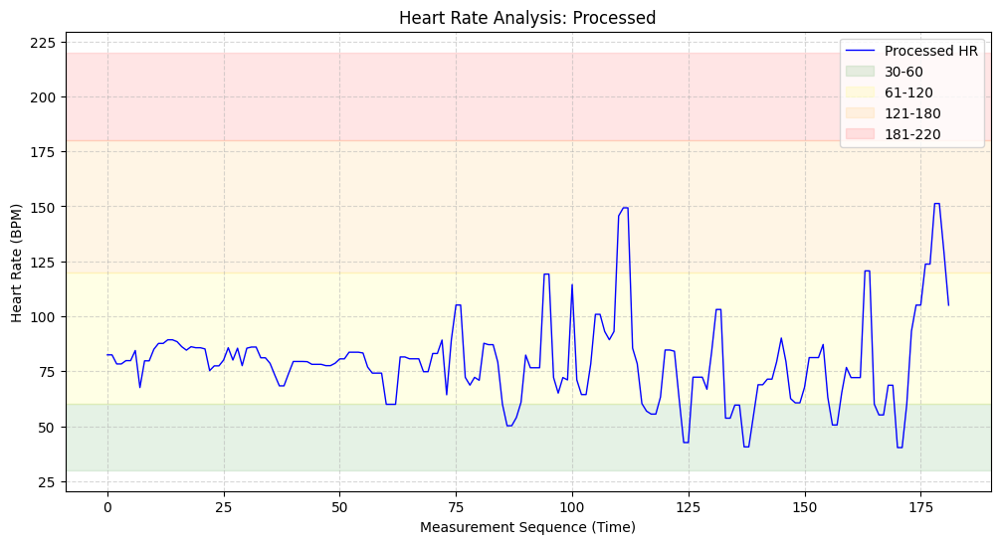

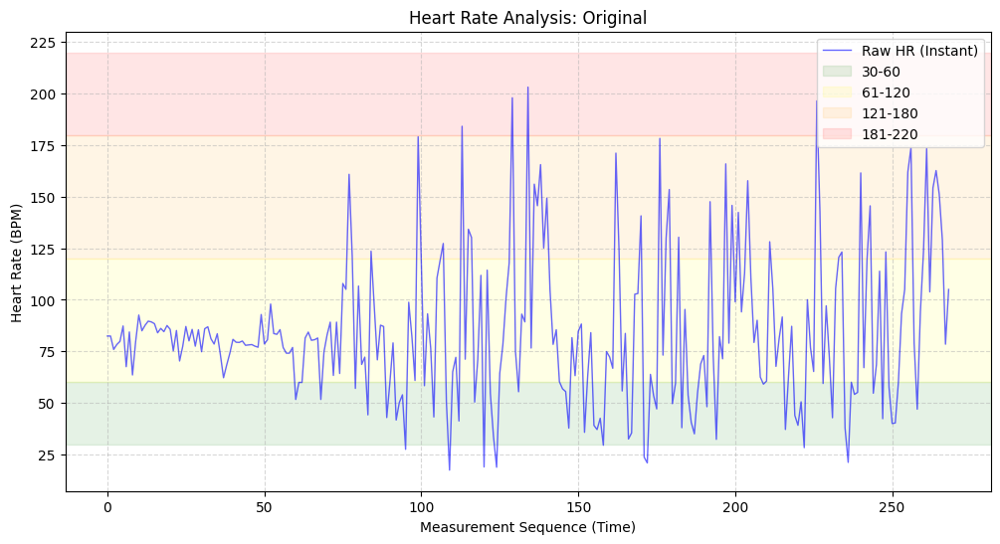

plot
235
136


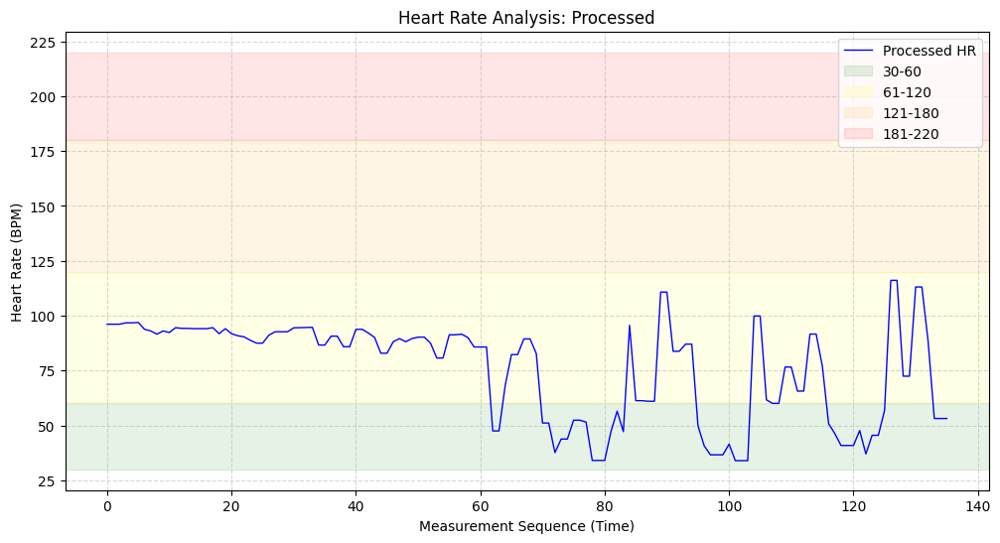

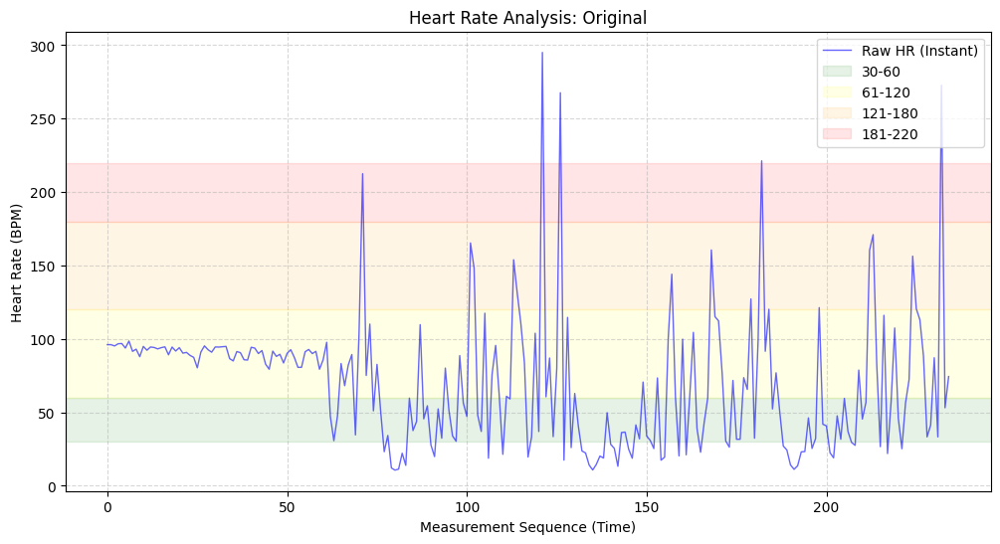

plot
209
136


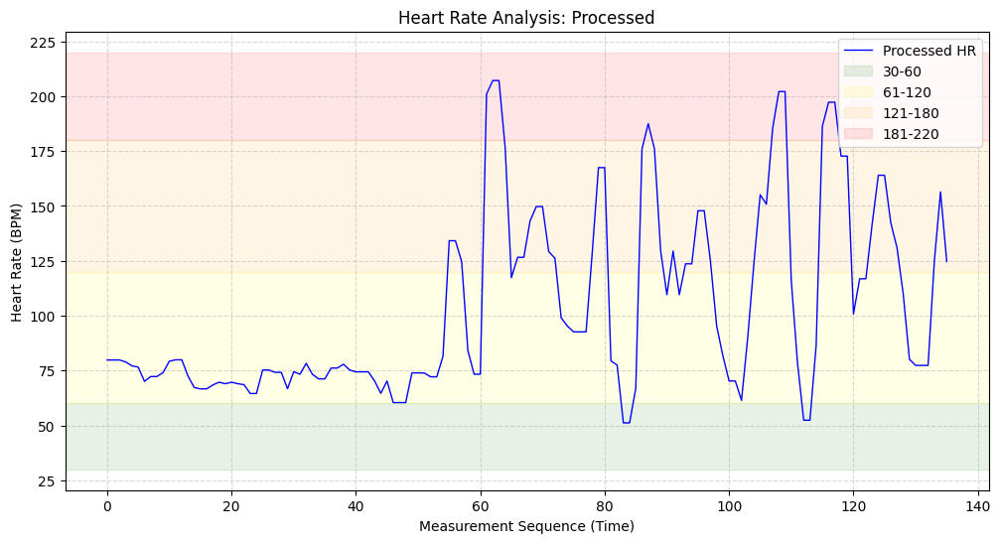

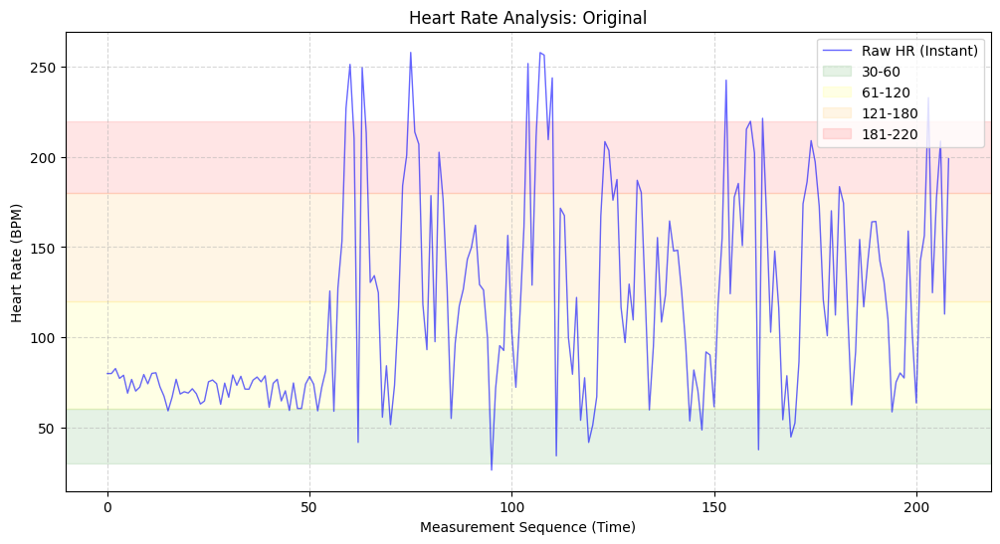

plot
565
420


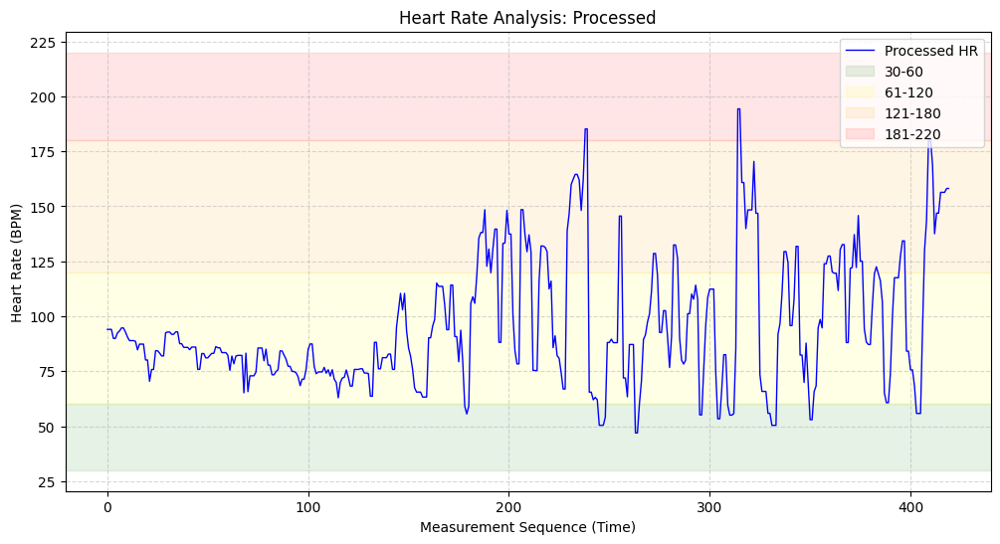

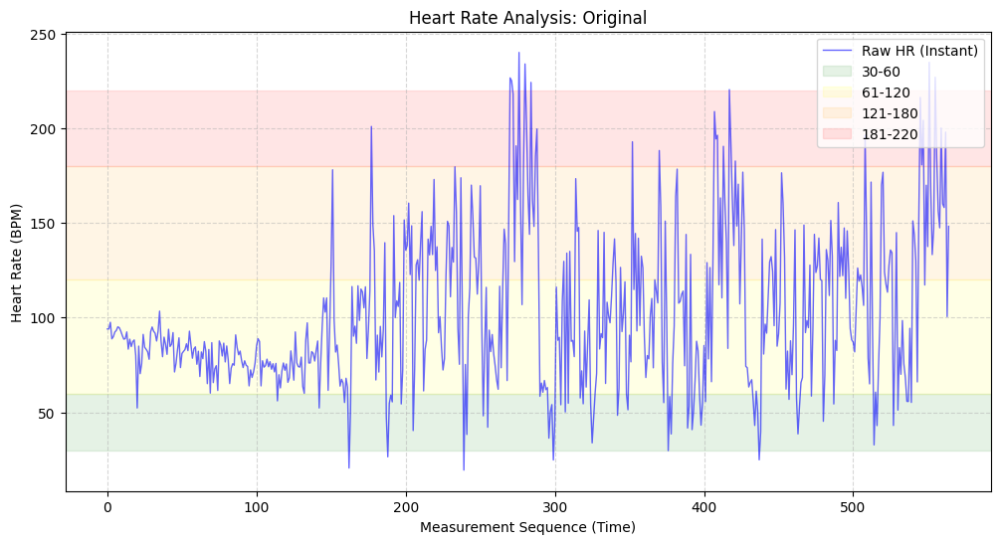

plot
377
274


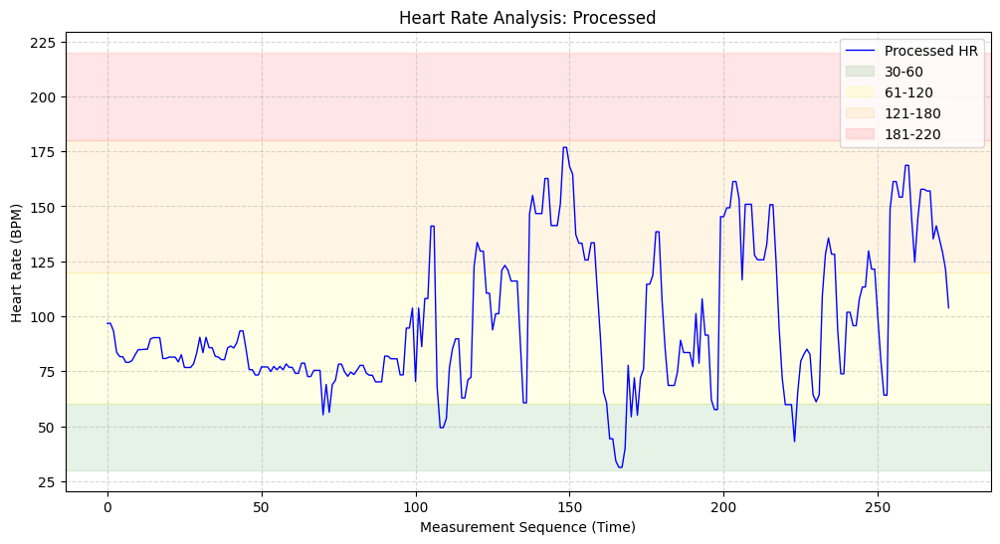

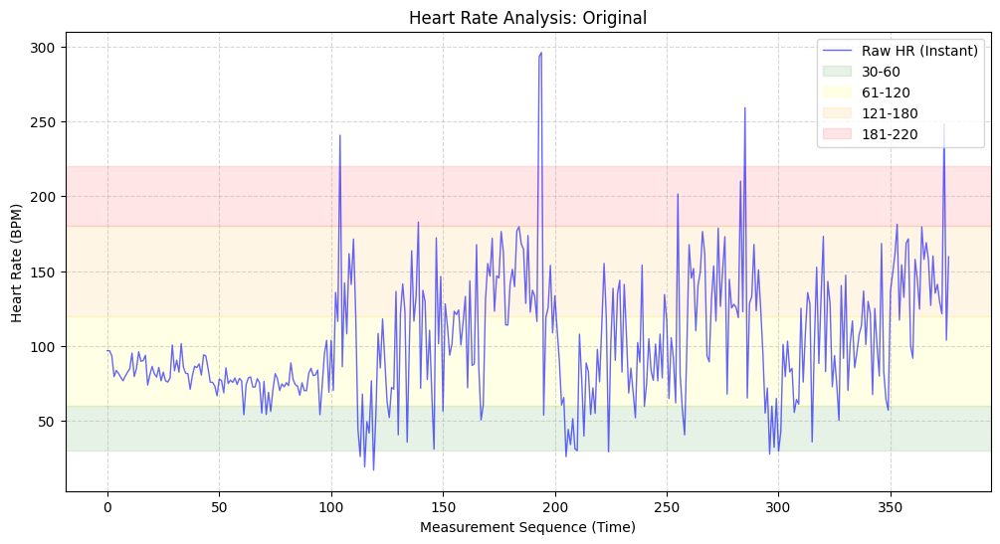

plot
405
255


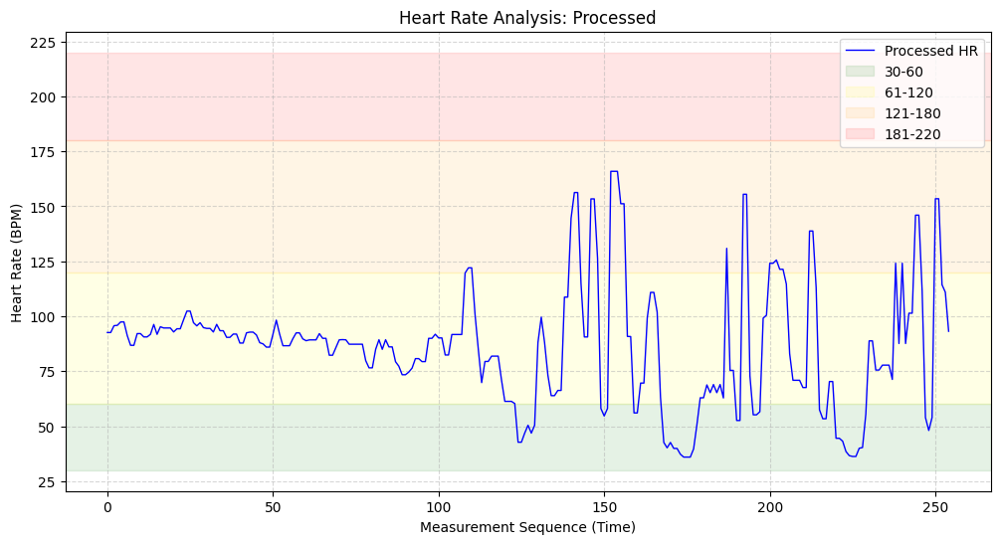

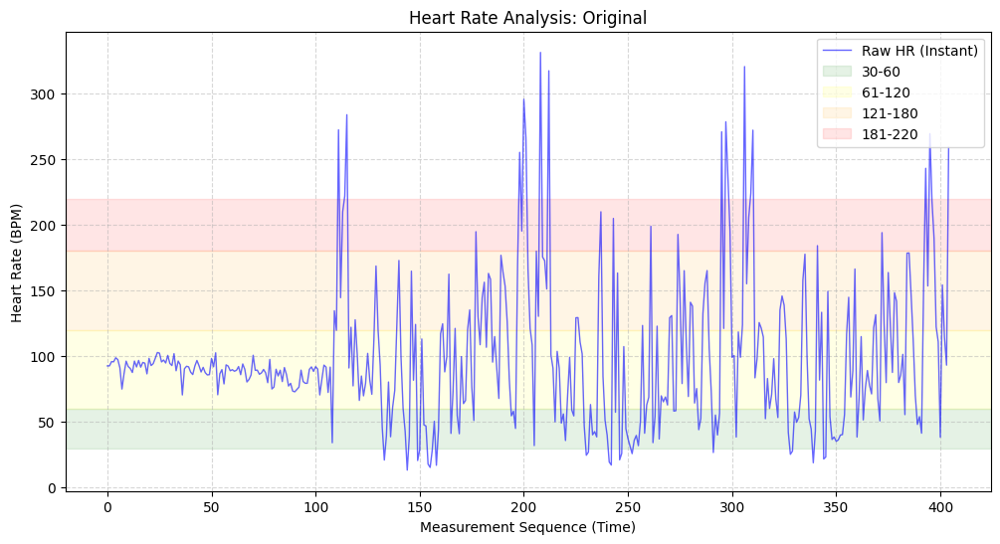

plot
404
252


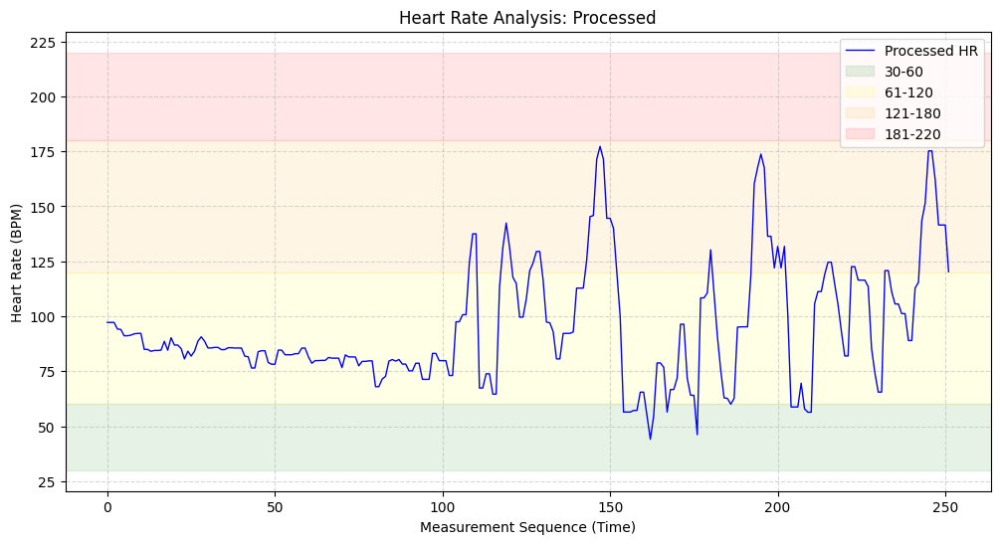

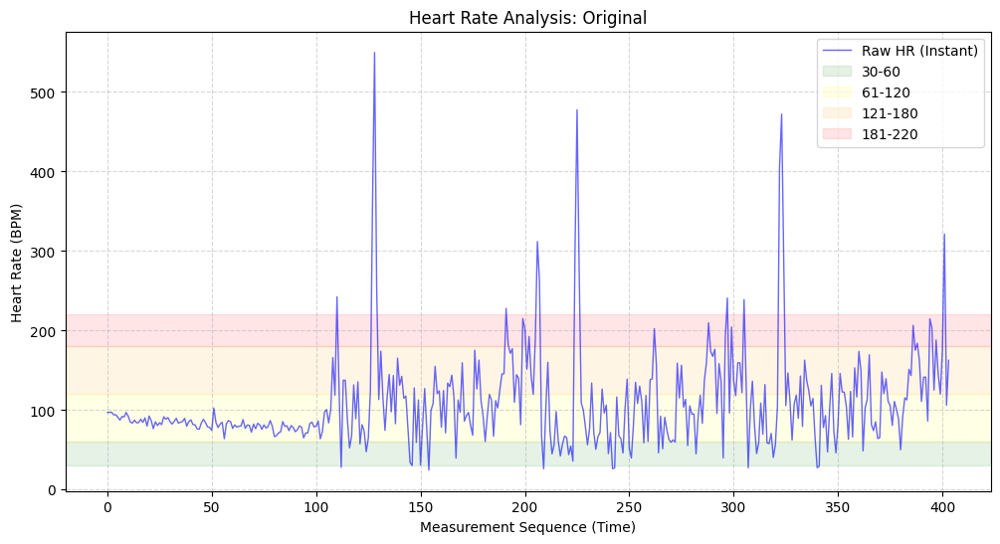

plot
367
237


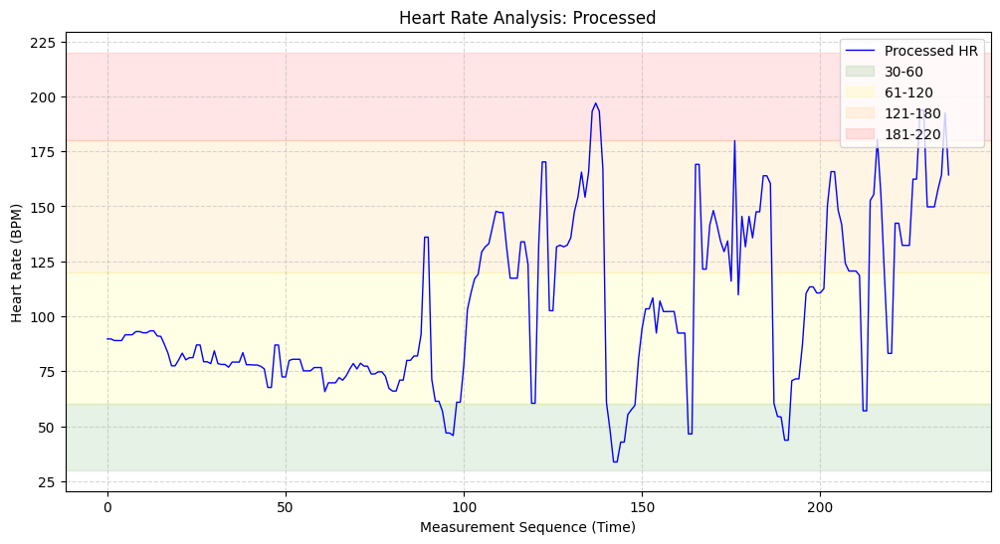

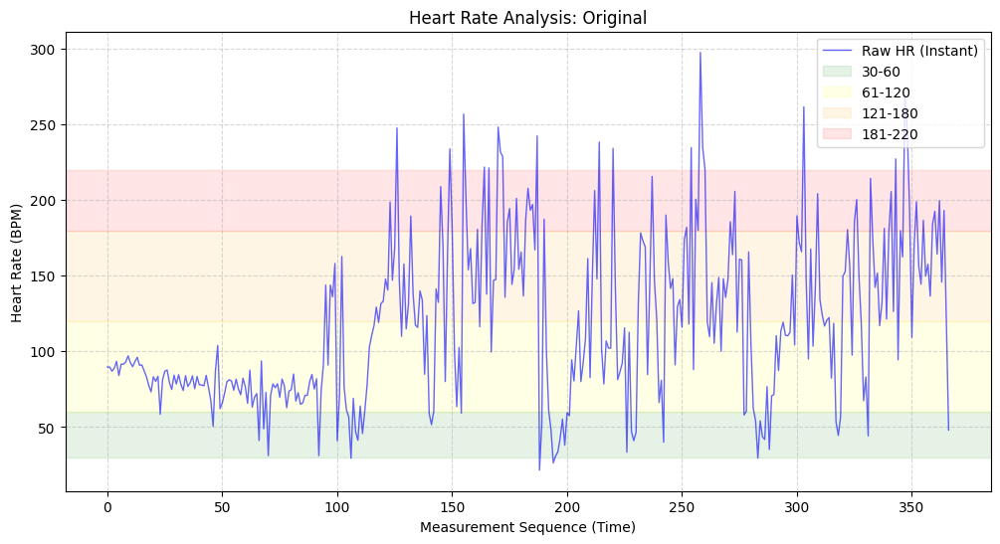

plot
761
476


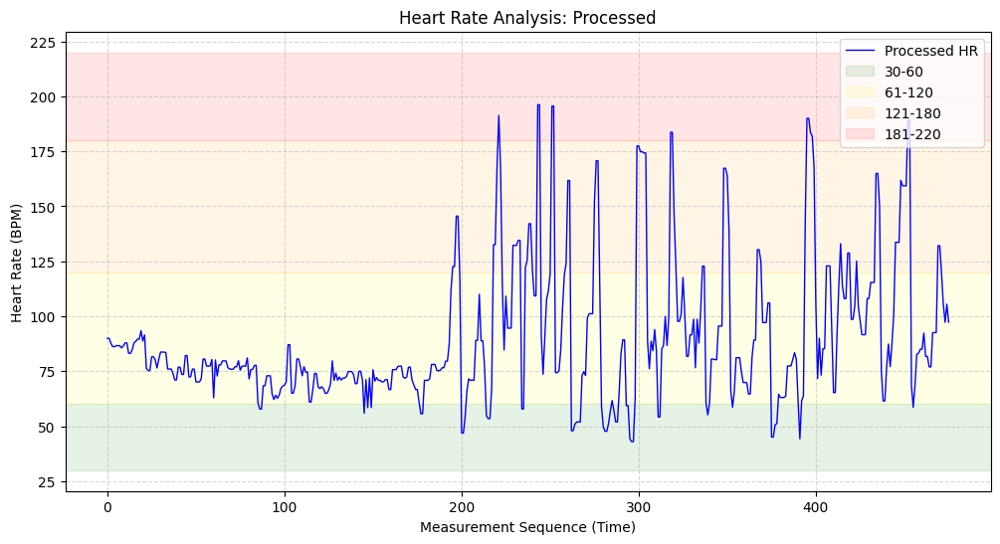

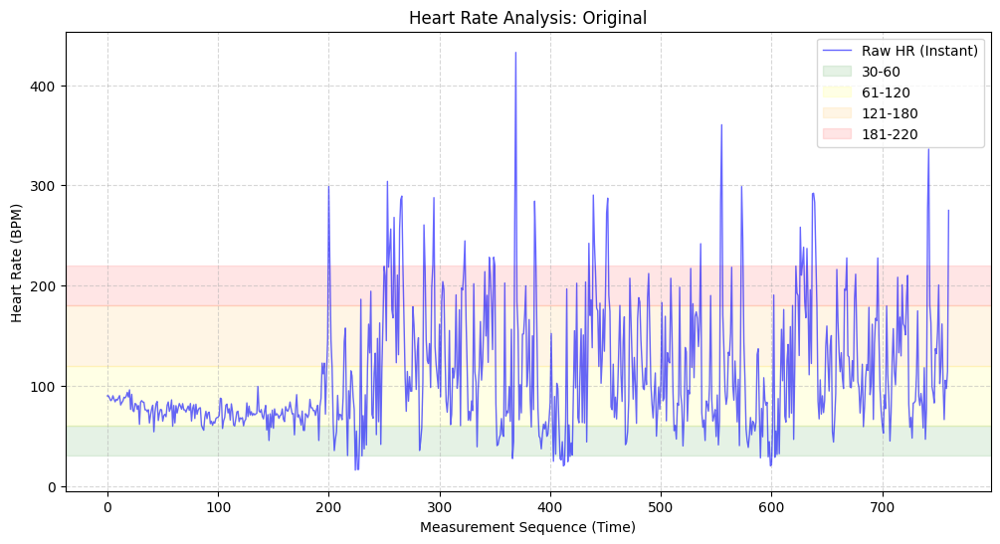

plot
313
207


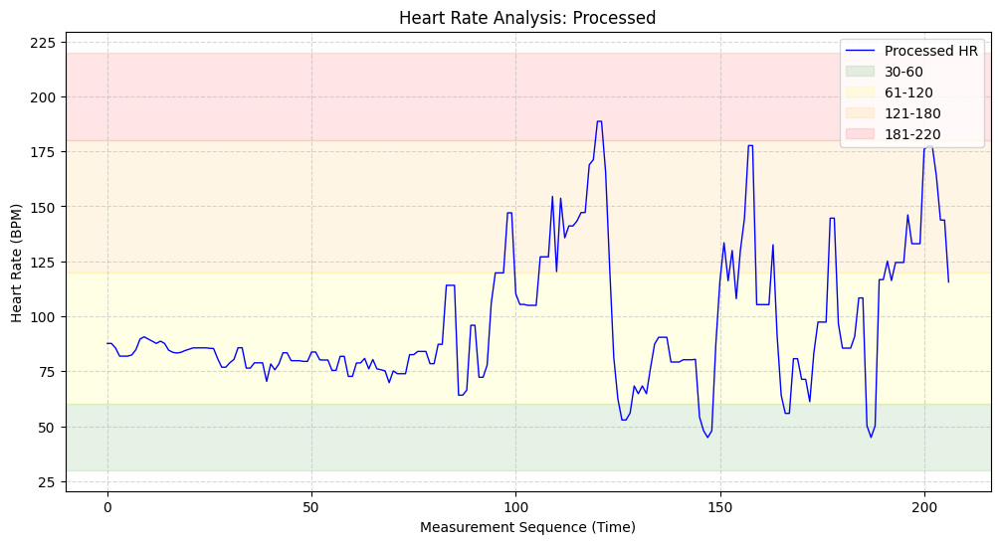

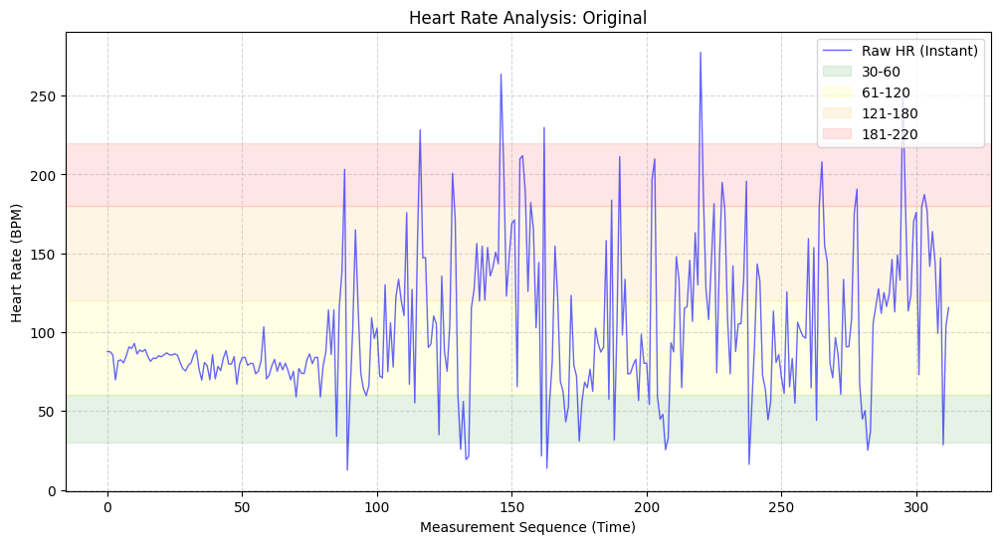

plot
289
176


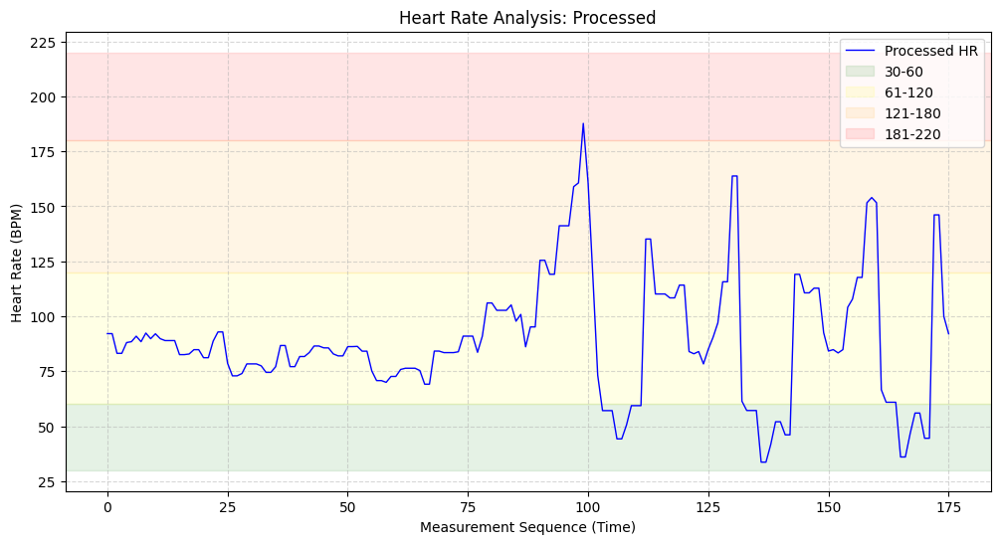

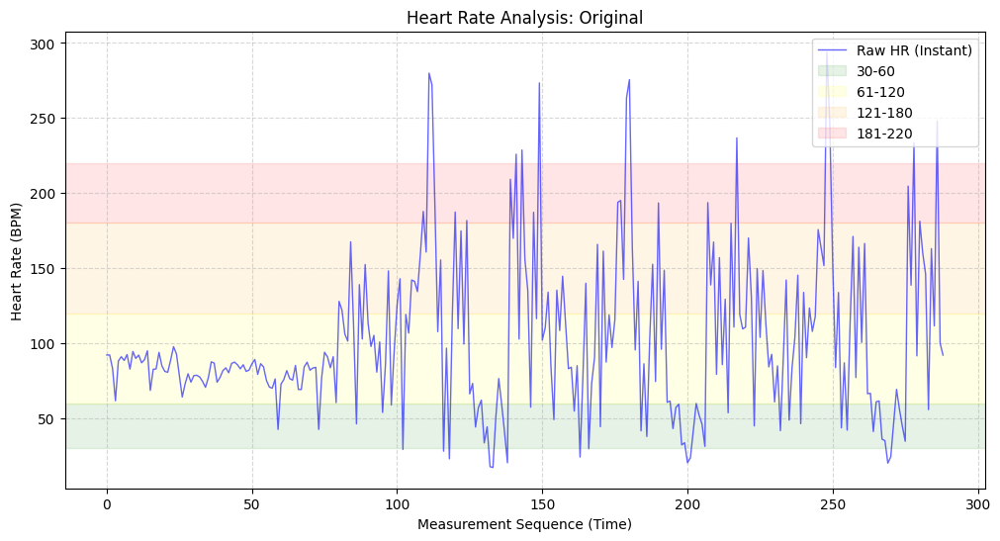

plot
277
184


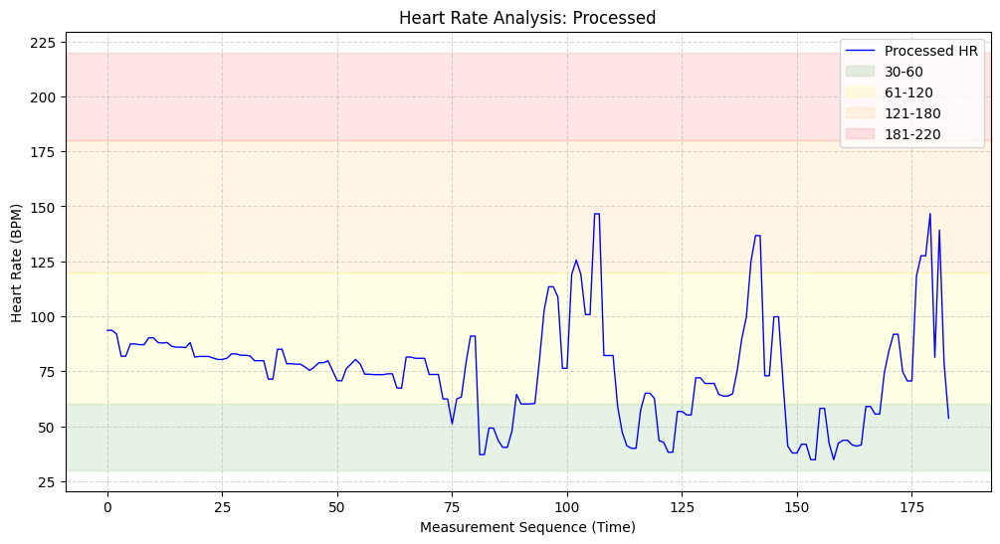

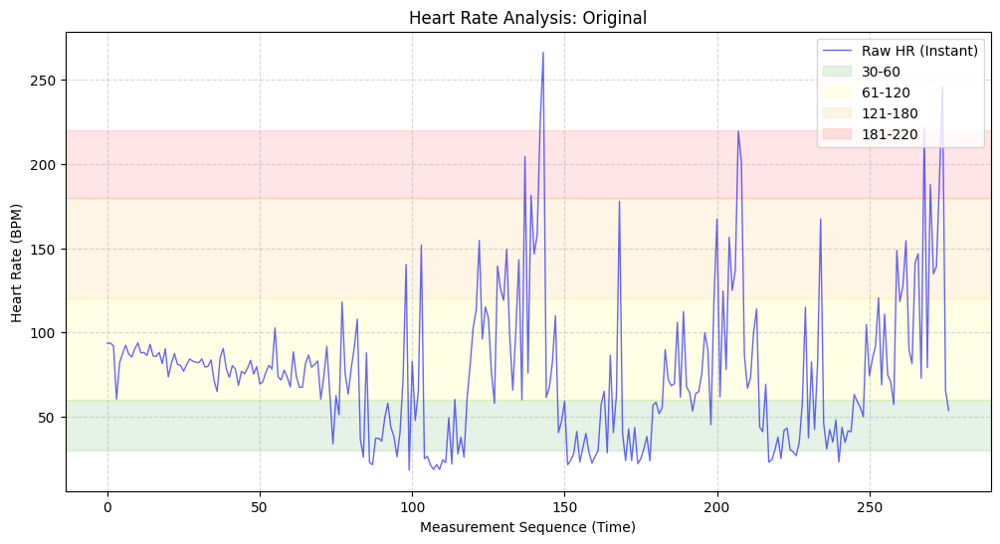

plot
417
292


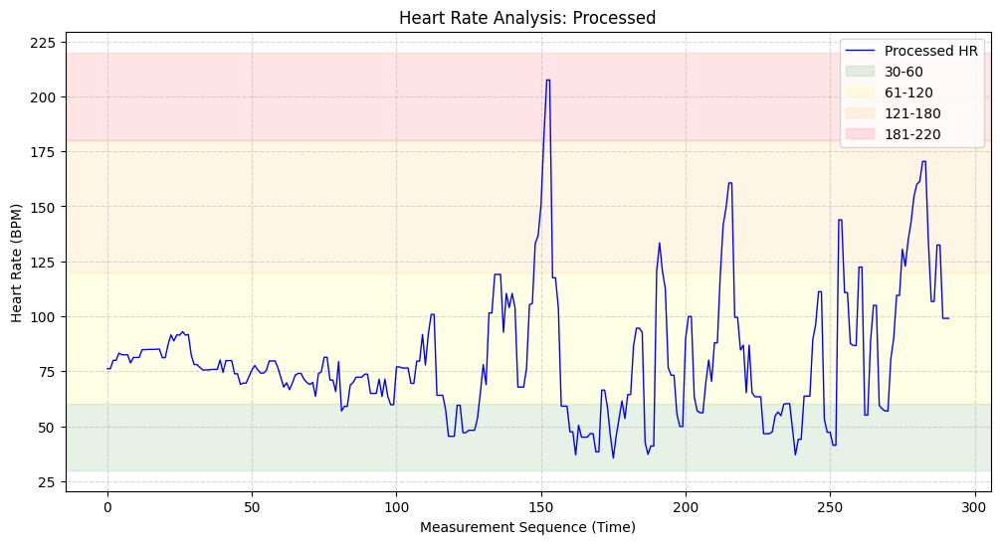

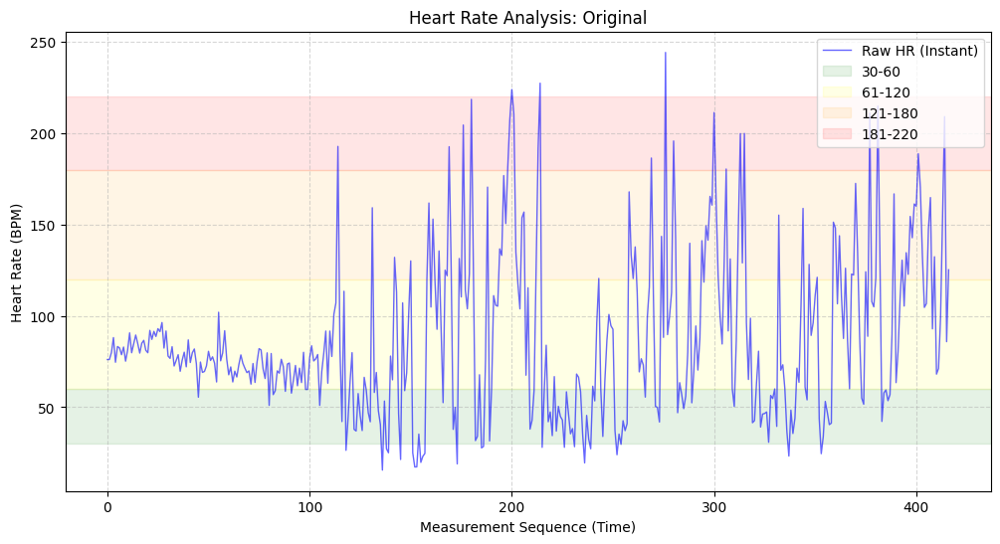

plot
345
215


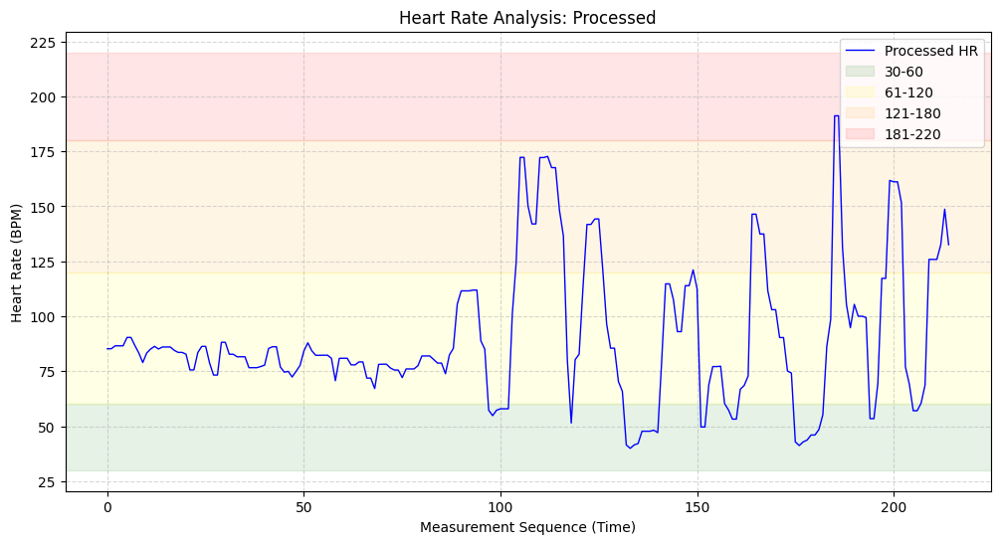

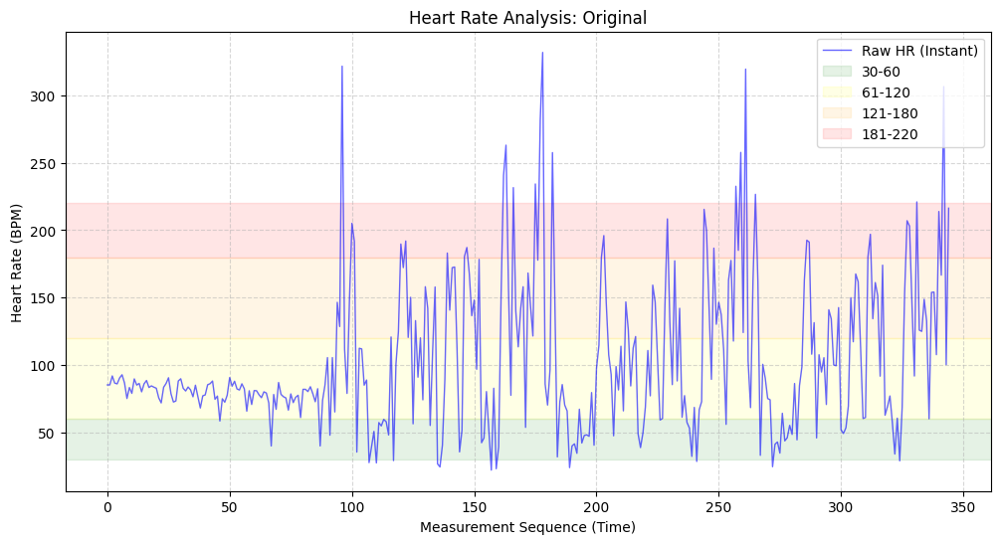

plot
309
214


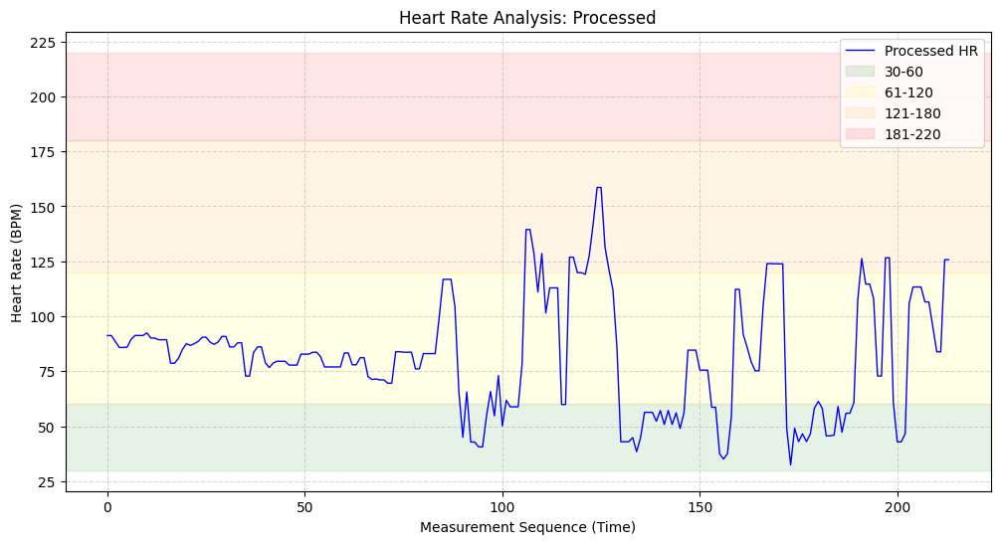

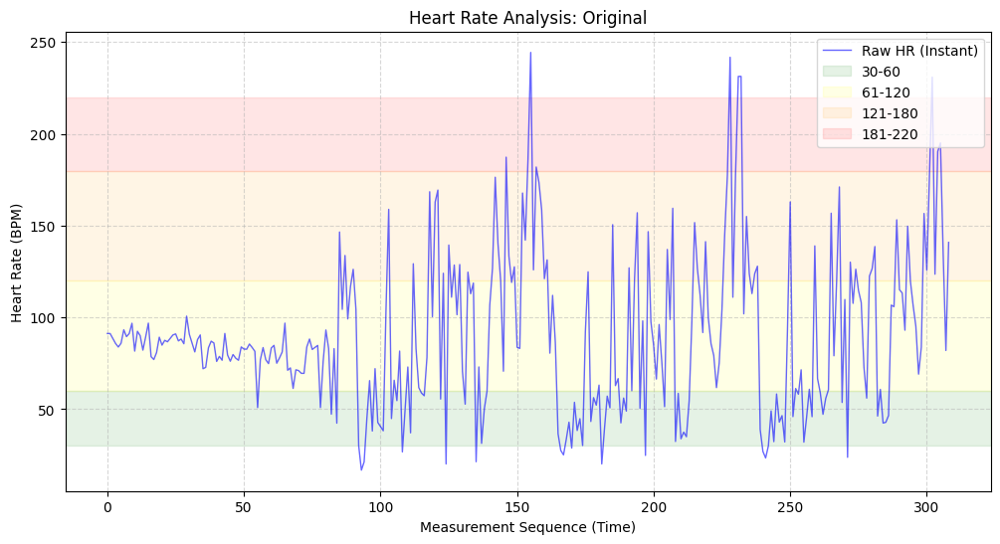

plot
573
355


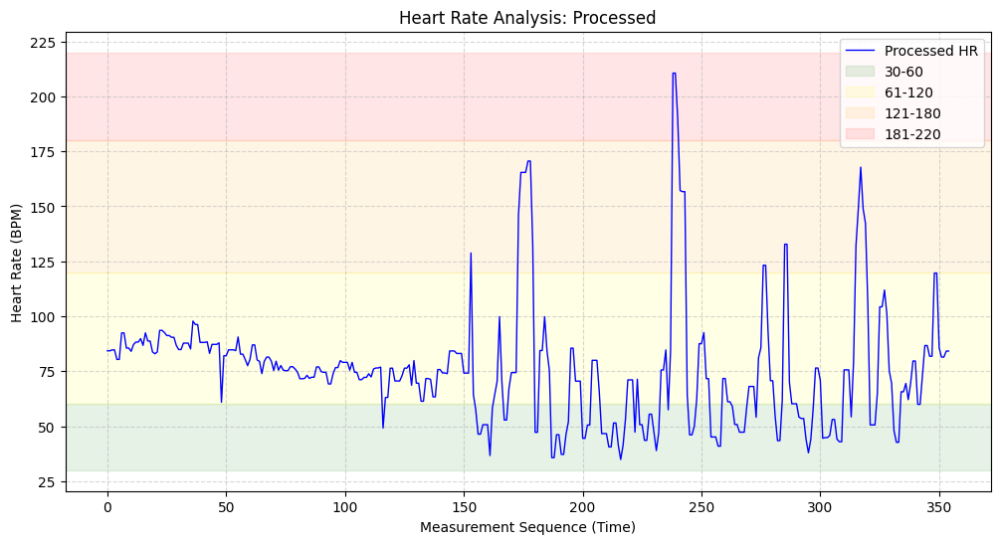

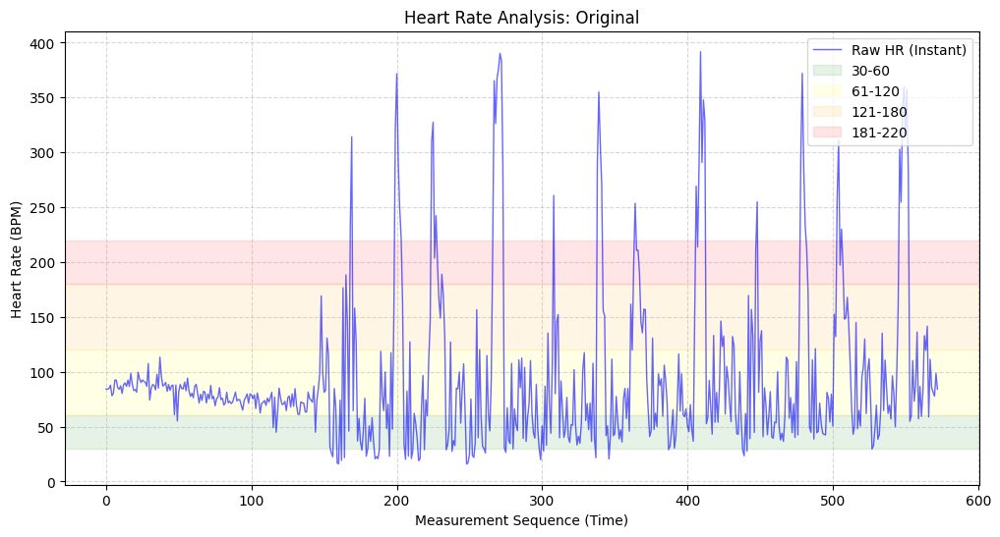

plot
287
179


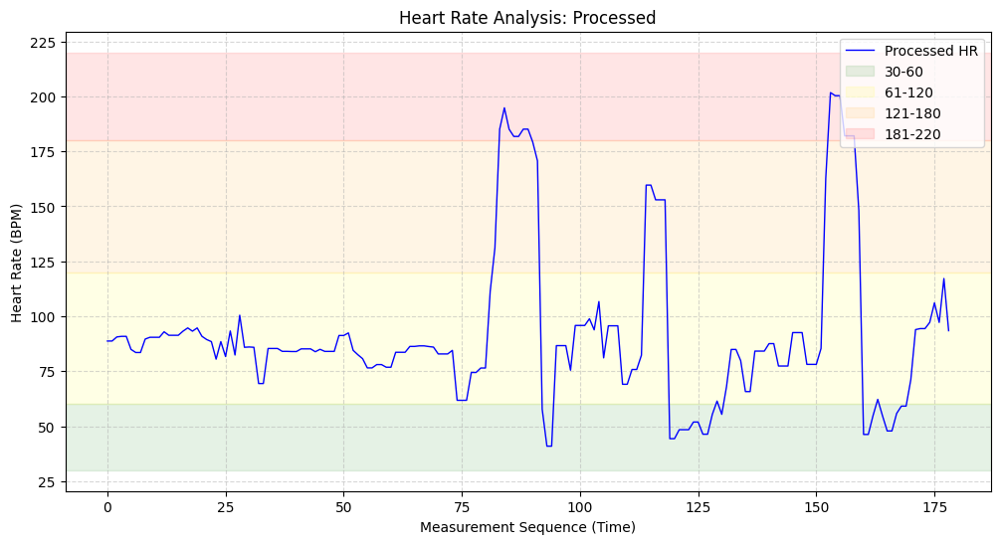

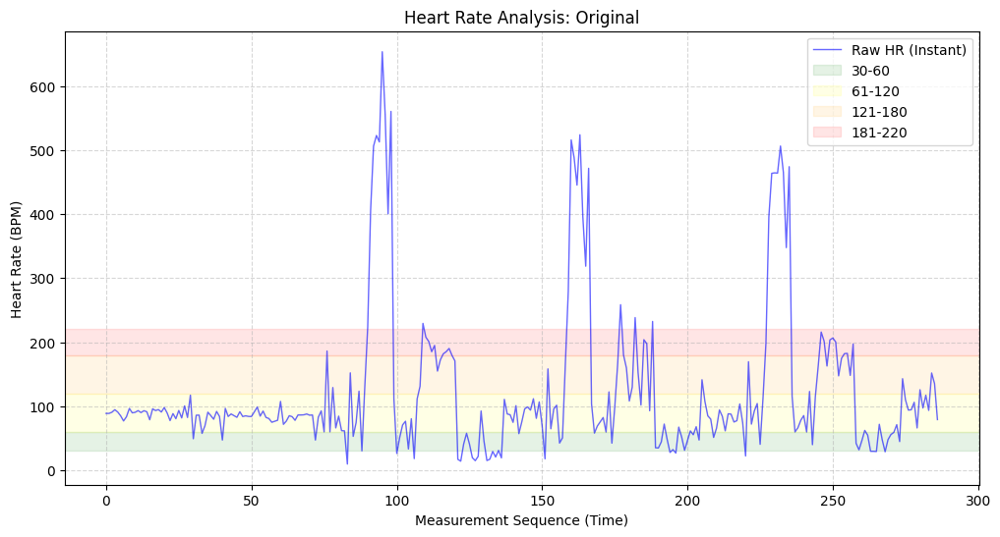

plot
229
151


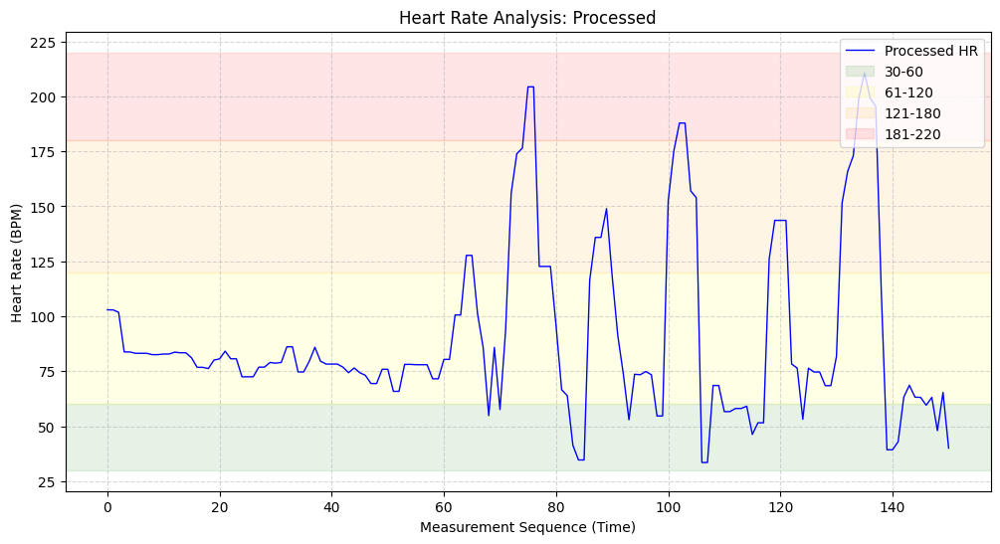

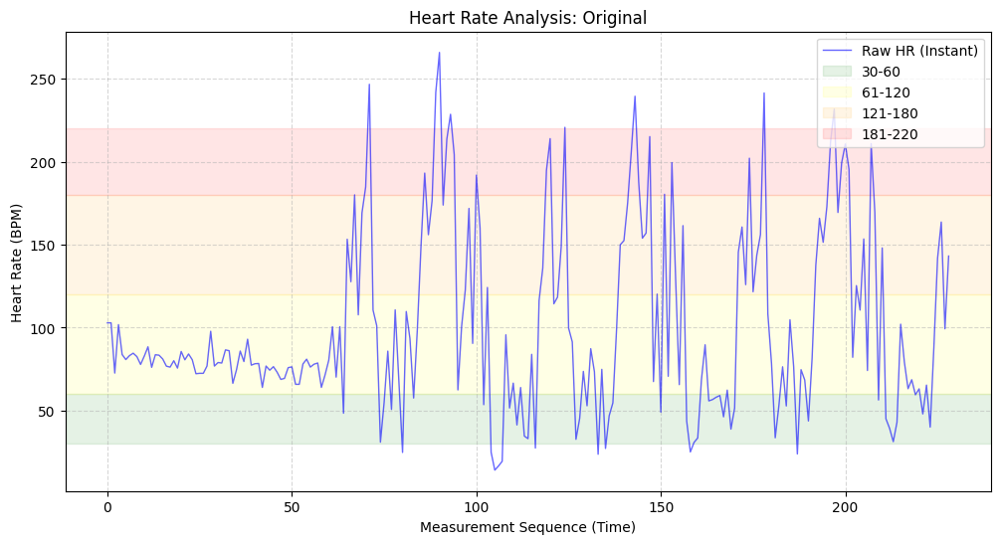

plot
277
155


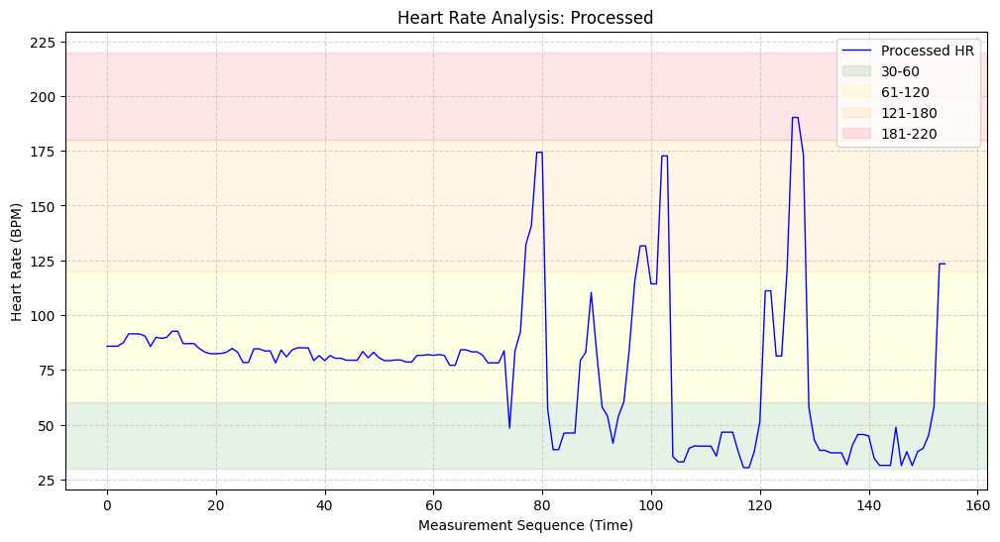

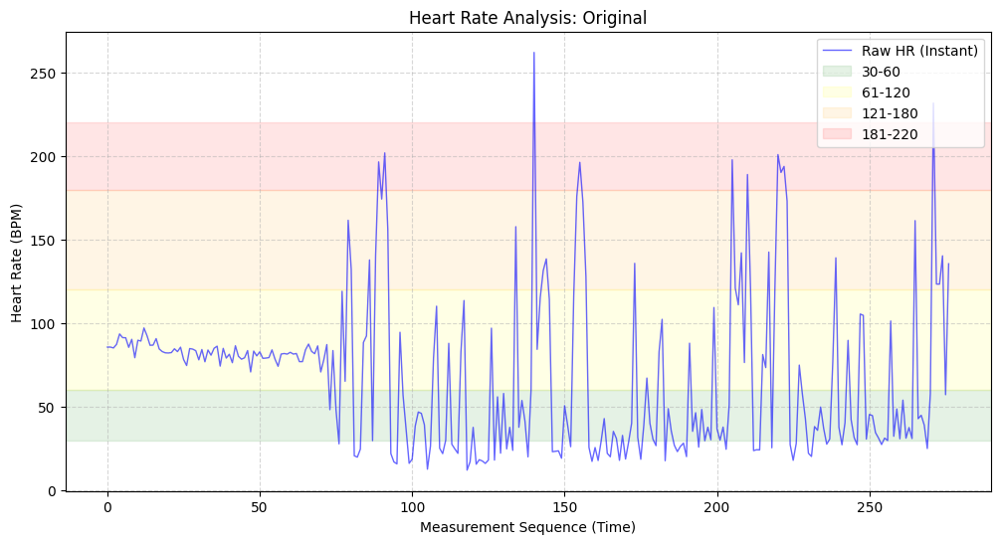

plot
429
314


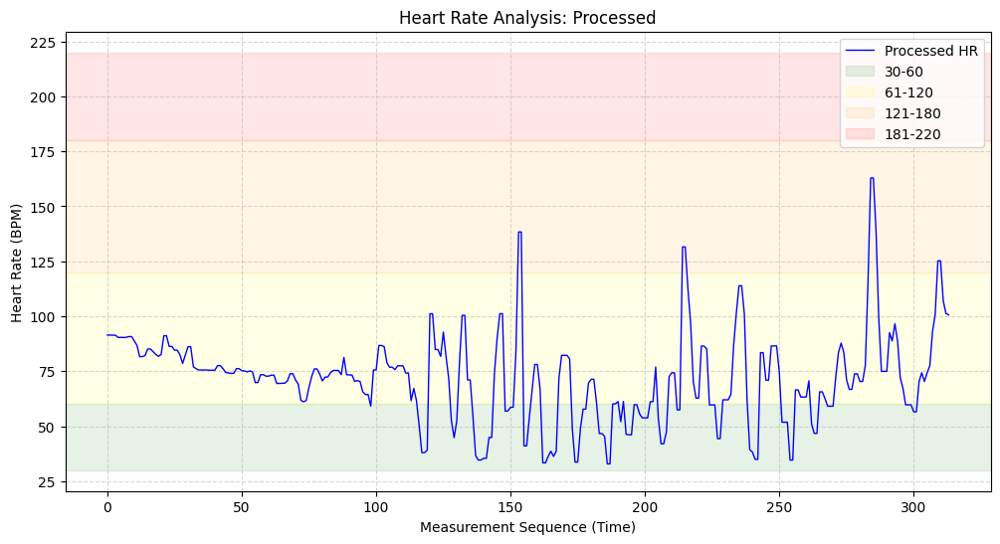

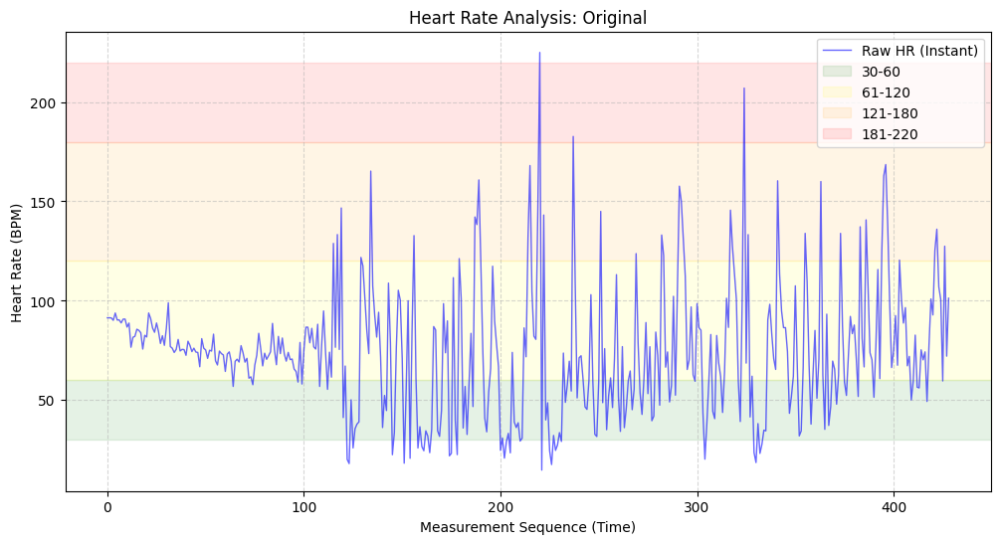

plot
565
376


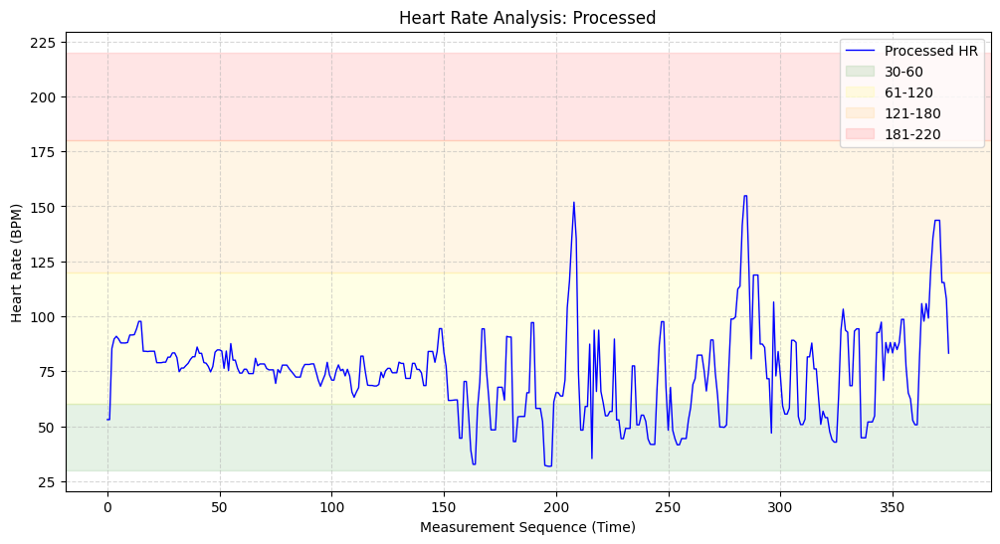

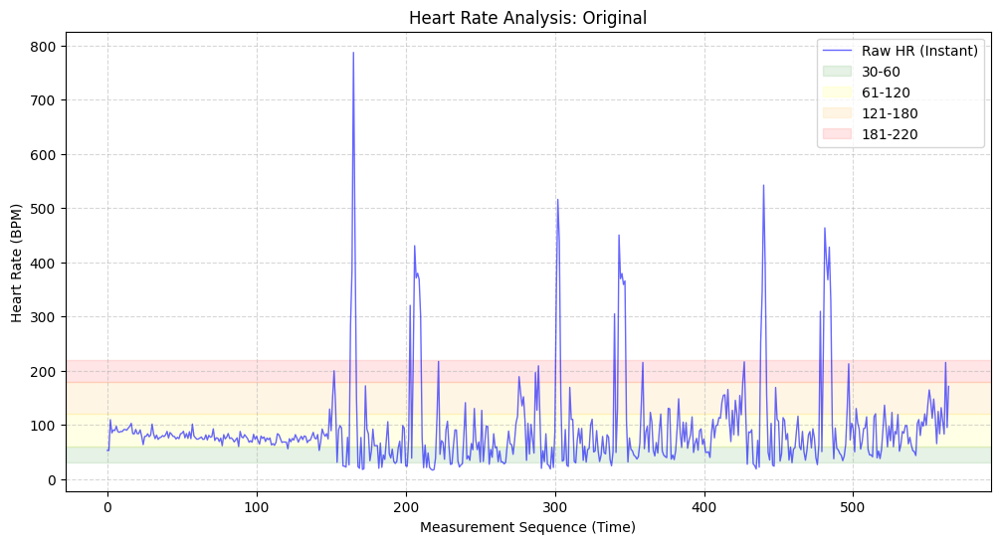

plot
309
218


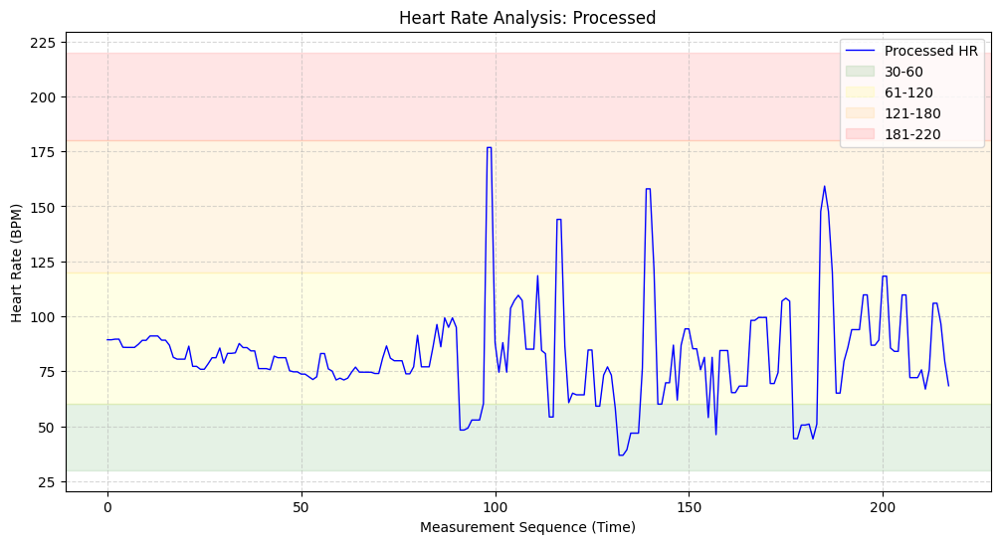

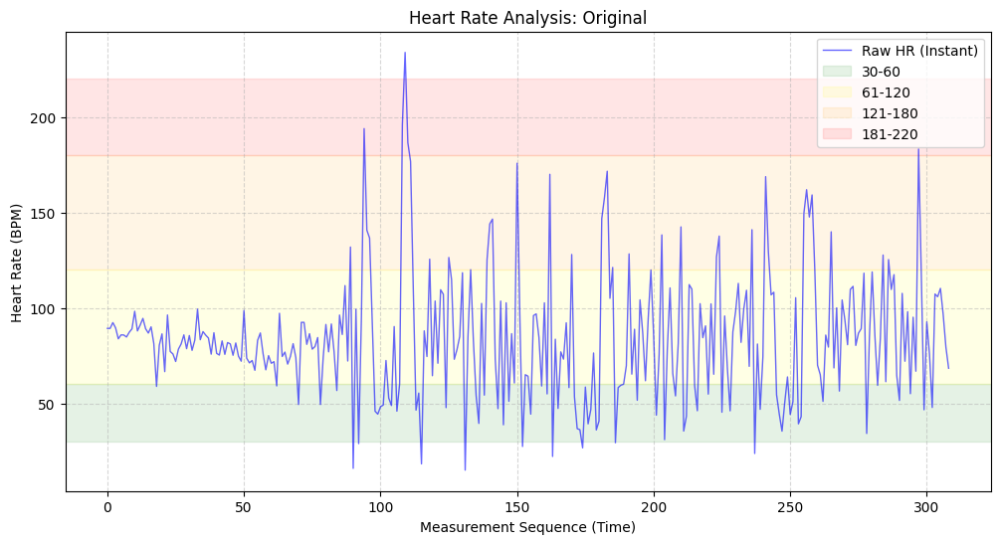

plot
357
244


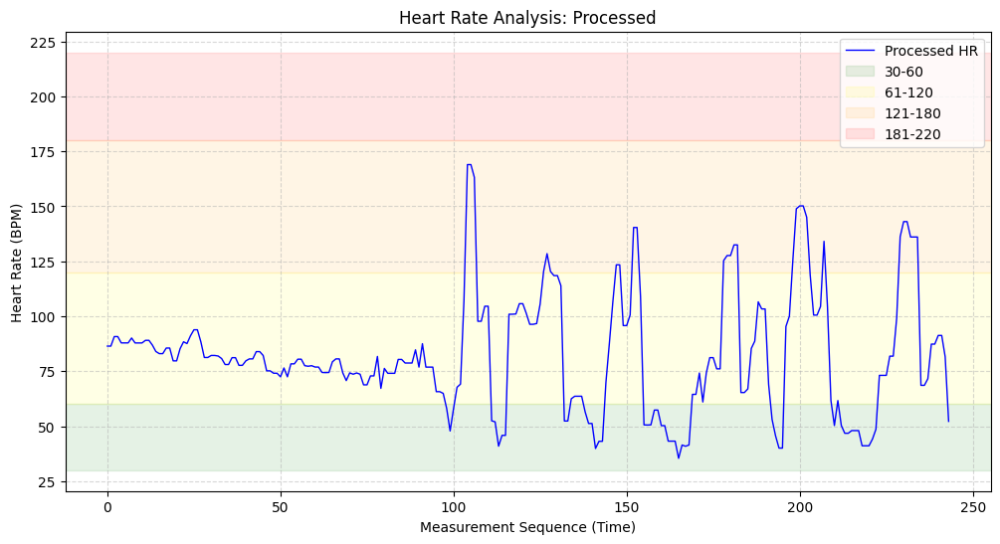

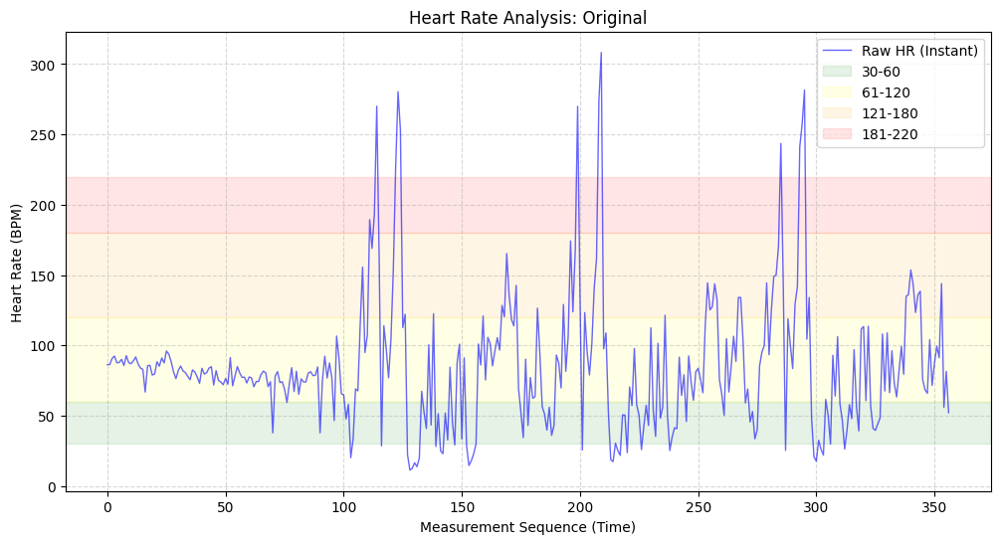

plot
405
279


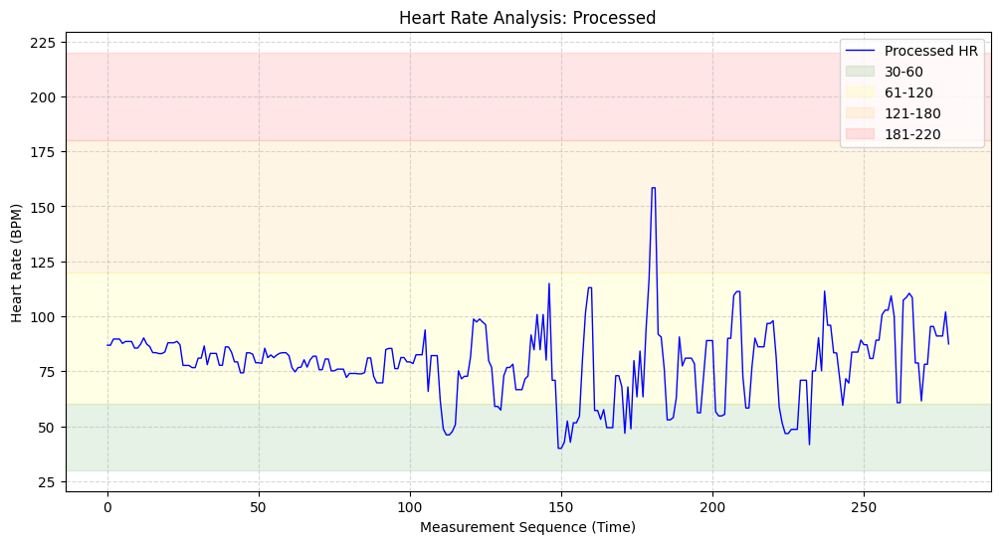

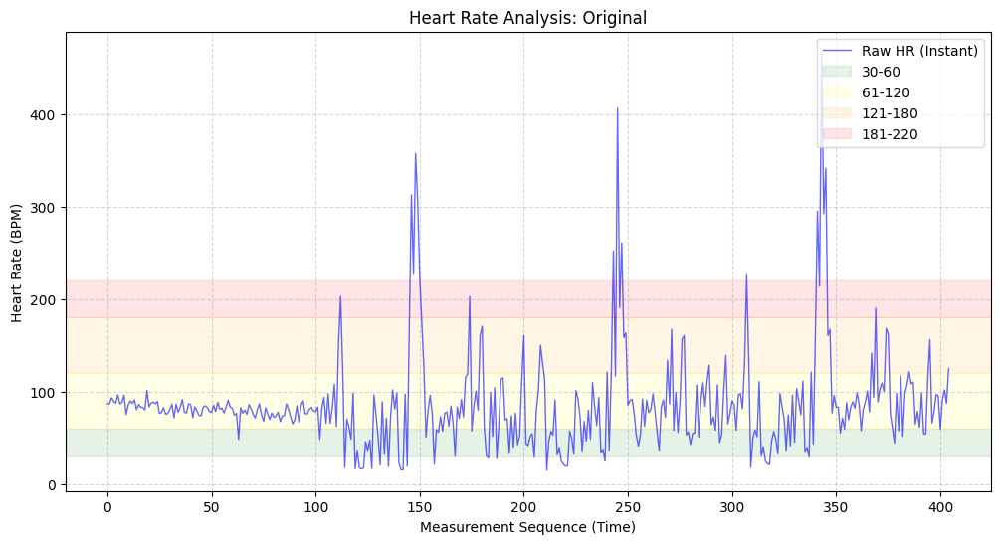

plot
337
211


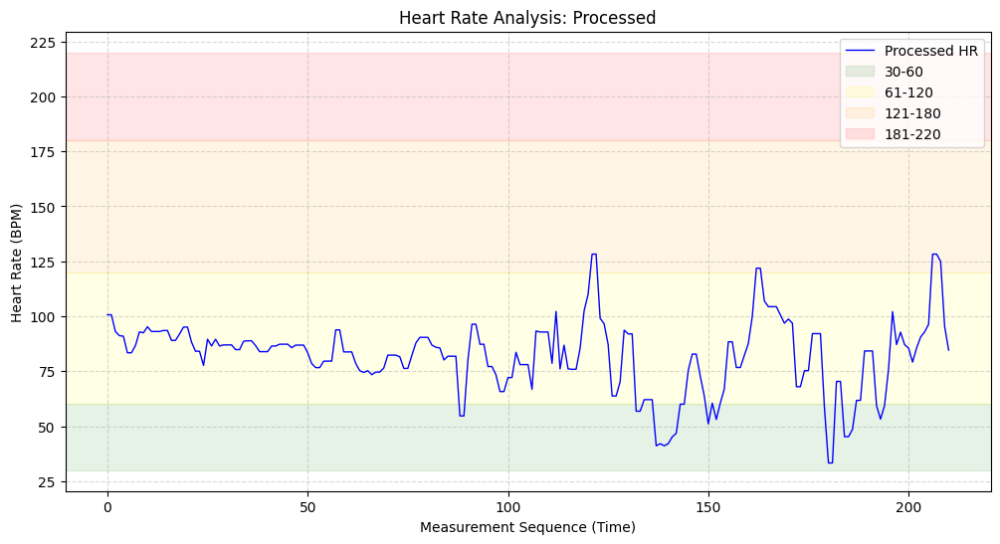

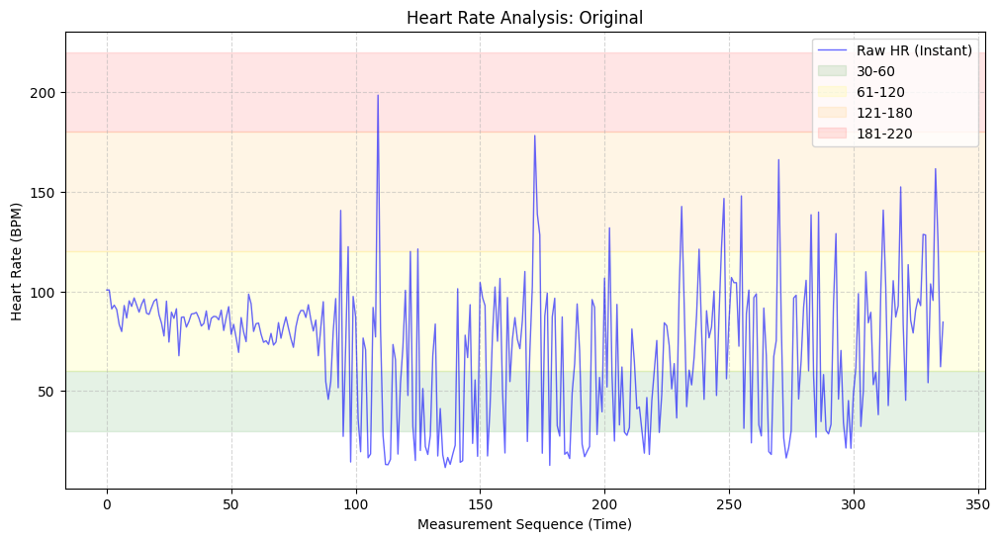

plot
301
182


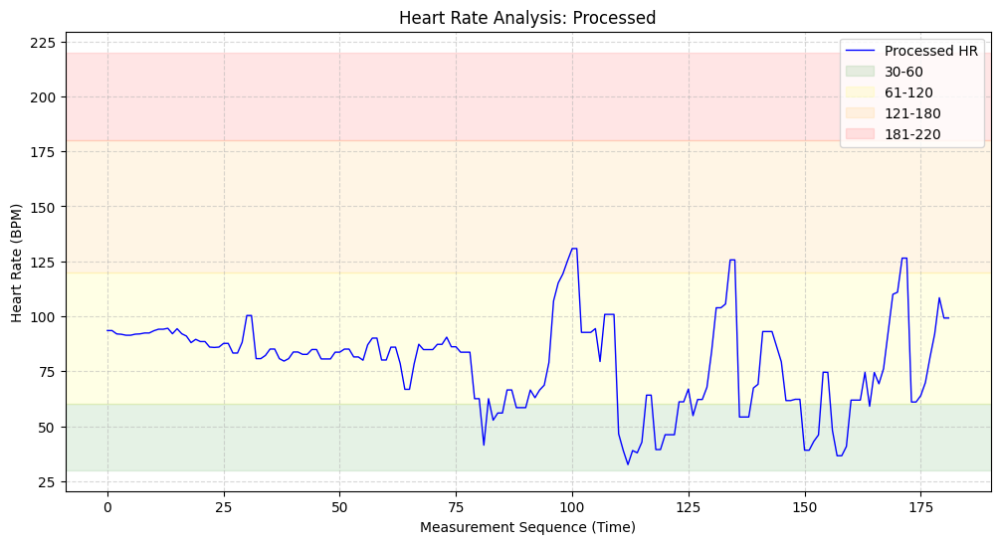

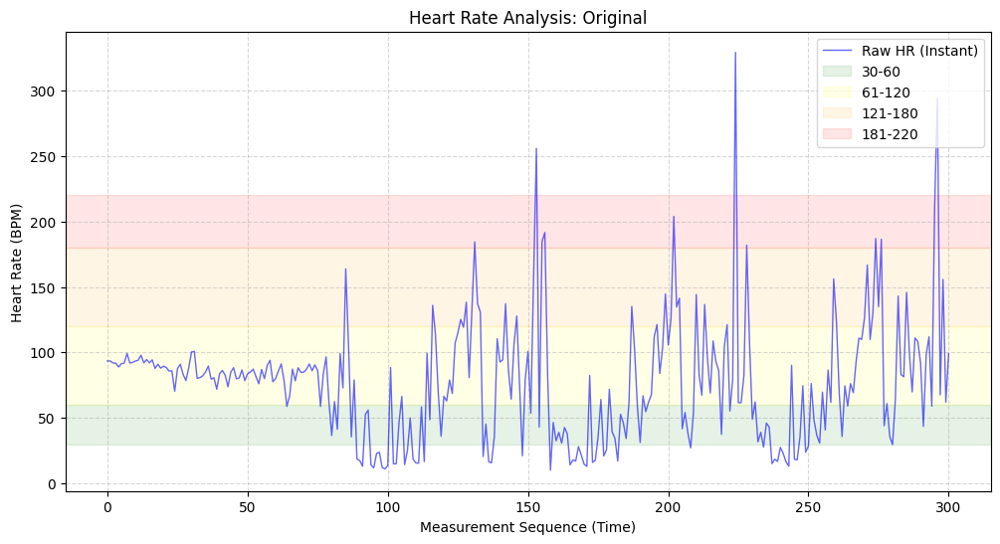

plot
445
335


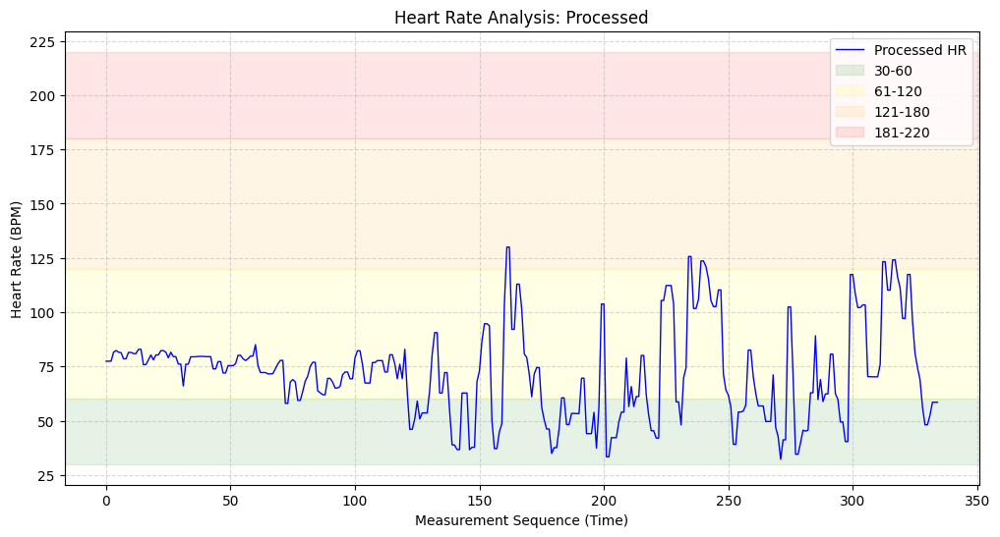

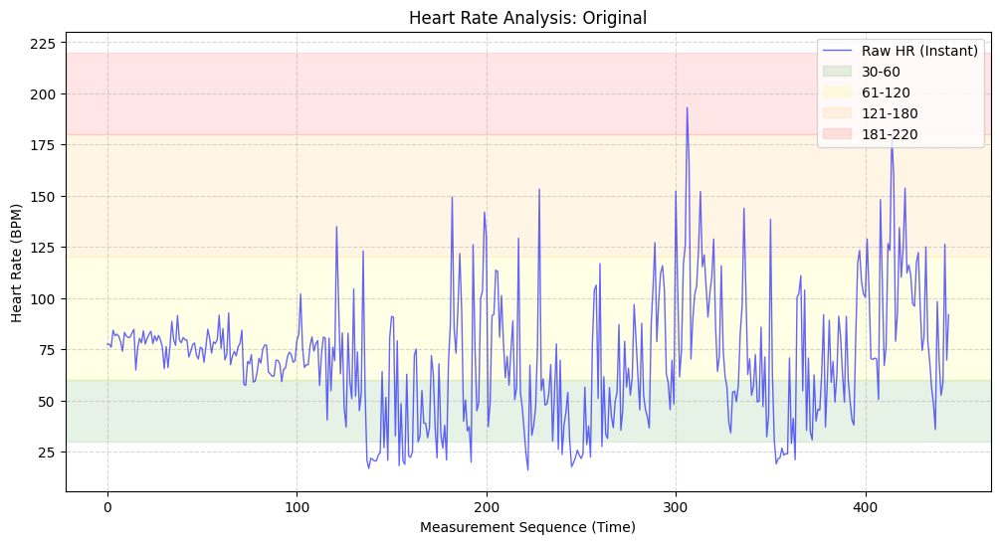

plot
337
206


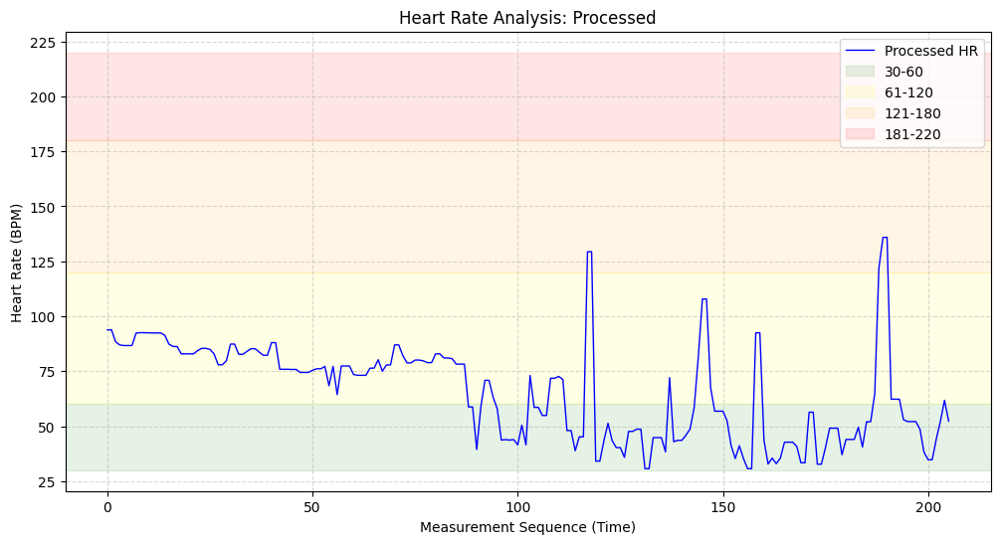

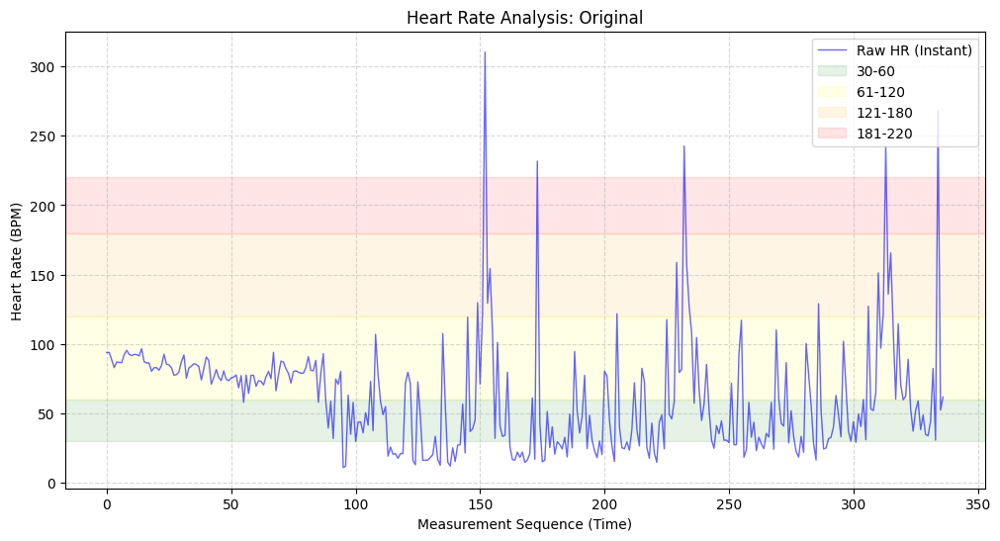

plot
357
245


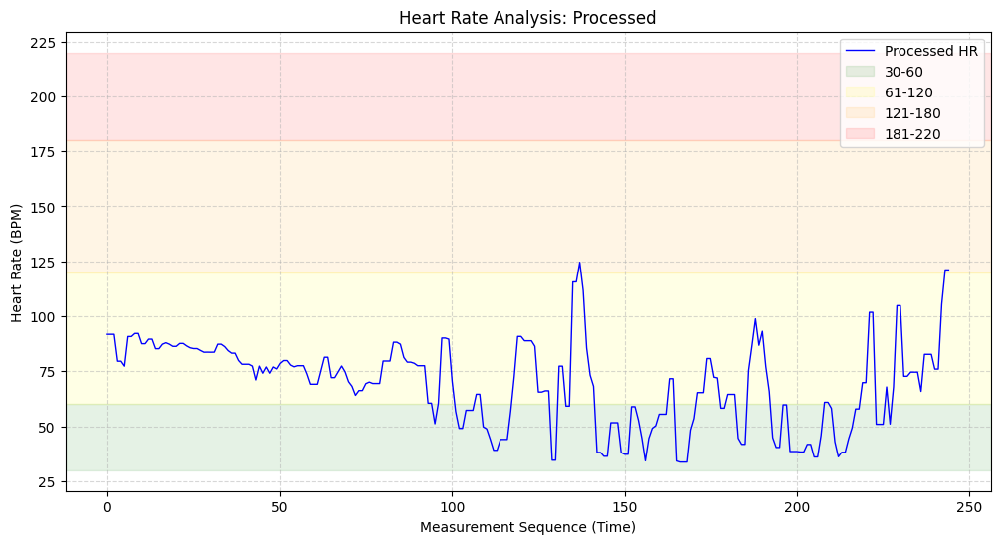

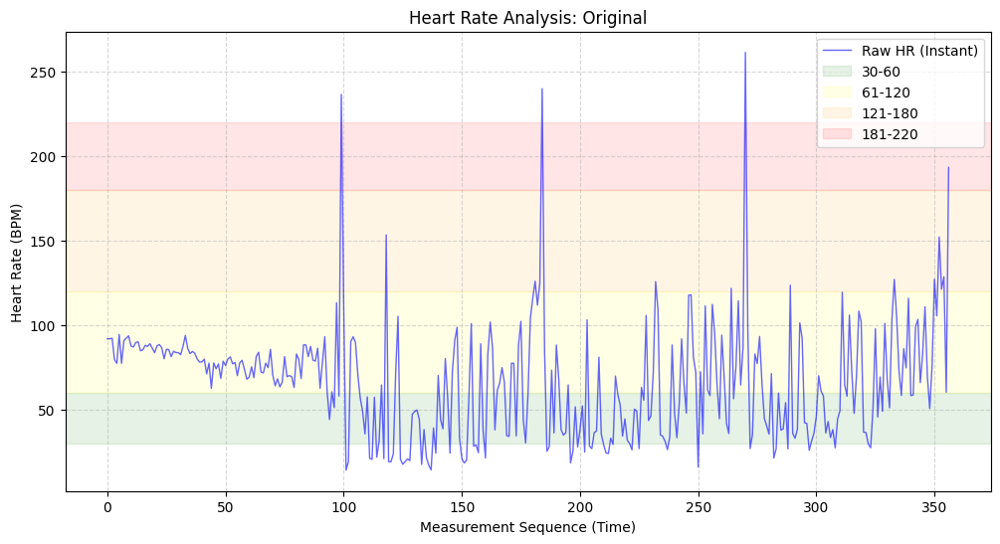

plot
481
314


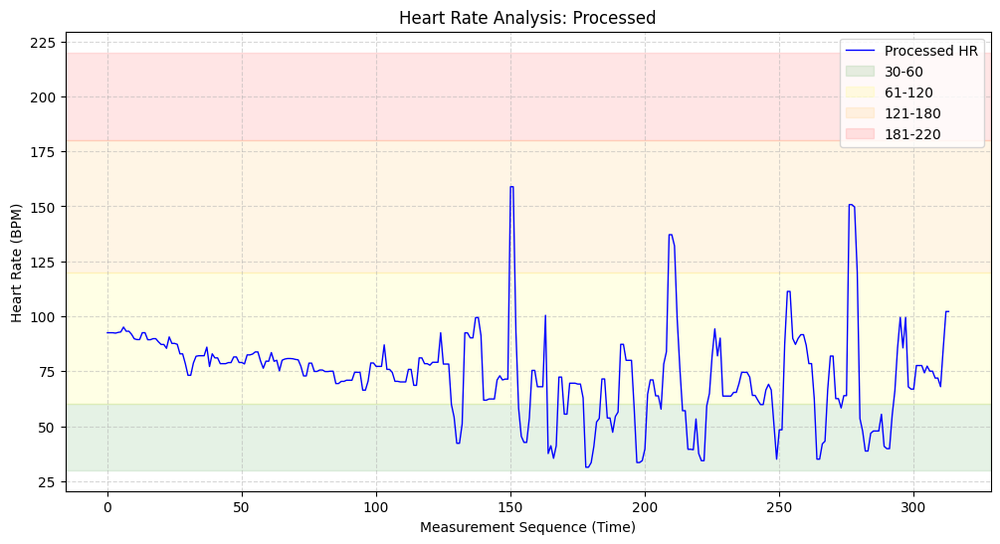

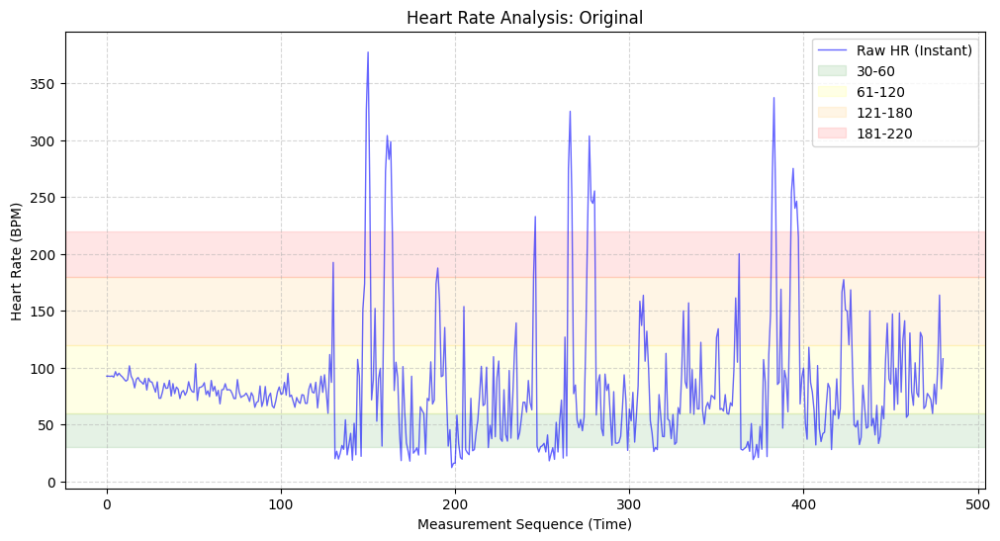

plot
373
205


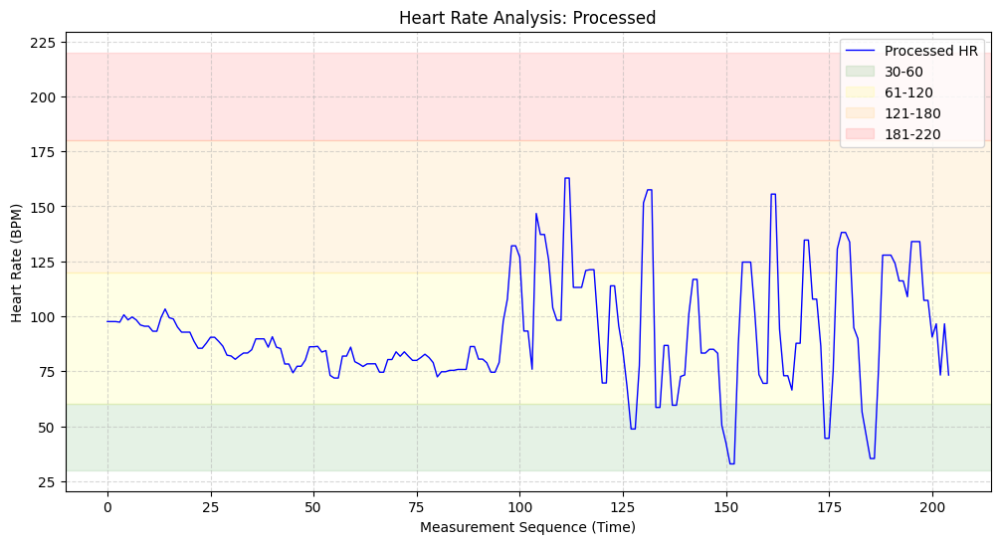

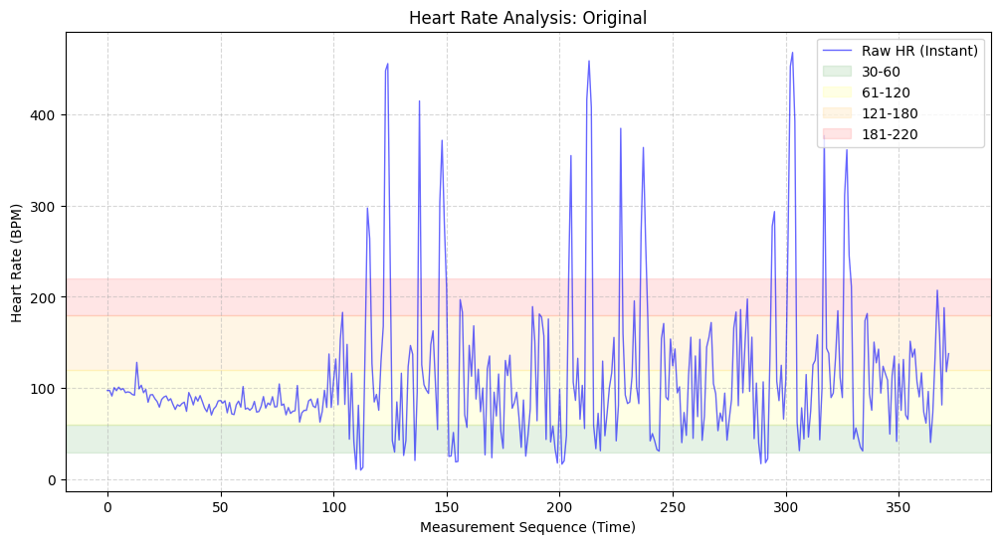

plot
445
298


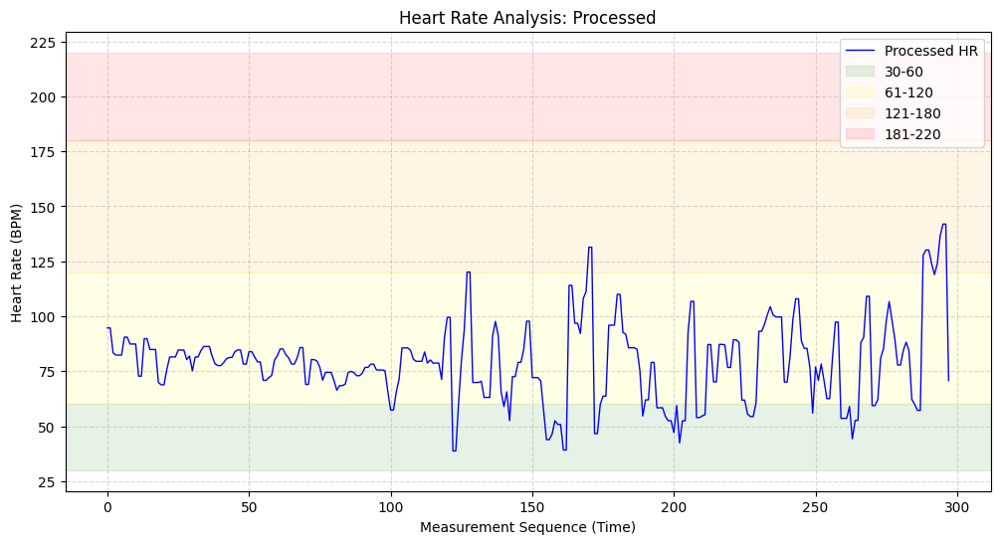

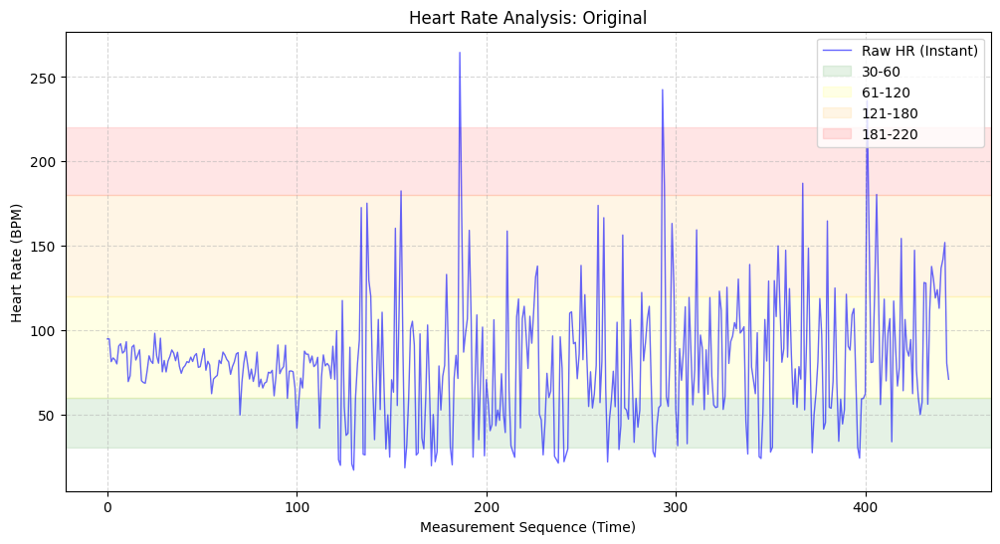

plot
445
280


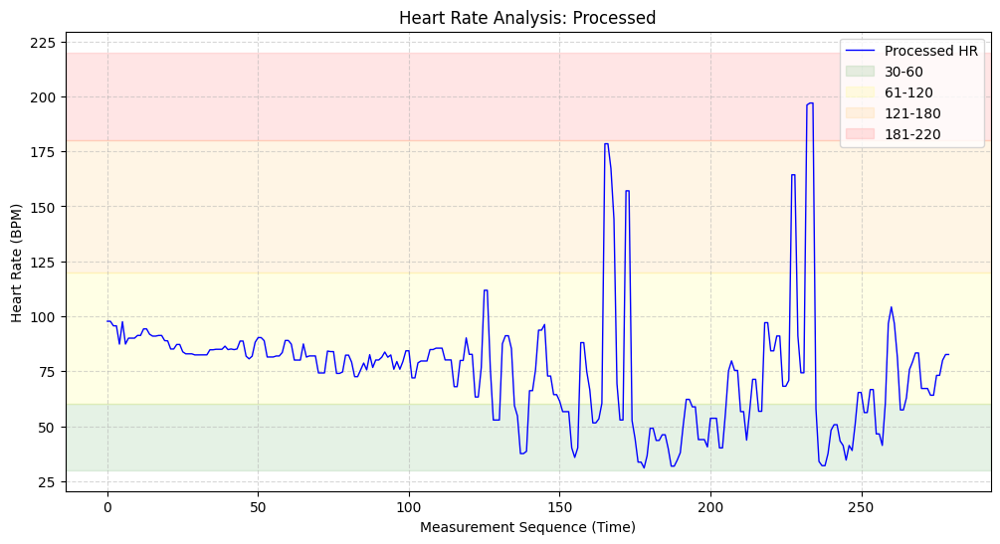

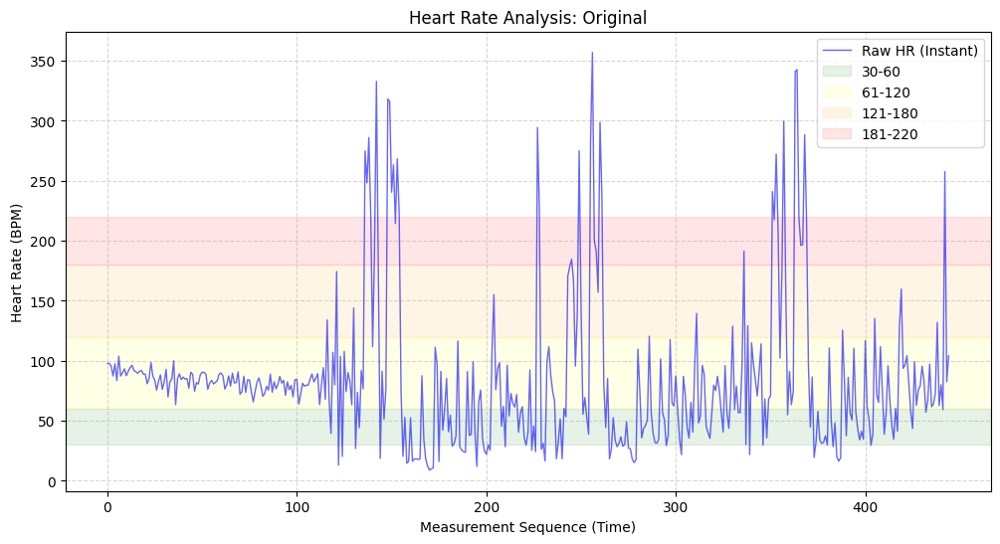

plot
457
293


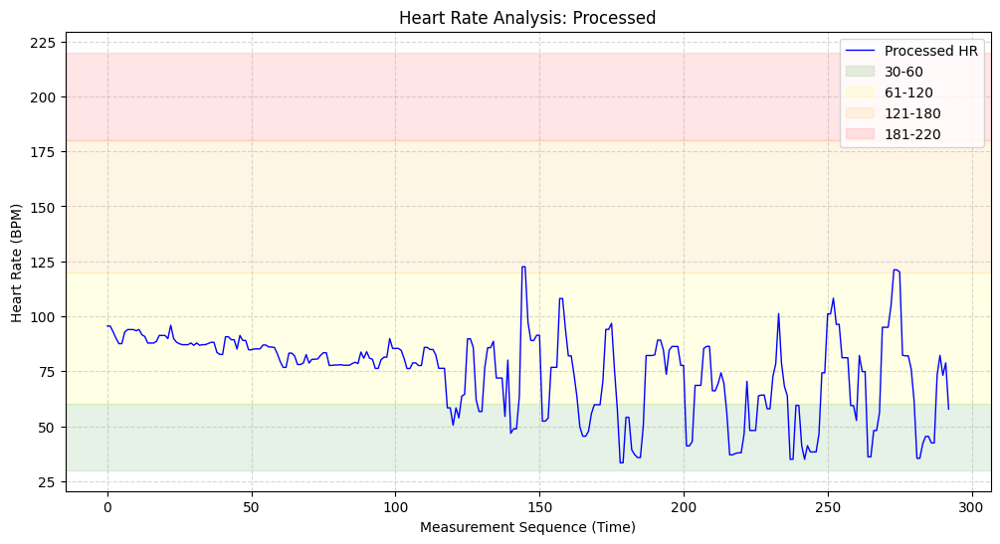

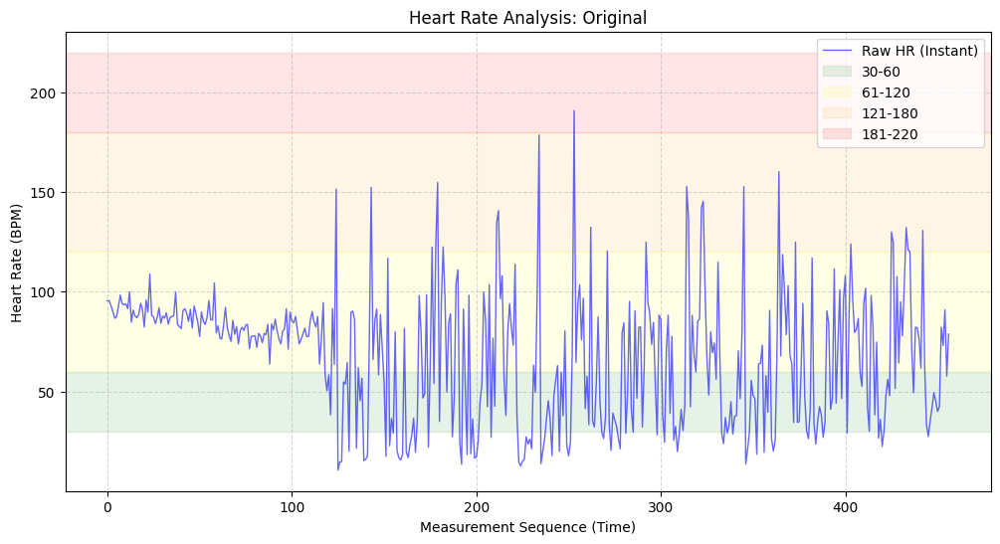

plot
269
180


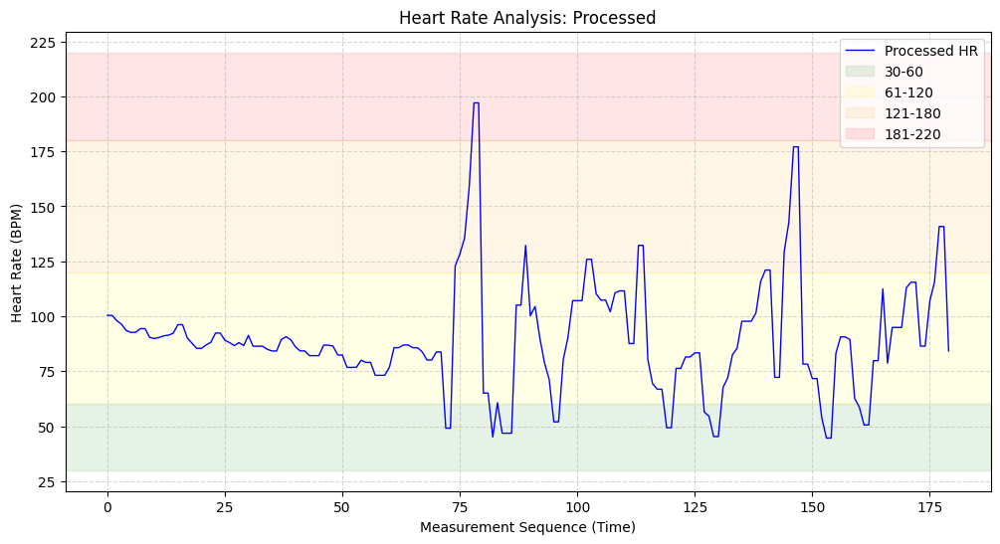

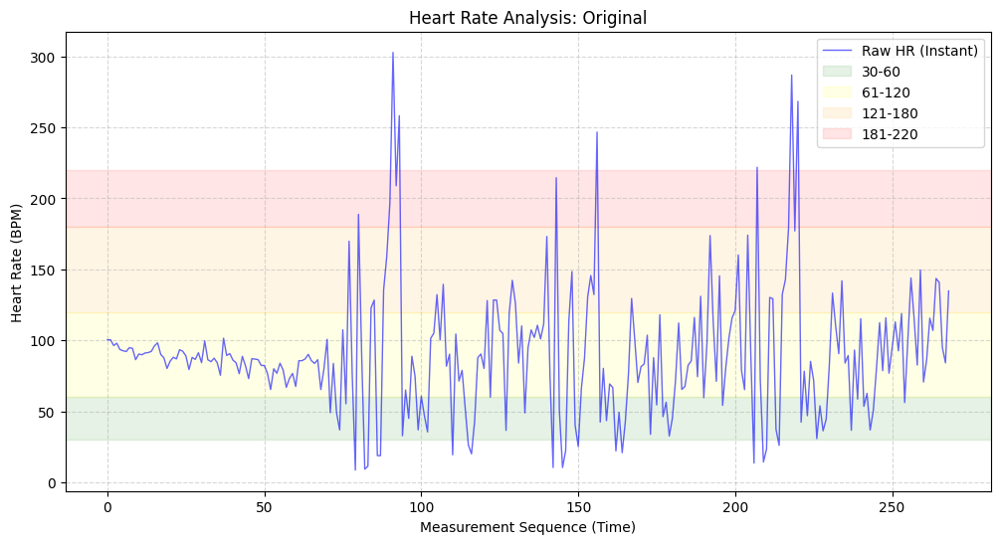

plot
313
192


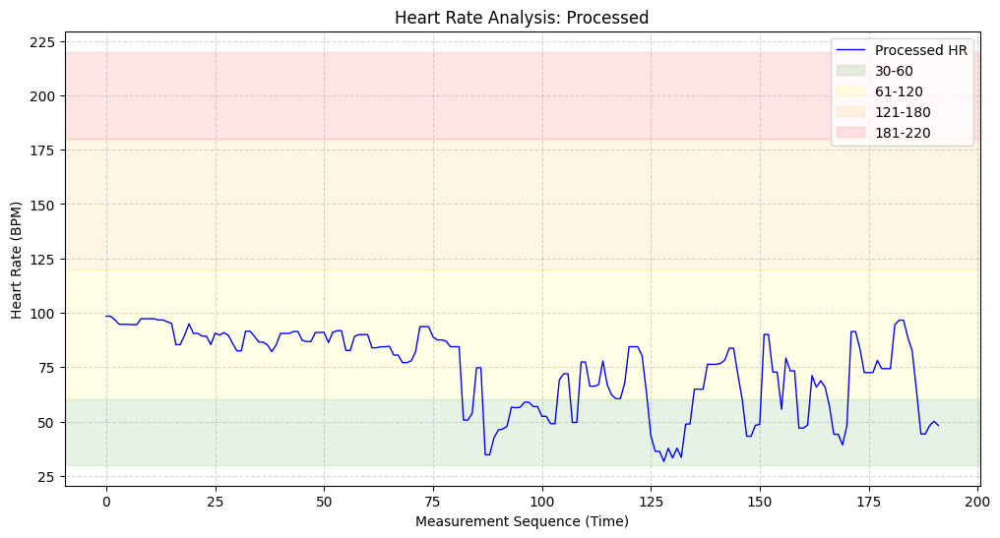

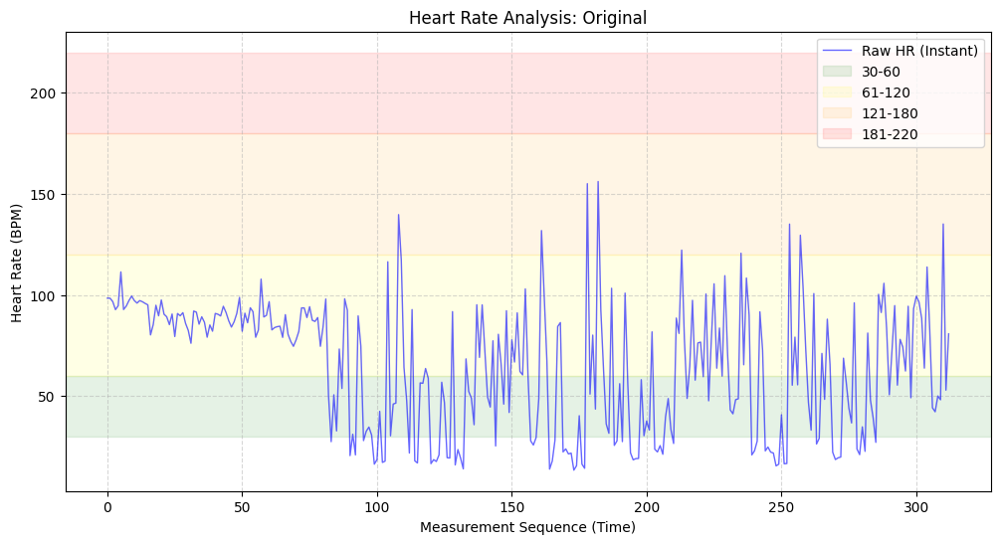

plot
361
219


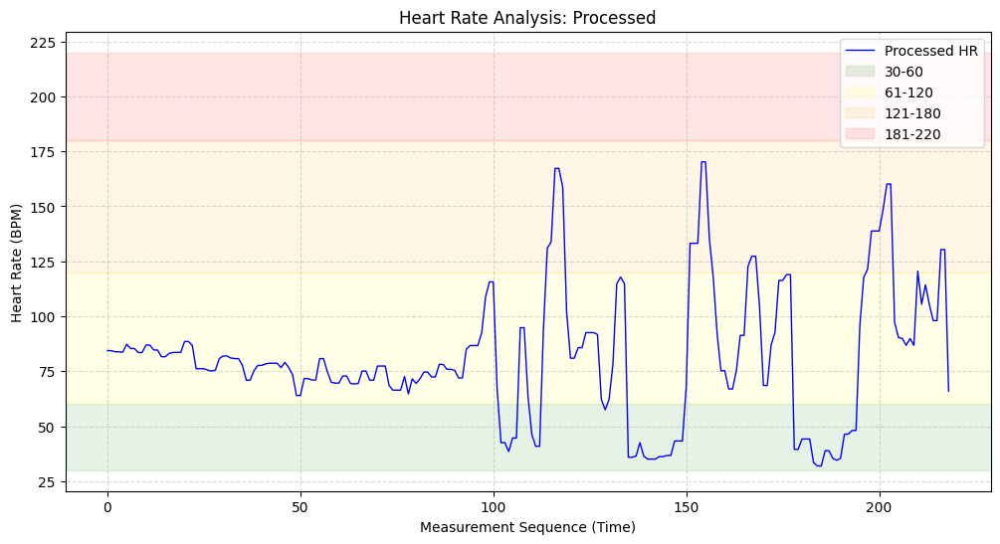

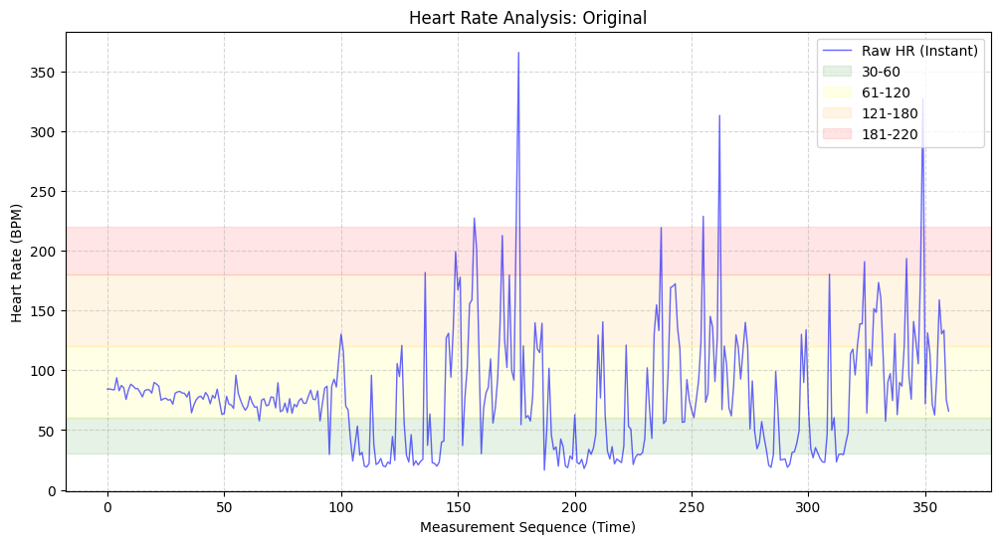

plot
321
205


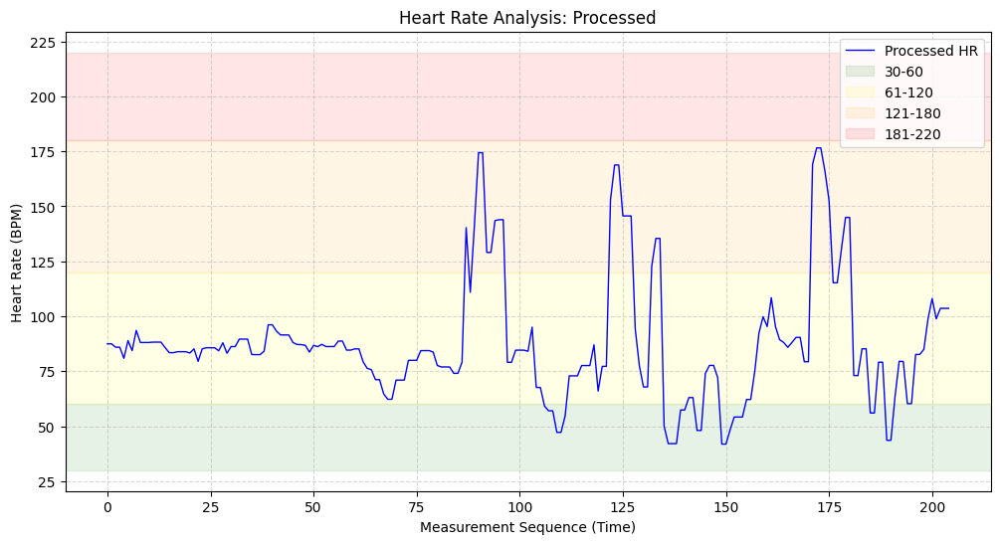

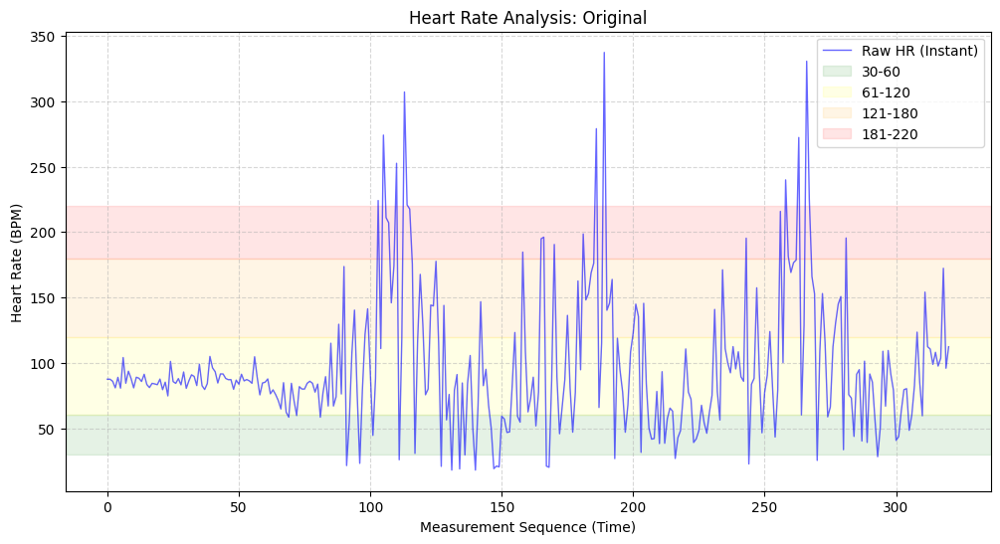

plot
357
208


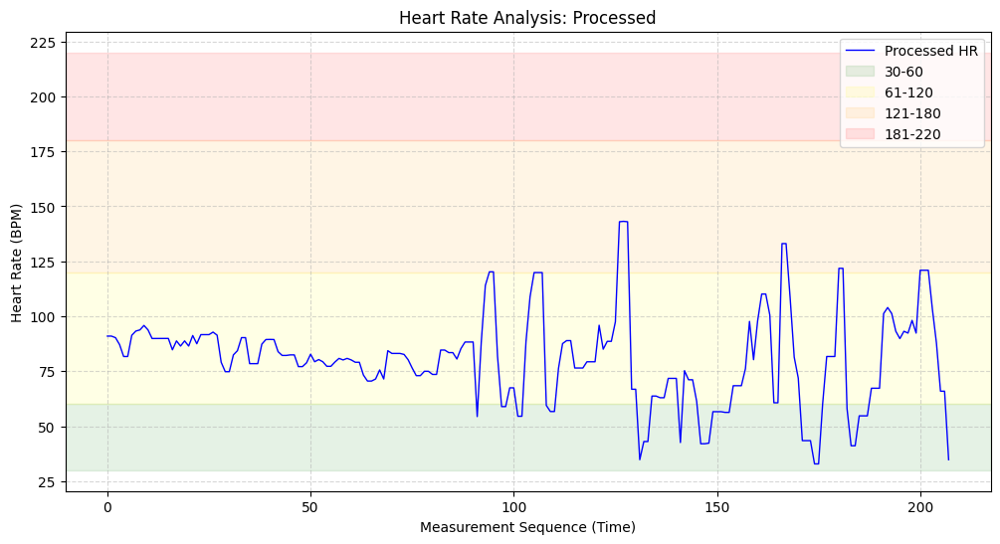

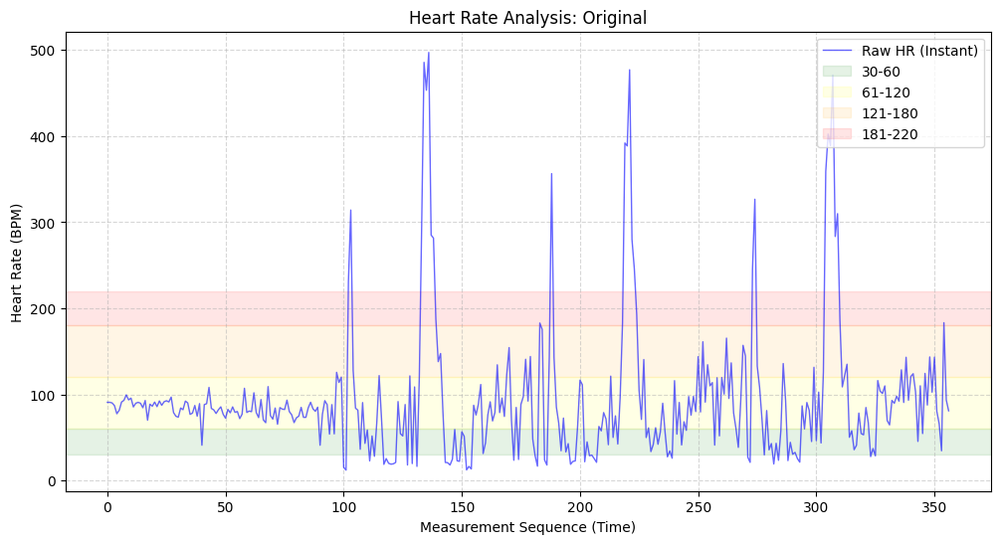

plot
369
245


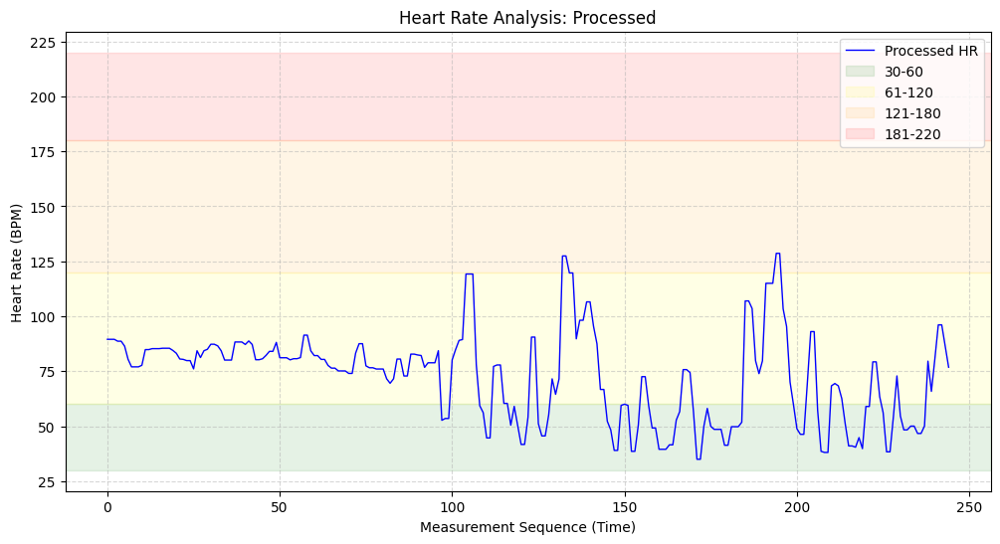

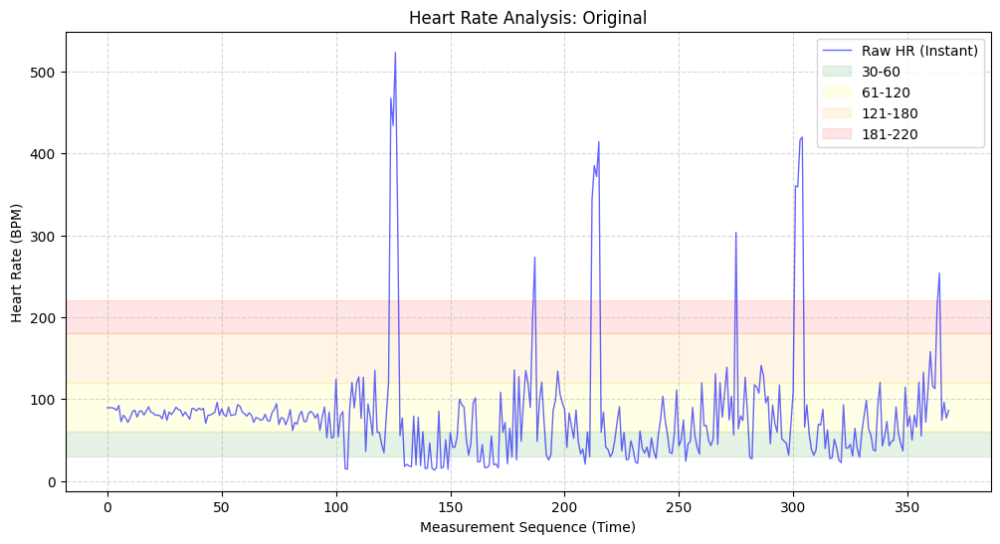

plot
297
180


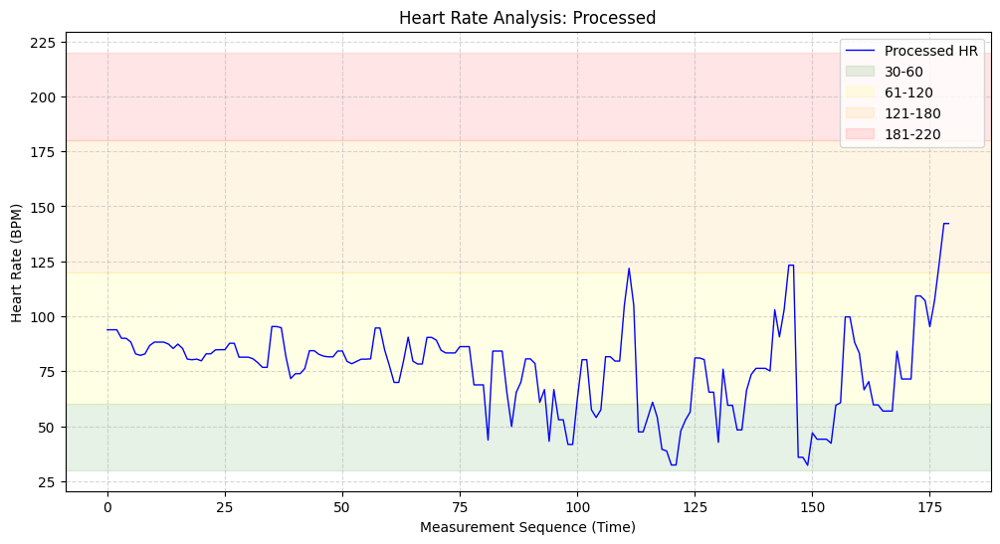

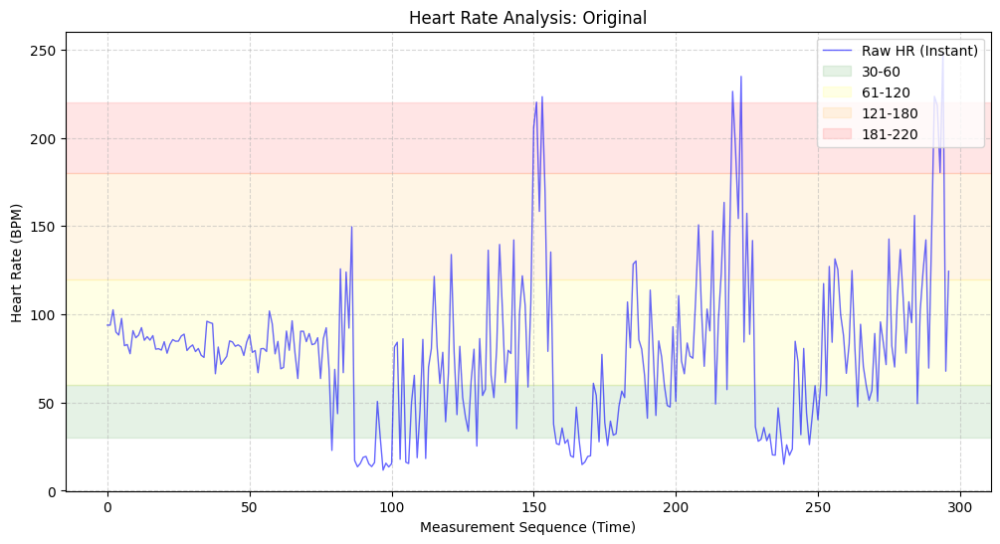

plot
245
156


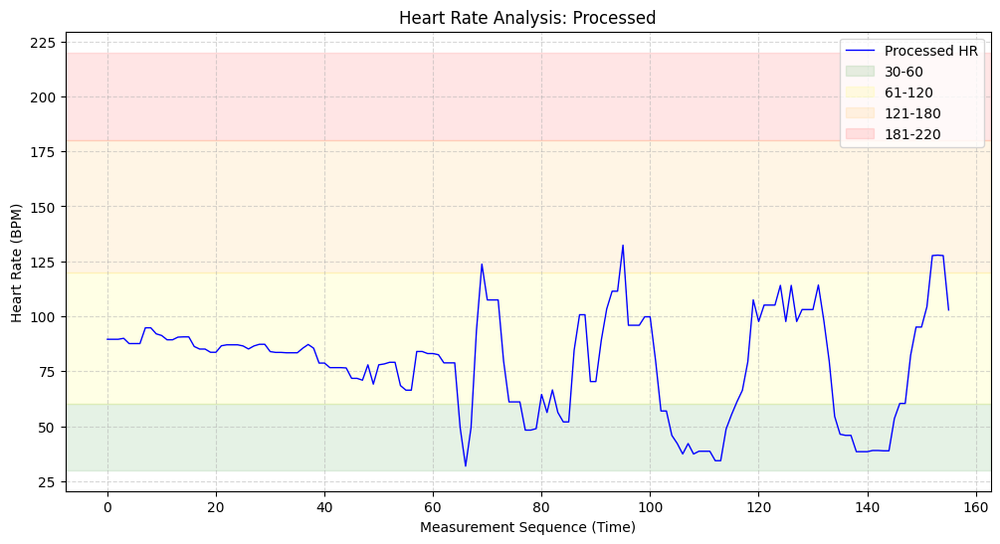

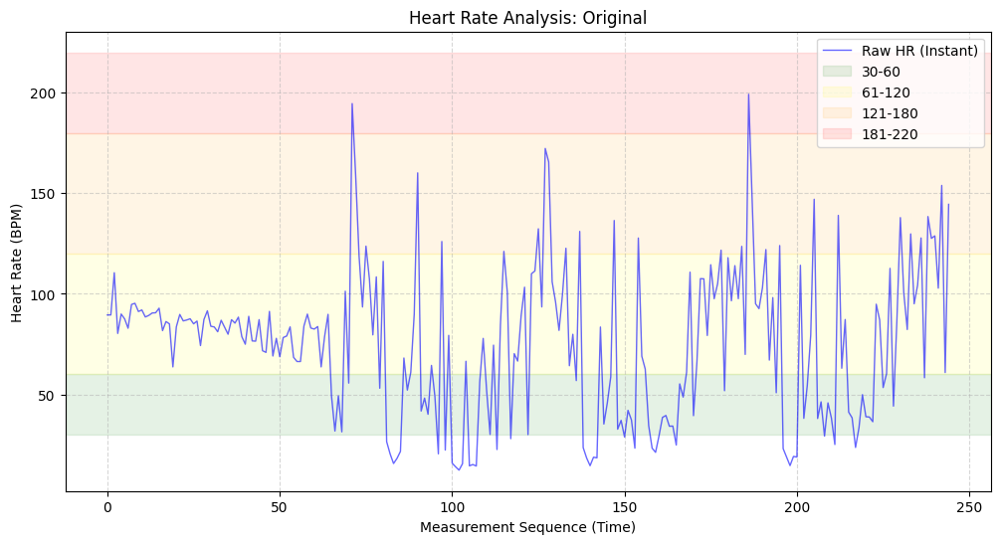

plot
381
227


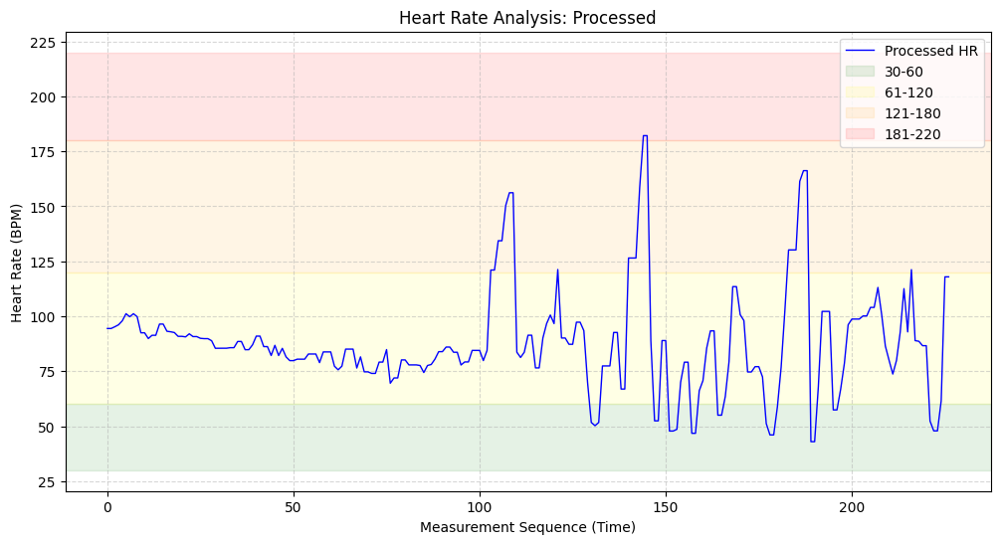

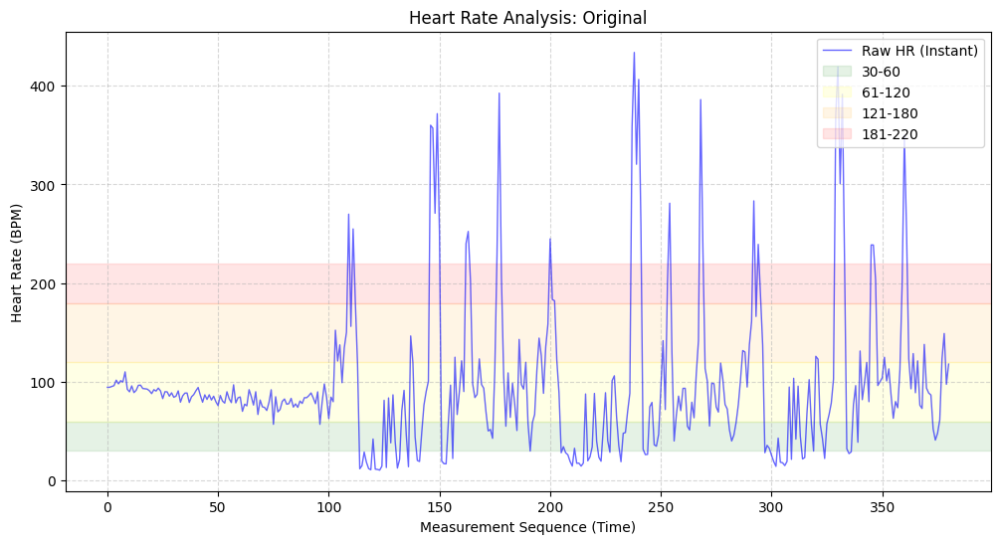

plot
260
150


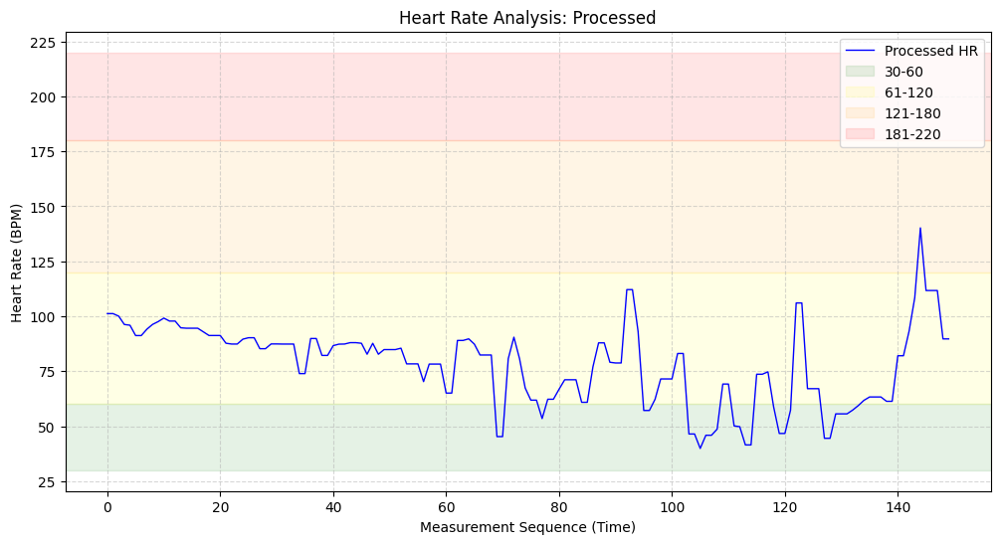

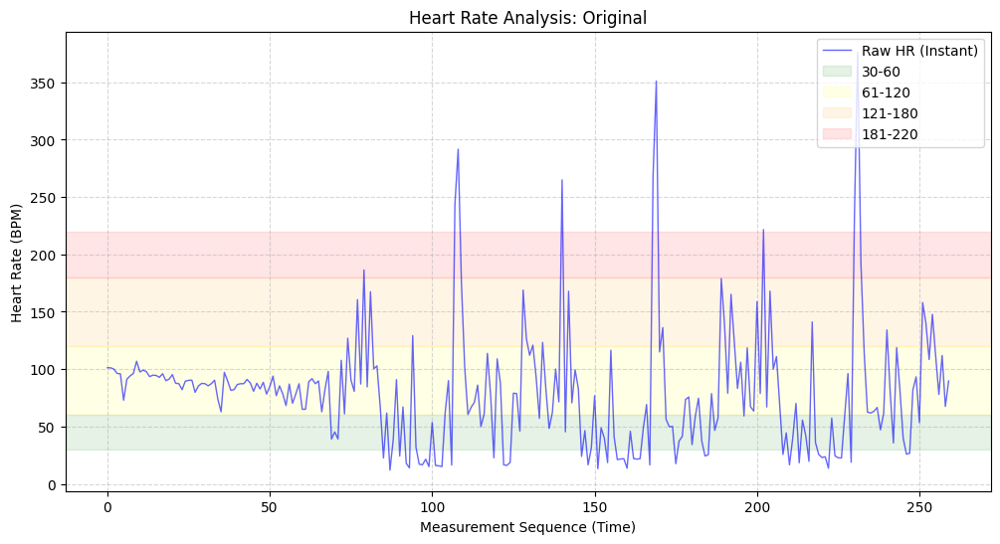

plot
241
146


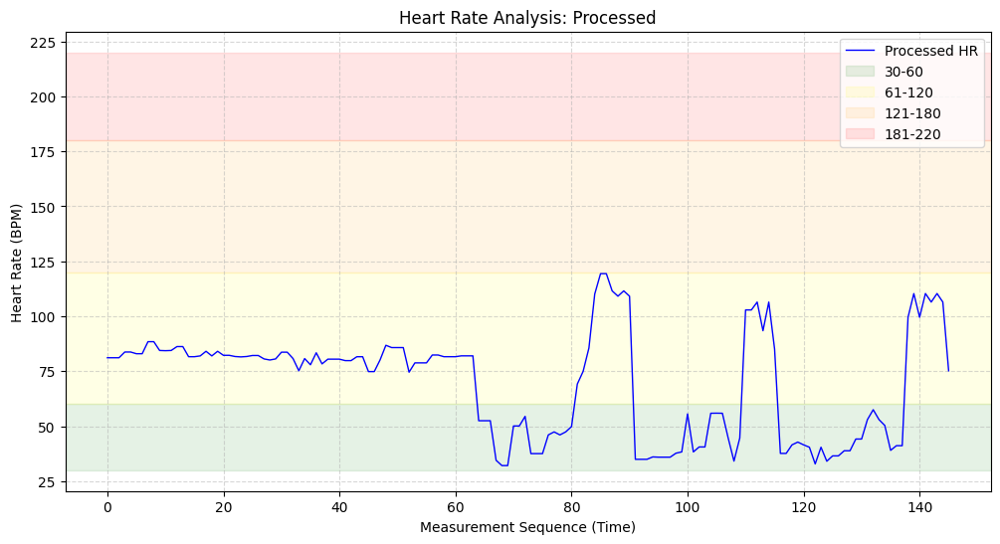

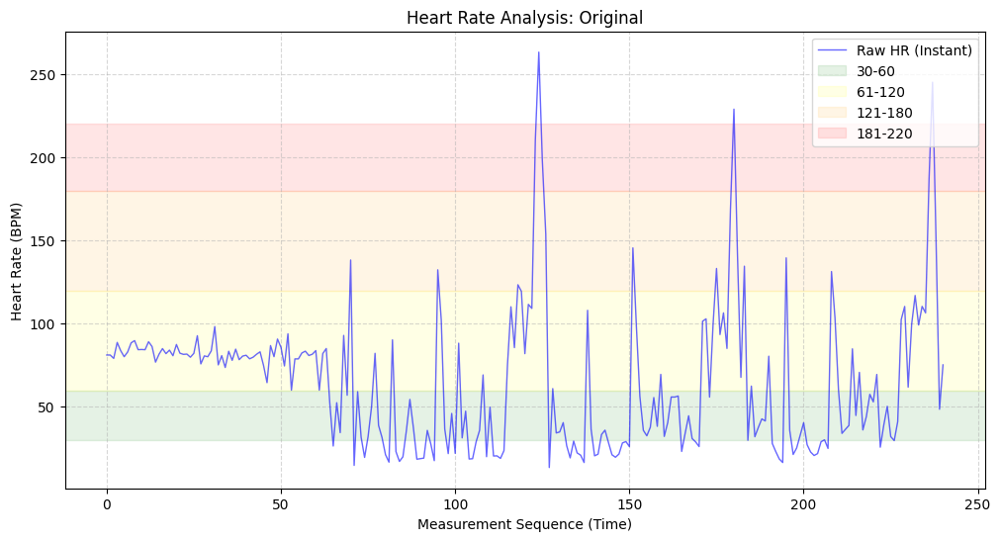

plot
421
290


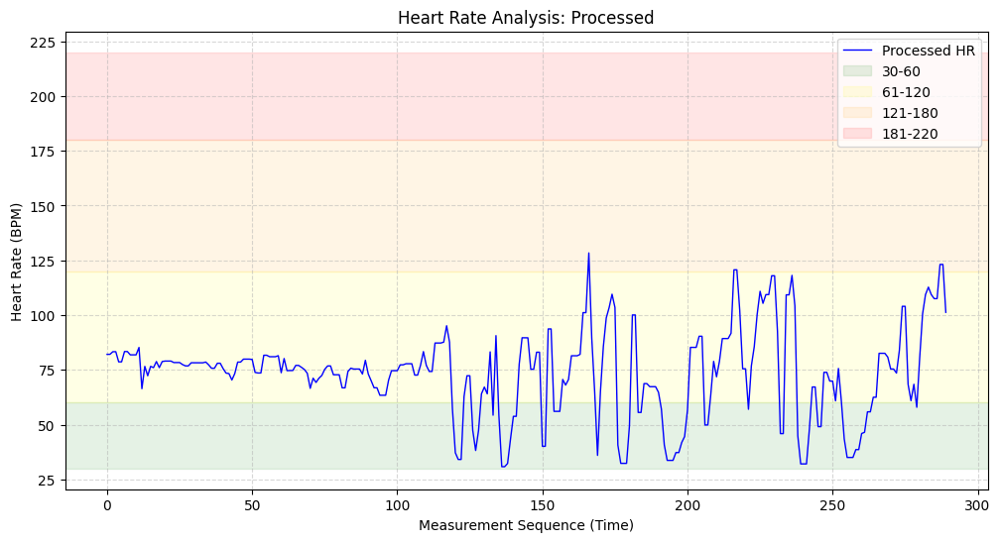

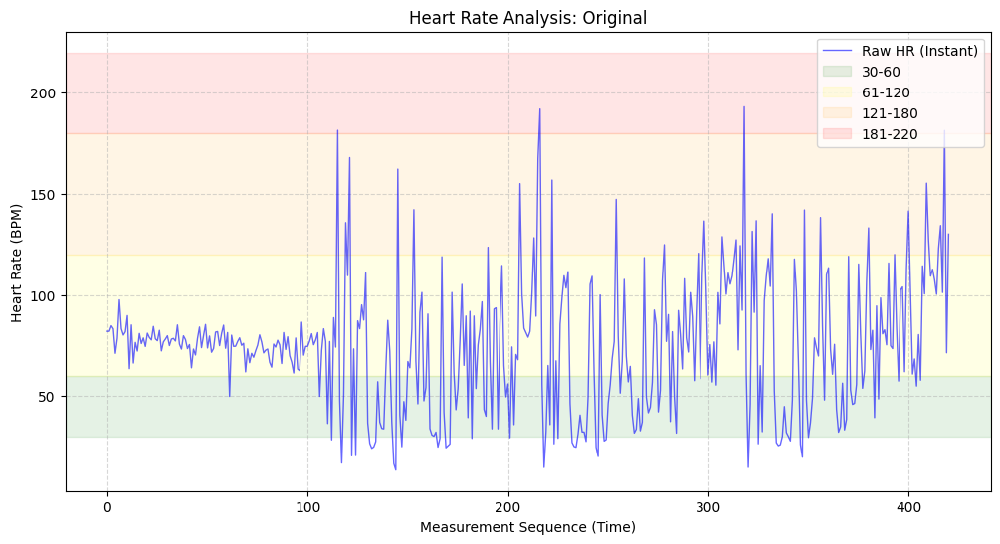

plot
323
223


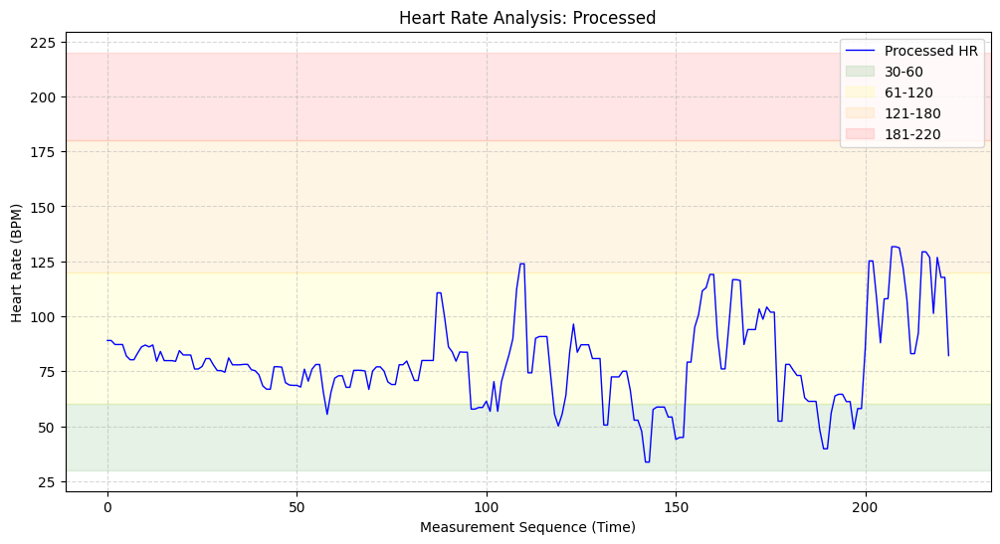

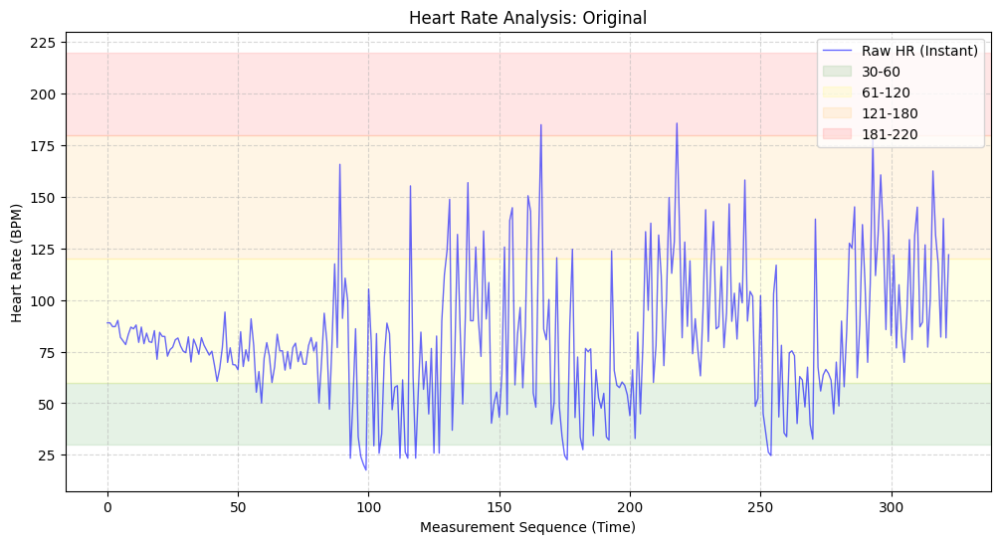

plot
331
191


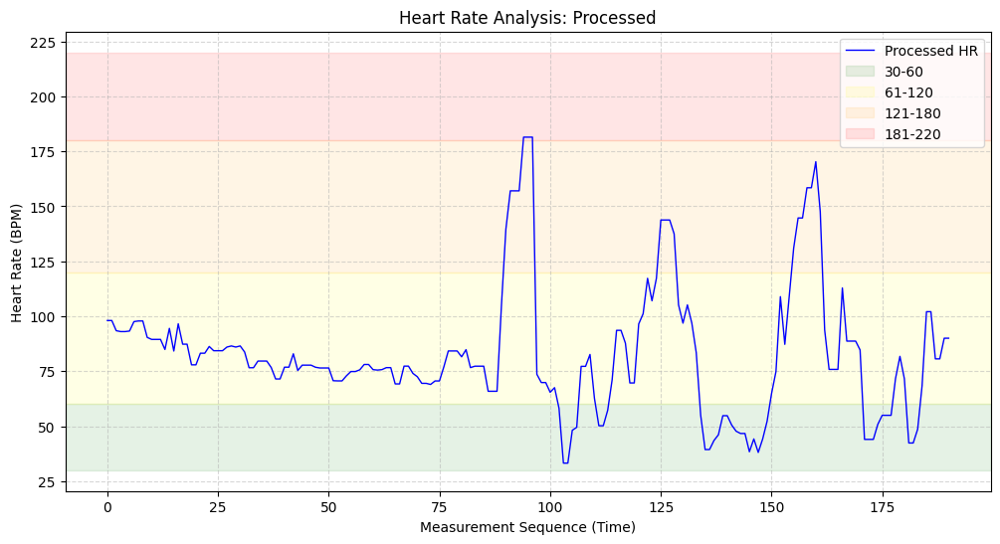

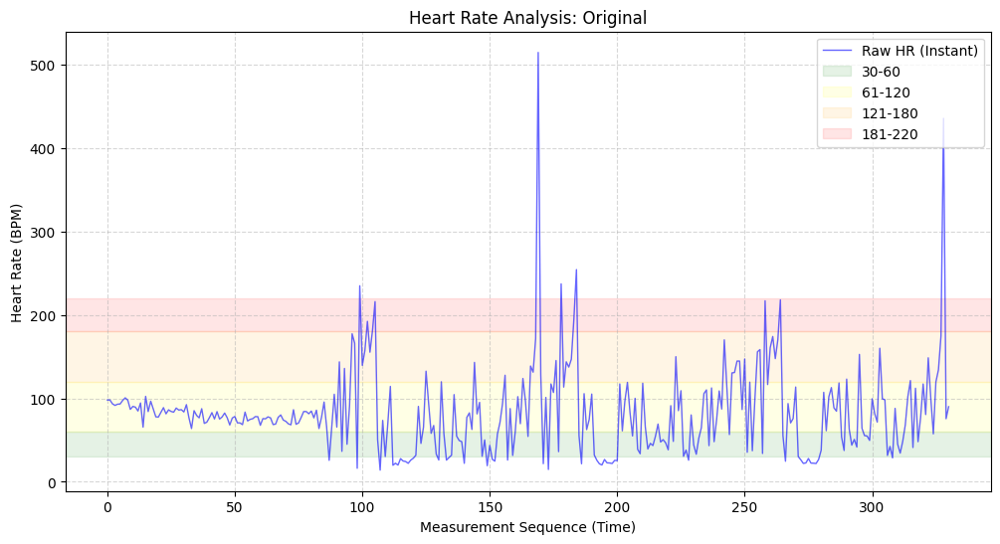

plot
317
206


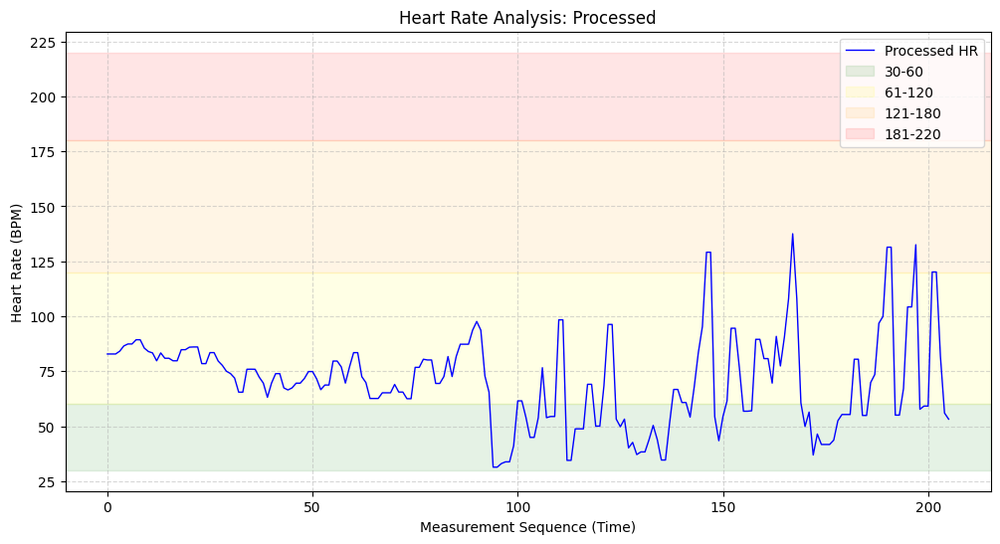

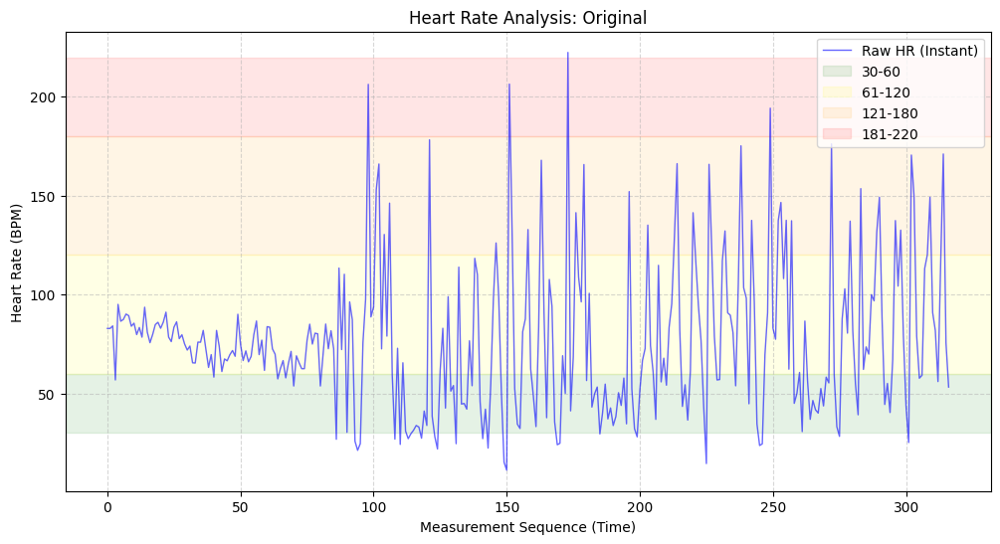

plot
249
161


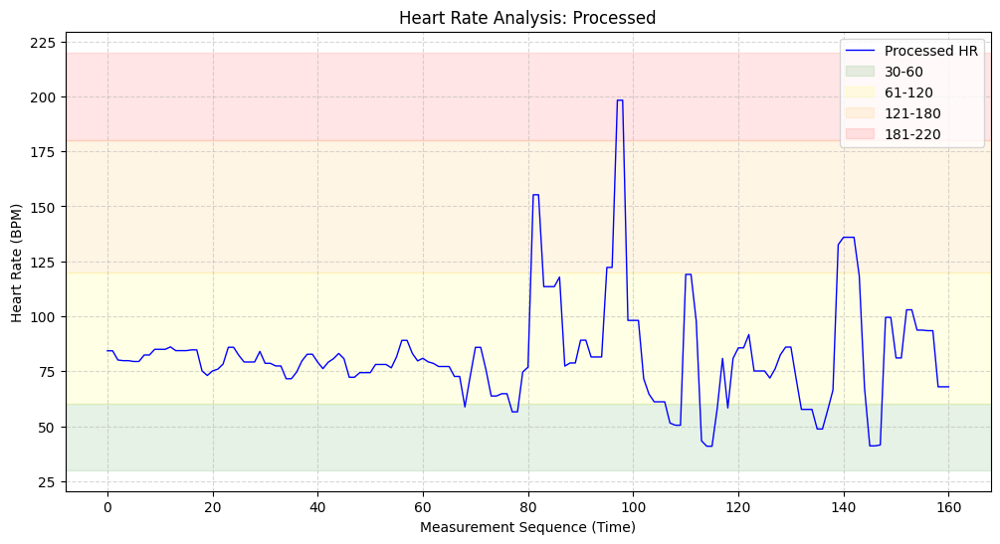

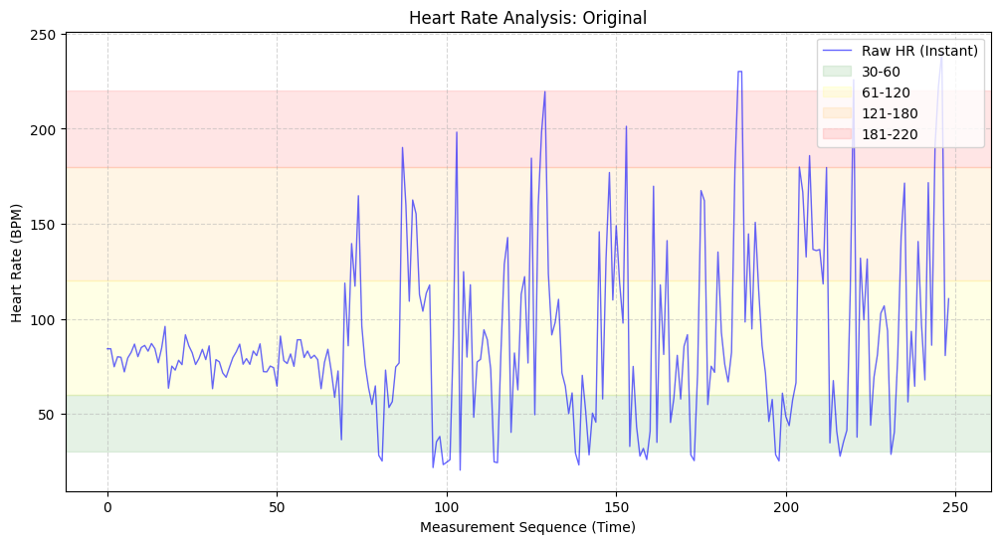

plot
265
149


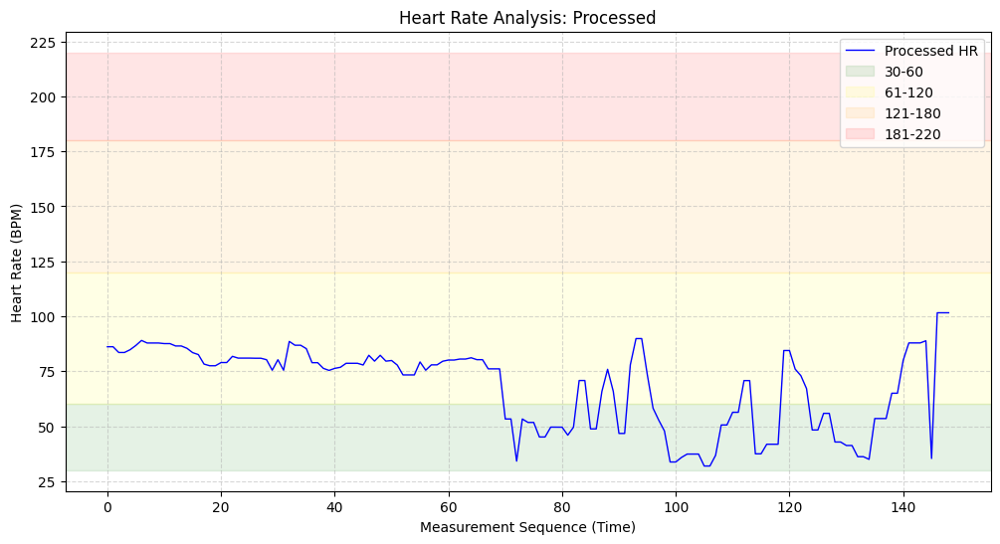

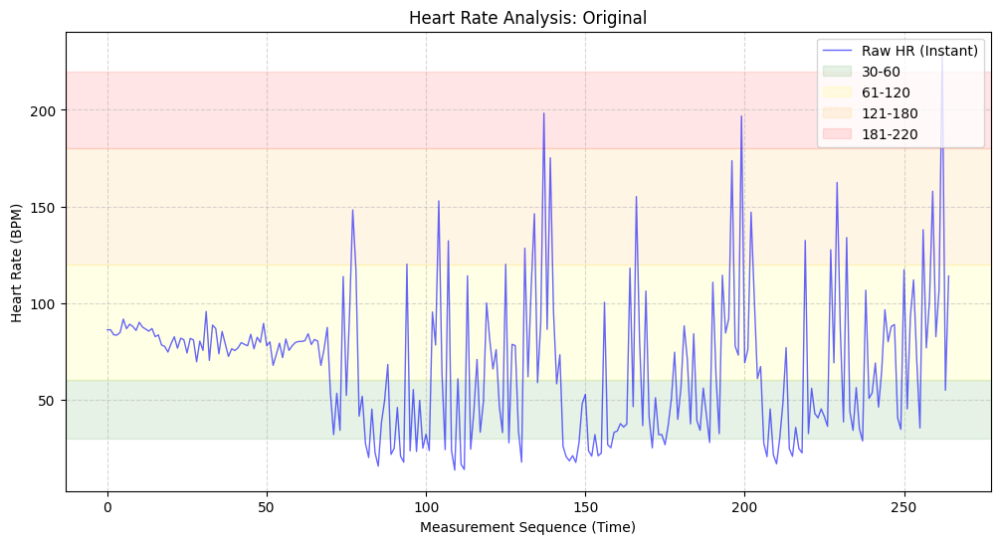

plot
329
246


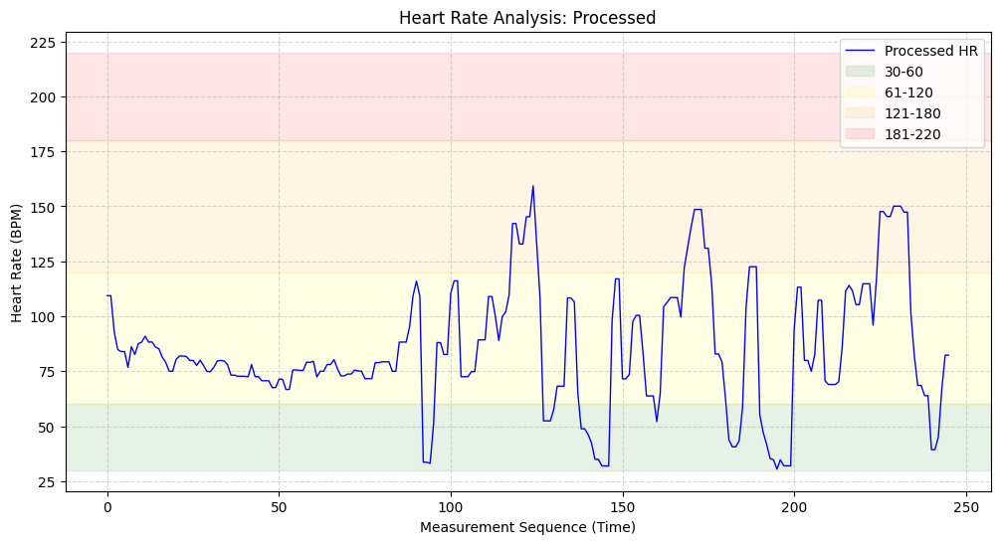

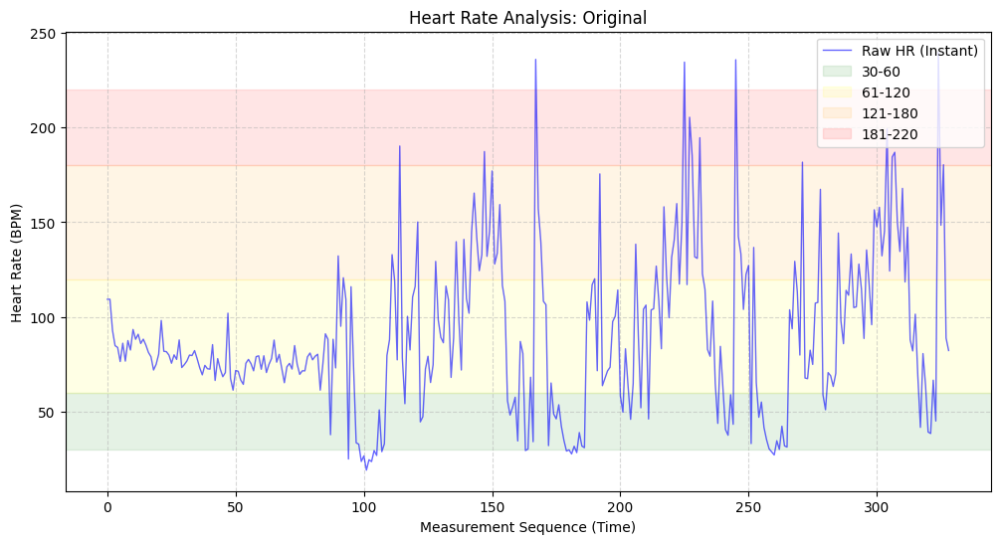

plot
309
206


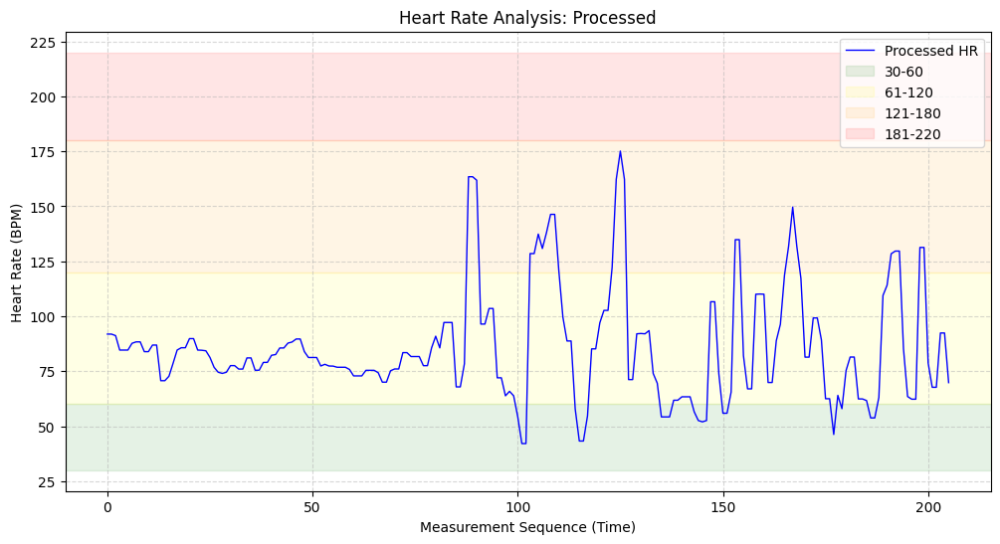

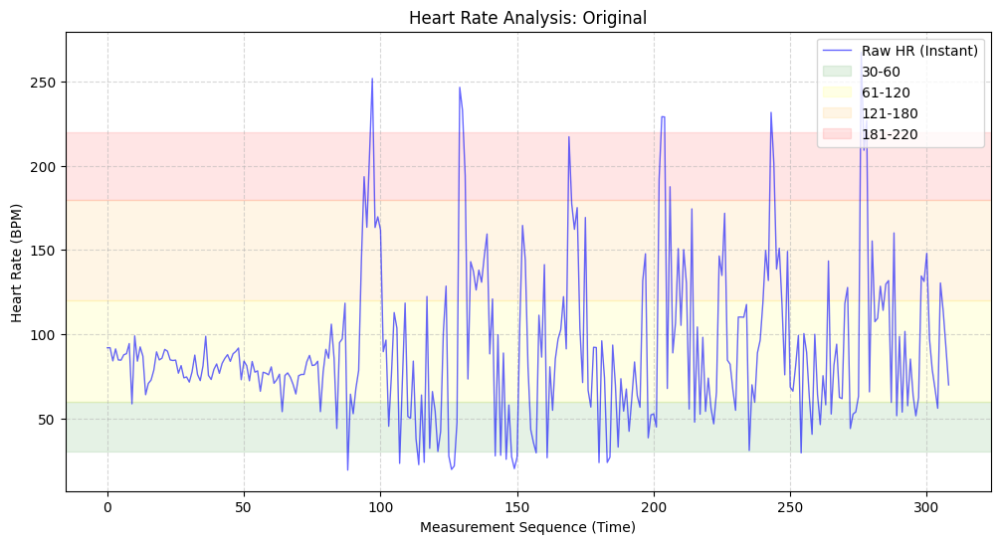

plot
545
402


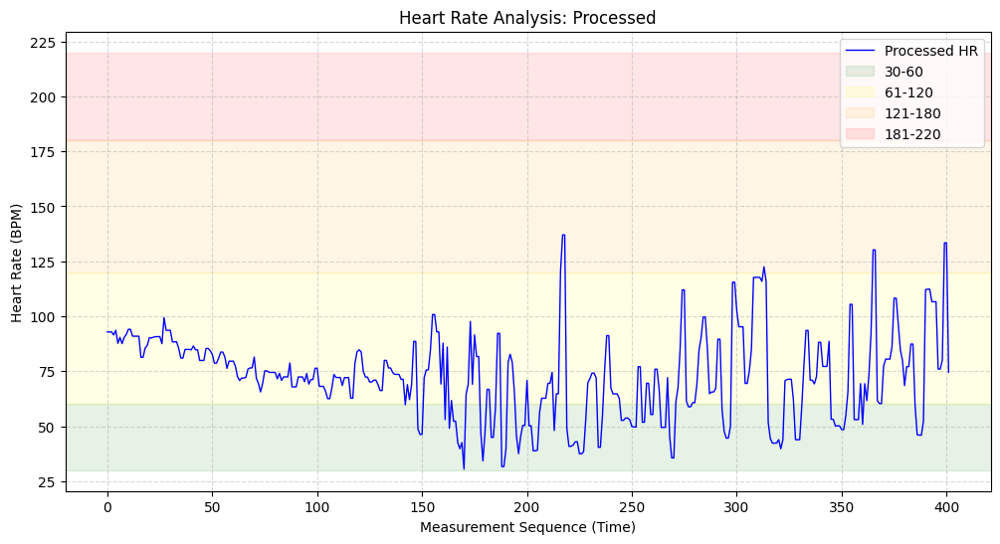

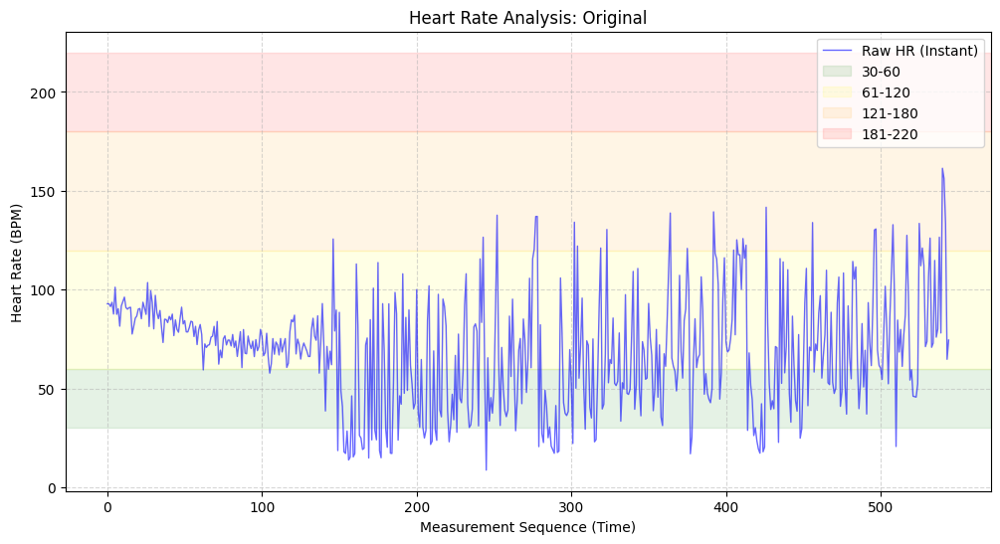

plot
333
221


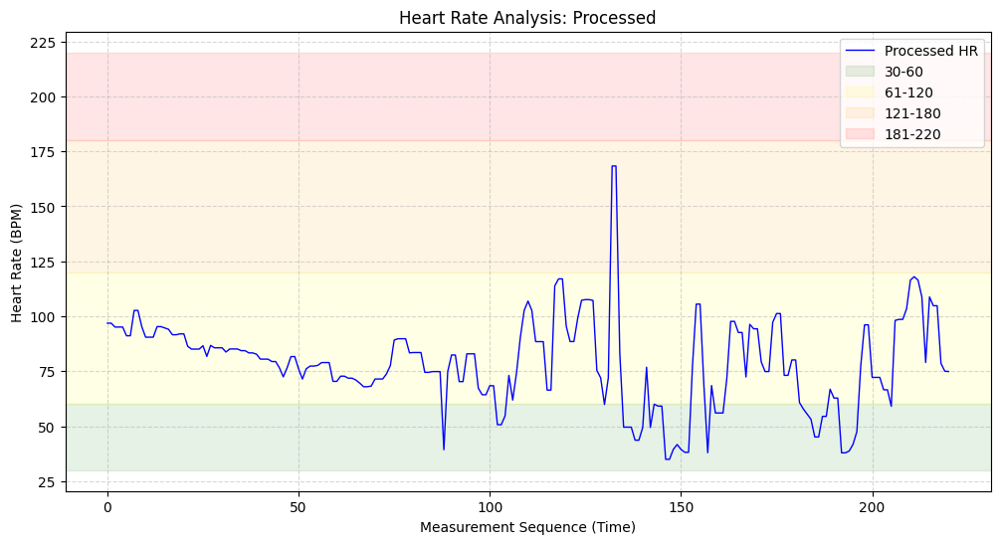

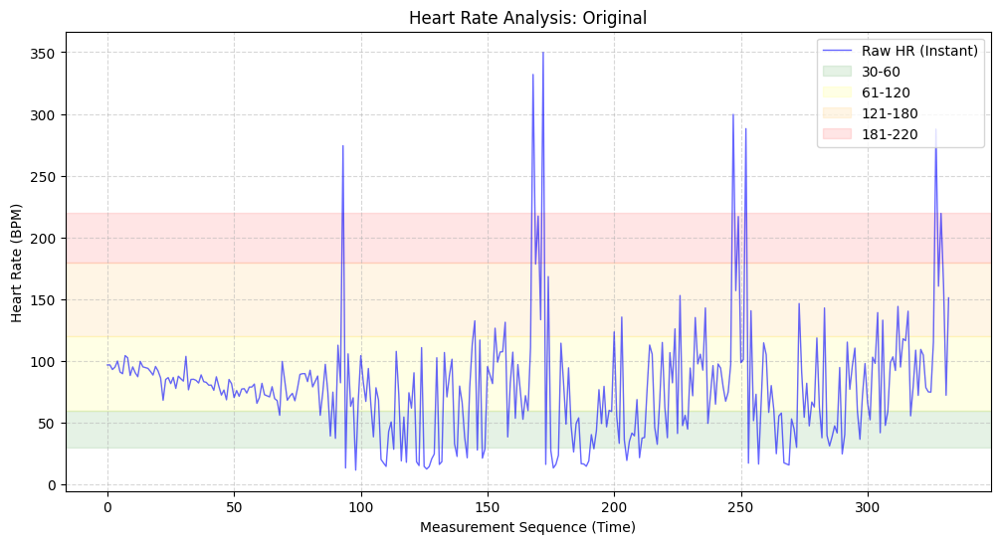

No valid HR data found to plot.
Index([                           'diary_date',
                           'scoring_result_id',
                               'stat_bed_time',
                             'stat_sleep_time',
                  'stat_time_to_sleep_minutes',
               'stat_sleep_interruption_count',
             'stat_sleep_interruption_minutes',
                        'stat_out_of_bed_time',
               'stat_total_sleep_time_minutes',
             'stat_bed_time_deviation_minutes',
         'subjective_sleep_interruption_count',
       'subjective_sleep_interruption_minutes',
                               'sleep_quality',
                        'sleep_score_averaged',
                                 'sleep_score',
                                          'SE',
                                         'TIB',
                                         'TSP',
                                        'WTSP',
                                      'WTSP_2',
        

In [9]:
# process HR
import pandas as pd
import numpy as np
from scipy.signal import medfilt
from scipy.stats import zscore

import numpy as np
import pandas as pd
from scipy.signal import medfilt

def preprocess_hr_metrics(hr_string):
    if pd.isna(hr_string):
        return pd.Series({
            "hr_mean": np.nan,
            "hr_std": np.nan,
            "hr_min": np.nan,
            "hr_max": np.nan,
            "hr_trend": np.nan,
            "hr_missing_pct": 100.0,
            "hr_bin_30_60_pct": np.nan,
            "hr_bin_60_120_pct": np.nan,
            "hr_bin_120_180_pct": np.nan,
            "hr_bin_180_220_pct": np.nan,
        })

    # -----------------------------
    # Safe parsing
    # -----------------------------
    invalid_tokens = {"", "null", "nan", "None", "NONE", "NaN"}
    hr_raw = []

    for x in str(hr_string).split("|"):
        x = x.strip()
        if x not in invalid_tokens:
            try:
                hr_raw.append(float(x))
            except ValueError:
                continue

    hr_raw = np.array(hr_raw)

    if len(hr_raw) == 0:
        return pd.Series({
            "hr_mean": np.nan,
            "hr_std": np.nan,
            "hr_min": np.nan,
            "hr_max": np.nan,
            "hr_trend": np.nan,
            "hr_missing_pct": 100.0,
            "hr_bin_30_60_pct": np.nan,
            "hr_bin_60_120_pct": np.nan,
            "hr_bin_120_180_pct": np.nan,
            "hr_bin_180_220_pct": np.nan,
        })

    # -----------------------------
    # Physiological filtering
    # -----------------------------
    hr_valid = hr_raw[(hr_raw >= 30) & (hr_raw <= 220)]

    if len(hr_valid) == 0:
        return pd.Series({
            "hr_mean": np.nan,
            "hr_std": np.nan,
            "hr_min": np.nan,
            "hr_max": np.nan,
            "hr_trend": np.nan,
            "hr_missing_pct": 100.0,
            "hr_bin_30_60_pct": np.nan,
            "hr_bin_60_120_pct": np.nan,
            "hr_bin_120_180_pct": np.nan,
            "hr_bin_180_220_pct": np.nan,
        })

    # -----------------------------
    # Artifact removal (sudden jumps)
    # -----------------------------
    diff = np.abs(np.diff(hr_valid))
    hr_valid = hr_valid[np.insert(diff < 40, 0, True)]

    # -----------------------------
    # Median filtering
    # -----------------------------
    if len(hr_valid) >= 3:
        hr_smooth = medfilt(hr_valid, kernel_size=3)
    else:
        hr_smooth = hr_valid

    # -----------------------------
    # Core HR features
    # -----------------------------
    hr_mean = hr_smooth.mean()
    hr_std = hr_smooth.std(ddof=1) if len(hr_smooth) > 1 else 0.0
    hr_min = hr_smooth.min()
    hr_max = hr_smooth.max()

    time_idx = np.arange(len(hr_smooth))
    hr_trend = np.polyfit(time_idx, hr_smooth, 1)[0] if len(hr_smooth) > 1 else 0.0

    hr_missing_pct = 100 * (1 - len(hr_smooth) / len(hr_raw))

    # -----------------------------
    # Heart-rate bins
    # -----------------------------
    total = len(hr_smooth)

    hr_bin_30_60_pct = np.sum((hr_smooth >= 30) & (hr_smooth < 60)) / total * 100
    hr_bin_60_120_pct = np.sum((hr_smooth >= 60) & (hr_smooth < 120)) / total * 100
    hr_bin_120_180_pct = np.sum((hr_smooth >= 120) & (hr_smooth < 180)) / total * 100
    hr_bin_180_220_pct = np.sum((hr_smooth >= 180) & (hr_smooth <= 220)) / total * 100

    return pd.Series({
        "hr_mean": hr_mean,
        "hr_std": hr_std,
        "hr_min": hr_min,
        "hr_max": hr_max,
        "hr_trend": hr_trend,
        "hr_missing_pct": hr_missing_pct,
        "hr_bin_30_60_pct": hr_bin_30_60_pct,
        "hr_bin_60_120_pct": hr_bin_60_120_pct,
        "hr_bin_120_180_pct": hr_bin_120_180_pct,
        "hr_bin_180_220_pct": hr_bin_180_220_pct,
    }), hr_smooth

# -------------------------------------------------
# 3. Apply preprocessing
# -------------------------------------------------
for i in range(len(df_clean)):
  if pd.isna(df["hr_metrics"][i]):
    continue

  # -------------------------------------------------
  processed_hr_df, hr_smooth = preprocess_hr_metrics(df_clean["hr_metrics"][i])
  df_clean.at[i,"hr_bin_30_60_pct" ] = processed_hr_df["hr_bin_30_60_pct"]
  df_clean.at[i,"hr_bin_60_120_pct" ] = processed_hr_df["hr_bin_60_120_pct"]
  df_clean.at[i,"hr_bin_120_180_pct" ] = processed_hr_df["hr_bin_120_180_pct"]
  df_clean.at[i,"hr_bin_180_220_pct" ] = processed_hr_df["hr_bin_180_220_pct"]
  df_clean.at[i,"hr_mean" ] = processed_hr_df["hr_mean"]
  df_clean.at[i,"hr_std" ] = processed_hr_df["hr_std"]
  df_clean.at[i,"hr_min" ] = processed_hr_df["hr_min"]
  df_clean.at[i,"hr_max" ] = processed_hr_df["hr_max"]
  #print(len(processed_hr_df))
  hr_string = df_clean["hr_metrics"][i]
  #print(len(hr_smooth))
  if isinstance(hr_string, str):
    # Parse for plotting
    print("plot")
    raw_values = [
      float(x)
      for x in hr_string.split('|')
      if x.strip() and x.strip().lower() != "null"
    ]
    print(len(raw_values))
    # Calculate Rolling Mean for plotting
    rolling_values = hr_smooth #pd.Series(raw_values).rolling(window=5).mean()
    print(len(rolling_values))
    plt.figure(figsize=(12, 6))

    # Plot Raw Data (faint)
    # plt.plot(raw_values, color='lightgray', label='Raw HR (Instant)', alpha=0.6, linewidth=1)

    # Plot Rolling Mean (strong)
    plt.plot(rolling_values, color='blue', label='Processed HR', linewidth=1)

    # Add colored bands for the bins
    plt.axhspan(30, 60, color='green', alpha=0.1, label='30-60')
    plt.axhspan(60, 120, color='yellow', alpha=0.1, label='61-120')
    plt.axhspan(120, 180, color='orange', alpha=0.1, label='121-180')
    plt.axhspan(180, 220, color='red', alpha=0.1, label='181-220')

    plt.title(f"Heart Rate Analysis: Processed")
    plt.xlabel("Measurement Sequence (Time)")
    plt.ylabel("Heart Rate (BPM)")
    plt.legend(loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.5)

    plt.show()

    plt.figure(figsize=(12, 6))

    # Plot Raw Data (faint)
    plt.plot(raw_values, color='blue', label='Raw HR (Instant)', alpha=0.6, linewidth=1)

    # Plot Rolling Mean (strong)
    # plt.plot(rolling_values, color='blue', label='Rolling Mean (5)', linewidth=2)

    # Add colored bands for the bins
    plt.axhspan(30, 60, color='green', alpha=0.1, label='30-60')
    plt.axhspan(60, 120, color='yellow', alpha=0.1, label='61-120')
    plt.axhspan(120, 180, color='orange', alpha=0.1, label='121-180')
    plt.axhspan(180, 220, color='red', alpha=0.1, label='181-220')

    plt.title(f"Heart Rate Analysis: Original")
    plt.xlabel("Measurement Sequence (Time)")
    plt.ylabel("Heart Rate (BPM)")
    plt.legend(loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.5)

    plt.show()
else:
    print("No valid HR data found to plot.")

  # -------------------------------------------------
  # 4. Final processed DataFrame
  # -------------------------------------------------
final_df = pd.concat([df_clean, processed_hr_df, pd.Series({"hr_smooth" :hr_smooth})], axis=1)
print(final_df.columns)
# -------------------------------------------------
# 5. Preview
# -------------------------------------------------
print(final_df.head())


In [10]:
print(final_df.head())

  diary_date                     scoring_result_id        stat_bed_time  \
0 2023-12-23  2b17f94c-3d15-4ce6-9ba0-b7e6b880580c  2024-04-11 23:02:00   
1 2023-12-24                                   NaN                  NaN   
2 2023-12-25                                   NaN                  NaN   
3 2023-12-26  1f7d3aba-302e-48a6-934b-d6d8f43aa99b  2024-04-11 23:34:00   
4 2023-12-27  6fb23859-b525-43ac-b979-2282532a6844  2024-04-12 01:02:00   

  stat_sleep_time  stat_time_to_sleep_minutes  stat_sleep_interruption_count  \
0        23:13:00                        11.0                           28.0   
1        00:55:00                         NaN                            NaN   
2             NaN                         NaN                            NaN   
3        23:45:00                        11.0                           18.0   
4        01:10:00                         8.0                            8.0   

   stat_sleep_interruption_minutes stat_out_of_bed_time  \
0        

Processing HR Metrics (Rolling Mean & Binning)...
   diary_date  is_attack   hr_0_30   hr_31_70  hr_71_120  hr_121_220  \
0  2023-12-23          0  3.118503  29.521830  61.122661    6.237006   
1  2023-12-24          1  0.000000   0.000000   0.000000    0.000000   
2  2023-12-25          1  0.000000   0.000000   0.000000    0.000000   
3  2023-12-26          0  0.000000  22.128852  54.341737   22.969188   
4  2023-12-27          0  0.000000   6.574394  74.740484   18.685121   
5  2023-12-28          0  2.269044  13.938412  64.343598   19.448947   
6  2023-12-29          1  0.000000   0.000000   0.000000    0.000000   
7  2023-12-30          0  0.000000  21.853147  49.125874   26.398601   
8  2023-12-31          0  0.000000   0.000000   0.000000    0.000000   
9  2024-01-01          0  0.000000   7.392996  75.097276   17.120623   
10 2024-01-02          0  0.000000  24.252492  68.438538    7.308970   
11 2024-01-03          0  3.183024  36.604775  59.151194    1.061008   
12 2024-01-04 

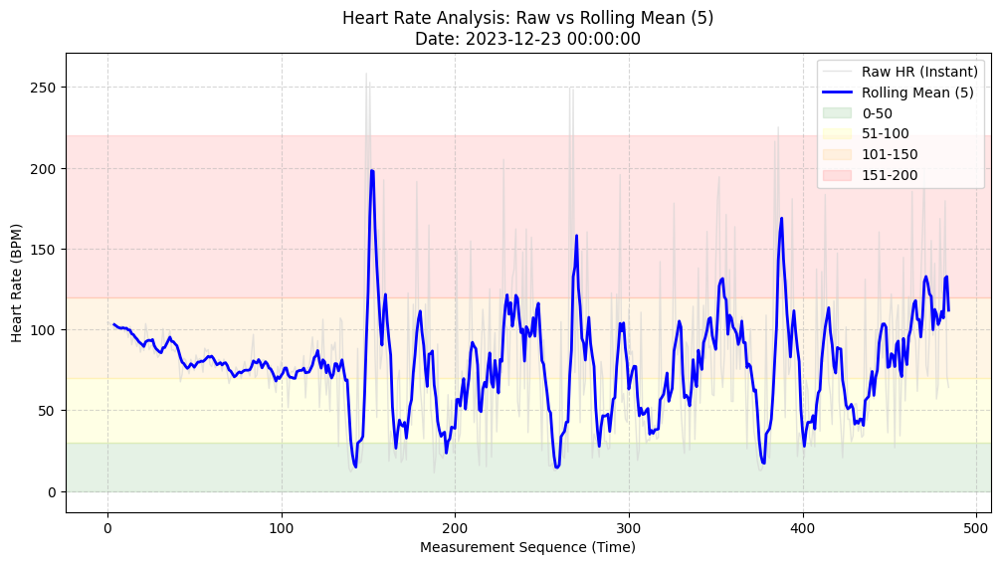


Graph plotted for Date: 2023-12-23 00:00:00
  diary_date                     scoring_result_id        stat_bed_time  \
0 2023-12-23  2b17f94c-3d15-4ce6-9ba0-b7e6b880580c  2024-04-11 23:02:00   
1 2023-12-24                                   NaN                  NaN   
2 2023-12-25                                   NaN                  NaN   
3 2023-12-26  1f7d3aba-302e-48a6-934b-d6d8f43aa99b  2024-04-11 23:34:00   
4 2023-12-27  6fb23859-b525-43ac-b979-2282532a6844  2024-04-12 01:02:00   

  stat_sleep_time  stat_time_to_sleep_minutes  stat_sleep_interruption_count  \
0        23:13:00                        11.0                           28.0   
1        00:55:00                         NaN                            NaN   
2             NaN                         NaN                            NaN   
3        23:45:00                        11.0                           18.0   
4        01:10:00                         8.0                            8.0   

   stat_sleep_interrupt

In [13]:
'''
# ---------------------------------------------------------
# NEW STEP: PROCESS HR METRICS
# ---------------------------------------------------------

def process_hr_bins(hr_str):
    """
    Parses HR string, calculates rolling mean (window=5),
    and counts values in specific bins.
    """
    # Initialize bins
    bins = {
        'hr_0_30': 0,
        'hr_31_70': 0,
        'hr_71_120': 0,
        'hr_121_220': 0,
        'hr_220_250': 0
    }

    # Return empty bins if data is missing or not a string
    if pd.isna(hr_str) or not isinstance(hr_str, str) or hr_str.strip() == '':
        return pd.Series(bins)

    try:
        # 1. Parse String to Floats
        values = [float(x) for x in hr_str.split('|') if x.strip()]

        if len(values) < 5:
            return pd.Series(bins) # Not enough data for rolling mean of 5

        # 2. Calculate Rolling Mean of previous 5
        # We use pandas Series to leverage the rolling function easily
        # min_periods=5 means we start getting values at the 5th index
        rolling_means = pd.Series(values).rolling(window=5).mean().dropna()

        # 3. Categorize into bins
        # We count how many rolling mean points fall into each category
        bins['hr_0_30'] = ((rolling_means >= 0) & (rolling_means <= 30)).sum()
        bins['hr_31_70'] = ((rolling_means > 30) & (rolling_means <= 70)).sum()
        bins['hr_71_120'] = ((rolling_means > 70) & (rolling_means <= 120)).sum()
        bins['hr_121_220'] = ((rolling_means > 120) & (rolling_means <= 220)).sum()
        bins['hr_220_250'] = ((rolling_means > 220) & (rolling_means <= 250)).sum()

        sum = bins['hr_0_30'] + bins['hr_31_70'] + bins['hr_71_120'] + bins['hr_121_220'] + bins['hr_220_250']
        bins['hr_0_30'] = (bins['hr_0_30'] / sum) * 100
        bins['hr_31_70'] = (bins['hr_31_70'] / sum) * 100
        bins['hr_71_120'] = (bins['hr_71_120'] / sum) * 100
        bins['hr_121_220'] = (bins['hr_121_220'] / sum) * 100
        bins['hr_220_250'] = (bins['hr_220_250'] / sum) * 100

        return pd.Series(bins)

    except Exception as e:
        # In case of malformed strings
        return pd.Series(bins)

print("Processing HR Metrics (Rolling Mean & Binning)...")

# Apply the function. This returns a DataFrame with the 5 new columns
hr_features = df_clean['hr_metrics'].apply(process_hr_bins)

# Join the new columns back to the main dataframe
df_processed = pd.concat([df_clean, hr_features], axis=1)
df_clean = df_processed
# Display result
cols_to_show = ['diary_date', 'is_attack', 'hr_0_30', 'hr_31_70', 'hr_71_120', 'hr_121_220', 'hr_220_250']
print(df_processed[cols_to_show].head(20))

# ---------------------------------------------------------
# VISUALIZATION (First Valid Row)
# ---------------------------------------------------------

# Find first row with valid HR data
valid_row_idx = df_clean['hr_metrics'].notna().idxmax()
hr_string = df_clean.loc[valid_row_idx, 'hr_metrics']
date_label = df_clean.loc[valid_row_idx, 'diary_date']

if isinstance(hr_string, str):
    # Parse for plotting
    raw_values = [float(x) for x in hr_string.split('|') if x.strip()]

    # Calculate Rolling Mean for plotting
    rolling_values = pd.Series(raw_values).rolling(window=5).mean()

    plt.figure(figsize=(12, 6))

    # Plot Raw Data (faint)
    plt.plot(raw_values, color='lightgray', label='Raw HR (Instant)', alpha=0.6, linewidth=1)

    # Plot Rolling Mean (strong)
    plt.plot(rolling_values, color='blue', label='Rolling Mean (5)', linewidth=2)

    # Add colored bands for the bins
    plt.axhspan(0, 30, color='green', alpha=0.1, label='0-50')
    plt.axhspan(30, 70, color='yellow', alpha=0.1, label='51-100')
    plt.axhspan(70, 120, color='orange', alpha=0.1, label='101-150')
    plt.axhspan(120, 220, color='red', alpha=0.1, label='151-200')

    plt.title(f"Heart Rate Analysis: Raw vs Rolling Mean (5)\nDate: {date_label}")
    plt.xlabel("Measurement Sequence (Time)")
    plt.ylabel("Heart Rate (BPM)")
    plt.legend(loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.5)

    plt.show()
    print(f"\nGraph plotted for Date: {date_label}")
else:
    print("No valid HR data found to plot.")

print(df_clean.head())

# Optional: Save
# df_processed.to_csv('SleepingBeauty_With_HR_Bins.csv', index=False)
'''

In [11]:
print(df_clean.columns)
print(final_df.columns)

Index(['diary_date', 'scoring_result_id', 'stat_bed_time', 'stat_sleep_time',
       'stat_time_to_sleep_minutes', 'stat_sleep_interruption_count',
       'stat_sleep_interruption_minutes', 'stat_out_of_bed_time',
       'stat_total_sleep_time_minutes', 'stat_bed_time_deviation_minutes',
       'subjective_sleep_interruption_count',
       'subjective_sleep_interruption_minutes', 'sleep_quality',
       'sleep_score_averaged', 'sleep_score', 'SE', 'TIB', 'TSP', 'WTSP',
       'WTSP_2', 'WASO', 'SOL_5', 'SOL_10', 'SOL_AASM', 'deep', 'deepPercent',
       'NOA', 'NOA_2', 'NREM', 'REM', 'WAFA', 'REM_FH', 'REM_SH', 'REMPercent',
       'NREMPercent', 'SOL_REM', 'SOL_DEEP', 'lightPercent', 'wake', 'light',
       'SME', 'NSS', 'LGHT_FH', 'LGHT_SH', 'DEEP_FH', 'DEEP_SH', 'FA',
       'workfree_day', 'workfree_day_tomorrow', 'bed_time', 'out_of_bed_time',
       'mode', 'subjective_SOL', 'WeekDay', 'WeekEnd', 'hr_metrics',
       'sleep_factors', 'is_attack', 'is_slept', 'hr_bin_30_60_pct',
 

In [12]:
# Find important features ( 24 Jan)
df = final_df.copy()
df = df.drop(columns=[0])
df = df.drop(columns=[1])
is_attack_bool = df["is_attack"].fillna(0).astype(bool)

df["attack_next_1d"] = is_attack_bool.shift(-1).fillna(False).astype(int)

df["attack_next_2d"] = (
    is_attack_bool.shift(-1).fillna(False) |
    is_attack_bool.shift(-2).fillna(False)
).astype(int)

df["attack_next_3d"] = (
    is_attack_bool.shift(-1).fillna(False) |
    is_attack_bool.shift(-2).fillna(False) |
    is_attack_bool.shift(-3).fillna(False)
).astype(int)
# exclude features :
exclude_cols = [
    "diary_date",
    "is_attack",
    "attack_next_1d",
    "attack_next_2d",
    "attack_next_3d",
    "hr_metrics",        # raw string
    "sleep_factors",     # text
    "scoring_result_id"
]

X = df.drop(columns=[c for c in exclude_cols if c in df.columns])
X = X.select_dtypes(include=["number"])


# approach 1 (correlation)
print("correlation")
y = df["attack_next_1d"]

corr_importance = (
    X.corrwith(y)
    .abs()
    .sort_values(ascending=False)
)

print(corr_importance.head(20))

# approach 2 ((non-linear screening))
print("(non-linear screening)")
from sklearn.feature_selection import mutual_info_classif
from sklearn.impute import SimpleImputer

X_imp = SimpleImputer(strategy="median").fit_transform(X)

mi = mutual_info_classif(X_imp, y, random_state=42)

mi_importance = (
    pd.Series(mi, index=X.columns)
    .sort_values(ascending=False)
)

print(mi_importance.head(20))

# random forest approach
print ("# random forest approach")
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("model", RandomForestClassifier(
        n_estimators=400,
        max_depth=6,
        class_weight="balanced",
        random_state=42
    ))
])

pipeline.fit(X, y)

rf = pipeline.named_steps["model"]

rf_importance = (
    pd.Series(rf.feature_importances_, index=X.columns)
    .sort_values(ascending=False)
)

print(rf_importance.head(20))

# Permutation based importance
print("# Permutation based importance")
from sklearn.inspection import permutation_importance

perm = permutation_importance(
    pipeline,
    X,
    y,
    n_repeats=10,
    random_state=42,
    scoring="roc_auc"
)

perm_importance = (
    pd.Series(perm.importances_mean, index=X.columns)
    .sort_values(ascending=False)
)

print(perm_importance.head(20))




/tmp/ipython-input-182/3560211289.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["attack_next_1d"] = is_attack_bool.shift(-1).fillna(False).astype(int)
/tmp/ipython-input-182/3560211289.py:10: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  is_attack_bool.shift(-1).fillna(False) |
/tmp/ipython-input-182/3560211289.py:11: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('futur

correlation
is_slept                           0.583534
DEEP_SH                            0.417789
SME                                0.351295
WTSP_2                             0.335590
stat_sleep_interruption_minutes    0.289449
stat_total_sleep_time_minutes      0.276700
WTSP                               0.261032
SE                                 0.230804
WASO                               0.220677
hr_max                             0.207695
hr_bin_120_180_pct                 0.178466
hr_min                             0.165451
wake                               0.163568
NOA_2                              0.152608
hr_mean                            0.142335
hr_std                             0.138328
stat_time_to_sleep_minutes         0.138188
stat_sleep_interruption_count      0.126461
LGHT_FH                            0.116652
SOL_DEEP                           0.114152
dtype: float64
(non-linear screening)
stat_total_sleep_time_minutes      0.138828
stat_time_to_sleep_minutes

In [13]:
# time lagged feature importance
print("time lagged feature importance")
lag_features = [
    "stat_total_sleep_time_minutes",
    "sleep_score",
    "SE",
    "REMPercent",
    "deepPercent",
    "NREMPercent",
    "lightPercent",
    "WASO",
    "NOA",
    "hr_mean",
    "hr_std",
    "stat_sleep_interruption_minutes", #    0.054974
    "stat_sleep_interruption_count", #      0.045934
    "hr_bin_30_60_pct",#                   0.031433
    "hr_bin_60_120_pct",
    "hr_bin_120_180_pct",
    "lightPercent", #                       0.030732
    "sleep_score_averaged", #               0.030328
]

for col in lag_features:
    for lag in [1, 2, 3]:
        df[f"{col}_lag{lag}"] = df[col].shift(lag)

X_lagged = df.filter(regex="lag|hr_|sleep_|stat_")
X_lagged = X_lagged.select_dtypes(include=["number"])

pipeline.fit(X_lagged, y)

rf_lag = pipeline.named_steps["model"]

lag_importance = (
    pd.Series(rf_lag.feature_importances_, index=X_lagged.columns)
    .sort_values(ascending=False)
)

print(lag_importance.head(25))



time lagged feature importance
stat_total_sleep_time_minutes         0.122565
stat_total_sleep_time_minutes_lag2    0.038992
lightPercent_lag2                     0.038963
stat_sleep_interruption_minutes       0.034644
stat_total_sleep_time_minutes_lag3    0.033660
stat_sleep_interruption_count         0.028440
REMPercent_lag2                       0.024825
hr_bin_30_60_pct                      0.024791
hr_mean                               0.024238
NREMPercent_lag2                      0.023195
stat_time_to_sleep_minutes            0.021234
stat_total_sleep_time_minutes_lag1    0.020925
deepPercent_lag2                      0.020348
hr_bin_30_60_pct_lag1                 0.020039
hr_bin_30_60_pct_lag2                 0.020037
hr_min                                0.019213
hr_bin_60_120_pct                     0.018026
hr_std                                0.017424
hr_bin_120_180_pct_lag2               0.016340
sleep_score                           0.016309
stat_bed_time_deviation_minut

In [14]:
print(df.columns)

Index(['diary_date', 'scoring_result_id', 'stat_bed_time', 'stat_sleep_time',
       'stat_time_to_sleep_minutes', 'stat_sleep_interruption_count',
       'stat_sleep_interruption_minutes', 'stat_out_of_bed_time',
       'stat_total_sleep_time_minutes', 'stat_bed_time_deviation_minutes',
       ...
       'hr_bin_30_60_pct_lag3', 'hr_bin_60_120_pct_lag1',
       'hr_bin_60_120_pct_lag2', 'hr_bin_60_120_pct_lag3',
       'hr_bin_120_180_pct_lag1', 'hr_bin_120_180_pct_lag2',
       'hr_bin_120_180_pct_lag3', 'sleep_score_averaged_lag1',
       'sleep_score_averaged_lag2', 'sleep_score_averaged_lag3'],
      dtype='object', length=121)


In [12]:
'''
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# 1. Setup the DataFrame (Assuming df_clean is your dataframe from previous steps)
# Make a copy to avoid SettingWithCopy warnings
df_analysis = final_df.copy()
pd.set_option('display.max_columns', None)
print(df_analysis.head(2))

# ==============================================================================
# STEP 1: CREATE THE PREDICTION TARGET (NEXT 2 DAYS)
# ==============================================================================
# We want to know if an attack will start in t+1 OR t+2
# shift(-1) looks at tomorrow, shift(-2) looks at day after tomorrow
attack_window = 2
df_analysis['attack_next_2_days'] = (
    (df_analysis['is_attack'].shift(-1) == 1) |
    (df_analysis['is_attack'].shift(-2) == 1)
).astype(int)

# Drop the last 2 rows because we don't know their future
df_analysis = df_analysis.iloc[:-attack_window]

# ==============================================================================
# STEP 2: PREPROCESS COLUMNS FOR MACHINE LEARNING
# ==============================================================================

# A. Drop columns that are Strings, IDs, or the Target itself (to prevent leakage)
cols_to_drop = [
    'diary_date', 'scoring_result_id', 'hr_metrics', 'sleep_factors',
    'stat_bed_time', 'stat_sleep_time', 'stat_wake_time', 'stat_out_of_bed_time',
    'bed_time', 'out_of_bed_time', 'is_attack' # Drop current attack status to predict FUTURE
]

# Drop columns only if they exist
df_model = df_analysis.drop(columns=[c for c in cols_to_drop if c in df_analysis.columns])

# B. Encode Categorical Data (WeekDay, mode, WeekEnd)
le = LabelEncoder()
categorical_cols = ['WeekDay', 'WeekEnd', 'mode', 'workfree_day', 'workfree_day_tomorrow']

for col in categorical_cols:
    if col in df_model.columns:
        df_model[col] = df_model[col].astype(str) # Ensure string for encoding
        df_model[col] = le.fit_transform(df_model[col])

# C. Handle Missing Values (Fill NaN with 0 for this analysis)
df_model = df_model.fillna(0)

# ==============================================================================
# STEP 3: TRAIN RANDOM FOREST TO FIND IMPORTANCE
# ==============================================================================

X = df_model.drop('attack_next_2_days', axis=1) # Features
y = df_model['attack_next_2_days']              # Target

# Train model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

# Extract Feature Importance
importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

# ==============================================================================
# STEP 4: VISUALIZATION & ANALYSIS
# ==============================================================================

# 1. Plot Top 15 Most Important Features
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importances.head(15), palette='viridis')
plt.title('Top 15 Parameters Predicting an Attack in Next 2 Days')
plt.xlabel('Importance Score')
plt.ylabel('Parameter')
plt.show()

# 2. Correlation Analysis (Direction of relationship)
# Let's look at the Top 5 features and see if they are positively or negatively correlated
top_5_features = importances['Feature'].head(5).tolist()
top_5_features.append('attack_next_2_days')

corr_matrix = df_model[top_5_features].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix[['attack_next_2_days']].sort_values(by='attack_next_2_days', ascending=False),
            annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation of Top Features with Future Attack')
plt.show()

# 3. Print Text Summary
print("--- PREDICTIVE ANALYSIS RESULTS ---")
print("Top 25 parameters that signal an upcoming attack:")
print(importances.head(25).to_string(index=False))
'''


'\nimport pandas as pd\nimport numpy as np\nimport seaborn as sns\nimport matplotlib.pyplot as plt\nfrom sklearn.ensemble import RandomForestClassifier\nfrom sklearn.model_selection import train_test_split\nfrom sklearn.preprocessing import LabelEncoder\n\n# 1. Setup the DataFrame (Assuming df_clean is your dataframe from previous steps)\n# Make a copy to avoid SettingWithCopy warnings\ndf_analysis = final_df.copy()\npd.set_option(\'display.max_columns\', None)\nprint(df_analysis.head(2))\n\n# ==============================================================================\n# STEP 1: CREATE THE PREDICTION TARGET (NEXT 2 DAYS)\n# ==============================================================================\n# We want to know if an attack will start in t+1 OR t+2\n# shift(-1) looks at tomorrow, shift(-2) looks at day after tomorrow\nattack_window = 2\ndf_analysis[\'attack_next_2_days\'] = (\n    (df_analysis[\'is_attack\'].shift(-1) == 1) | \n    (df_analysis[\'is_attack\'].shift(-2) == 1

In [63]:
'''
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

# 1. Setup the DataFrame (Using df_clean from previous steps)
df_analysis = final_df.copy()

# ==============================================================================
# STEP 1: CREATE 3 SEPARATE PREDICTION TARGETS
# ==============================================================================
# 1. Will an attack happen tomorrow?
df_analysis['attack_in_1_day'] = df_analysis['is_attack'].shift(-1).fillna(0).astype(int)

# 2. Will an attack happen in 48 hours?
df_analysis['attack_in_2_days'] = df_analysis['is_attack'].shift(-2).fillna(0).astype(int)

# 3. Will an attack happen in 72 hours?
df_analysis['attack_in_3_days'] = df_analysis['is_attack'].shift(-3).fillna(0).astype(int)

# Drop the last 3 rows as they don't have full future data
df_analysis = df_analysis.iloc[:-3]

# ==============================================================================
# STEP 2: PREPROCESS COLUMNS
# ==============================================================================

# A. Columns to remove (ID, raw strings, or dates)
# Note: We drop 'is_attack' (current status) from FEATURES so the model
# relies on precursors (HR, Sleep Quality), not just "I am sleeping now -> I sleep tomorrow"
cols_to_exclude = [
    'diary_date', 'scoring_result_id', 'hr_metrics', 'sleep_factors',
    'stat_bed_time', 'stat_sleep_time', 'stat_wake_time', 'stat_out_of_bed_time',
    'bed_time', 'out_of_bed_time', 'is_attack',
    'attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days' # Exclude targets from feature set
]

# B. Encode Categorical Data
le = LabelEncoder()
categorical_cols = ['WeekDay', 'WeekEnd', 'mode', 'workfree_day', 'workfree_day_tomorrow']

for col in categorical_cols:
    if col in df_analysis.columns:
        df_analysis[col] = df_analysis[col].astype(str)
        df_analysis[col] = le.fit_transform(df_analysis[col])

# C. Fill remaining NaNs with 0
df_analysis = df_analysis.fillna(0)

# Define X (Features) - All columns except the excluded ones
feature_cols = [c for c in df_analysis.columns if c not in cols_to_exclude]
X = df_analysis[feature_cols]

# ==============================================================================
# STEP 3: ANALYZE EACH TIME HORIZON
# ==============================================================================

horizons = {
    "1_Day": df_analysis['attack_in_1_day'],
    "2_Days": df_analysis['attack_in_2_days'],
    "3_Days": df_analysis['attack_in_3_days']
}

results = pd.DataFrame()

plt.figure(figsize=(15, 6))

for i, (horizon_name, y_target) in enumerate(horizons.items()):

    # Train Model
    rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    rf.fit(X, y_target)

    # Get Importances
    imps = pd.DataFrame({
        'Feature': X.columns,
        'Importance': rf.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    # Save top features to list for printing later
    print(f"\n--- Top 5 Predictors for Attack in {horizon_name} ---")
    print(imps.head(5).to_string(index=False))

    # Plotting (Subplots)
    plt.subplot(1, 3, i+1)
    sns.barplot(x='Importance', y='Feature', data=imps.head(10), palette='viridis')
    plt.title(f'Warning Signs: {horizon_name} Ahead')
    plt.xlabel('Importance')
    plt.ylabel('')

plt.tight_layout()
plt.show()

# ==============================================================================
# STEP 4: DETAILED CORRELATION FOR "2 DAYS" (Requested previously)
# ==============================================================================
# Let's see specifically *how* the top features affect the 2-day prediction
target_2_days = df_analysis['attack_in_1_day']
rf_2 = RandomForestClassifier(n_estimators=100, random_state=42)
rf_2.fit(X, target_2_days)

top_feats_2_days = pd.Series(rf_2.feature_importances_, index=X.columns).nlargest(20).index.tolist()

print("\n" + "="*50)
print(f"CORRELATION DIRECTION (Next 2 Days)")
print("If Correlation is POSITIVE, high values increase attack risk.")
print("If Correlation is NEGATIVE, high values prevent attack.")
print("="*50)

for feat in top_feats_2_days:
    corr = df_analysis[feat].corr(df_analysis['attack_in_2_days'])
    direction = "RISK INCREASES" if corr > 0 else "RISK DECREASES"
    #print(f"{feat:<30} : {corr:.4f} ({direction})")
    print(f"{feat:<30}")

'''

/tmp/ipython-input-2640300143.py:50: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_analysis = df_analysis.fillna(0)


TypeError: Feature names are only supported if all input features have string names, but your input has ['int', 'str'] as feature name / column name types. If you want feature names to be stored and validated, you must convert them all to strings, by using X.columns = X.columns.astype(str) for example. Otherwise you can remove feature / column names from your input data, or convert them all to a non-string data type.

<Figure size 1500x600 with 0 Axes>

Here is the explanation of each feature grouped by its biological function.

1. Sleep Duration & Consistency
These metrics measure how much you slept and how consistent that schedule is.
stat_total_sleep_time_minutes: The raw amount of time actually spent asleep (excluding time awake in bed) for the current record.
stat_total_sleep_time_minutes_3d_std: Measures how irregular your sleep duration has been over the last 3 days. A high number means you are sleeping erratic hours (e.g., 5 hours one night, 9 the next).
sleep_debt_3d: The cumulative amount of "missed" sleep over the last 3 days compared to a baseline need (usually 7-8 hours). High sleep debt impairs cognitive function and immunity.
stat_time_to_sleep_minutes (Sleep Latency): How long it took to fall asleep after getting into bed. High values indicate insomnia or stress.
stat_bed_time_deviation_minutes_lag1: How much yesterday's bedtime differed from your average bedtime. This measures Circadian Rhythm disruption.

2. Heart Rate (Physiology)
Heart rate (HR) during sleep dips (the "non-dipper" effect is a risk factor). These features likely bin HR into ranges (BPM).
hr_31_70: The amount of time (or percentage) heart rate was between 31 and 70 BPM. This is the target zone for healthy, restorative sleep.
hr_31_70_lag1: The value of the above metric from yesterday.
hr_0_30_7d_avg: Average time spent with a very low HR (0-30 BPM) over the last week. Note: 0-30 is physiologically very low; in sensor data, this often represents deep athletic bradycardia or sensor gaps/noise.
hr_0_30_3d_std: Variability in this low HR range over 3 days.
hr_71_120_3d_std: Variability in elevated HR (71-120 BPM) over 3 days. Spikes here usually indicate nightmares, sleep apnea events, alcohol consumption, or acute stress.

3. Sleep Architecture (Stages)
Sleep is composed of cycles (Light, Deep, REM). The balance is crucial for recovery.
REMPercent_7d_avg: The average percentage of sleep spent in REM (Rapid Eye Movement) over the last week. REM is critical for mental restoration, memory consolidation, and emotional regulation.
REMPercent_3d_std: Variability in REM sleep. Wild fluctuations in REM can indicate stress, medication effects, or "REM rebound" (catching up after deprivation).
deepPercent_7d_avg: Average percentage of Deep (Slow Wave) sleep. Deep sleep is critical for physical repair, muscle growth, and immune system cleansing.

4. Sleep Quality & Fragmentation
These measure how "broken" the sleep was.
SE_7d_avg (Sleep Efficiency): (Time Asleep / Time in Bed) * 100. A healthy score is >85%. This is the weekly average.
SE_3d_std: How unstable your efficiency is.
NOA_7d_avg (Number of Awakenings): The average number of times you woke up per night over the last week. High NOA indicates Sleep Fragmentation.
NOA_3d_std: The variability in how many times you wake up.

5. Composite Scores
sleep_score_7d_avg: An aggregated metric (likely 0-100) combining duration, depth, and restoration.
sleep_score_delta: The change in sleep score compared to a previous baseline (e.g., Today's Score - Yesterday's Score). Positive means improvement; negative means deterioration.
sleep_quality_3d_std: How much the subjective or calculated quality varies.

6. Target Variables (Prediction)
These are not features of sleep itself, but the outcome the model is likely trying to predict using the sleep data.

is_attack: Did a specific health event (Migraine, Epileptic Seizure, Panic Attack, etc.) happen today?
attack_in_1_day: Will an attack happen tomorrow?
attack_in_2_days: Will an attack happen in 2 days?
attack_in_3_days: Will an attack happen in 3 days?

In [15]:
#Take only these 20 features for analyses
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

# 1. Setup the DataFrame (Using df_clean from previous steps)
df_model = df #final_df.copy()

# ==============================================================================
# STEP 1: CREATE TARGETS (NEXT 1, 2, 3 DAYS)
# ==============================================================================
# 1. Will an attack happen tomorrow?
df_model['attack_in_1_day'] = df_model['is_attack'].shift(-1).fillna(0).astype(int)

# 2. Will an attack happen in 48 hours?
df_model['attack_in_2_days'] = df_model['is_attack'].shift(-2).fillna(0).astype(int)

# 3. Will an attack happen in 72 hours?
df_model['attack_in_3_days'] = df_model['is_attack'].shift(-3).fillna(0).astype(int)

# Drop the last 3 rows (future data unknown)
df_model = df_model.iloc[:-10]

# ==============================================================================
# STEP 2: SELECT ONLY THE REQUESTED FEATURES
# ==============================================================================
'''
selected_features = [
    'WeekDay', 'stat_total_sleep_time_minutes', 'REMPercent',
    'stat_time_to_sleep_minutes', 'deepPercent', 'hr_0_30',
    'DEEP_FH', 'hr_31_70', 'SE', 'subjective_SOL',
    'sleep_quality', 'stat_bed_time_deviation_minutes',
    'sleep_score_averaged', 'hr_71_120', 'deep',
    'NREMPercent', 'sleep_score', 'SOL_AASM', 'SOL_10', 'NOA',
    'is_attack', 'attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days'
]

selected_features = [
  'sleep_debt_3d',
  'stat_total_sleep_time_minutes_3d_std',
  'hr_31_70_lag1',
  'REMPercent_7d_avg',
  'REMPercent_3d_std',
  'sleep_score_7d_avg',
  'hr_0_30_3d_std',
  'SE_7d_avg',
  'SE_3d_std',
  'hr_31_70',
  'sleep_quality_3d_std',
  'deepPercent_7d_avg',
  'hr_71_120_3d_std',
  'hr_0_30_7d_avg',
  'stat_bed_time_deviation_minutes_lag1',
  'NOA_3d_std',
  'NOA_7d_avg',
  'stat_total_sleep_time_minutes',
  'sleep_score_delta',
  'stat_time_to_sleep_minutes',
  'is_attack', 'attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days'
]
'''
# random forest
selected_features = [
'WeekDay',
'stat_total_sleep_time_minutes',#      0.165366
'is_slept',#                           0.153635
'stat_sleep_interruption_minutes',#    0.054974
'stat_sleep_interruption_count',#      0.045934
'hr_bin_30_60_pct',#                   0.031433
'lightPercent',#                       0.030732
'sleep_score_averaged',#               0.030328
'SE',#                                 0.026709
'stat_time_to_sleep_minutes',#         0.026018
'hr_std',#                             0.023132
'hr_mean',#                            0.022520
'wake',#                               0.020676
'stat_bed_time_deviation_minutes',#    0.019903
'sleep_score',#                        0.019481
'SOL_10',#                             0.019294
'hr_bin_120_180_pct',#                 0.019200
'SME',#                                0.016254
'hr_max',#                             0.015467
'sleep_quality',#                      0.014112
'hr_bin_60_120_pct',#                  0.014081
#'WeekEnd',
'is_attack', 'attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days'
]

# lag importance
'''
selected_features = [
'WeekDay',
'stat_total_sleep_time_minutes', #           0.148653
'stat_total_sleep_time_minutes_lag2',  #     0.052399
'stat_sleep_interruption_minutes',    #      0.040507
'stat_total_sleep_time_minutes_lag3',  #     0.039923
'stat_sleep_interruption_count',      #      0.036872
'REMPercent_lag2',                    #      0.033873
'stat_total_sleep_time_minutes_lag1',  #     0.033535
'WASO_lag2',                           #     0.029256
'hr_mean',                                  #0.025524
'hr_mean_lag1',                             #0.025417
'hr_std',                                   #0.024618
'deepPercent_lag2',                         #0.024376
'sleep_score_averaged',                     #0.024321
'hr_bin_120_180_pct',                       #0.023813
'stat_time_to_sleep_minutes',               #0.023704
'hr_bin_30_60_pct',                         #0.023542
'hr_min',                                   #0.023497
'hr_mean_lag3',                             #0.022737
'deepPercent_lag1',                         #0.022520
'hr_bin_60_120_pct',                        #0.022457
'NOA_lag2',                                 #0.021664
'stat_bed_time_deviation_minutes',          #0.019083
'sleep_quality',                            #0.017446
'sleep_score',                              #0.017368
'hr_mean_lag2',                             #0.017095
'SE_lag2',                                  #0.016149
'hr_std_lag2',                              #0.015653
'SE_lag1',                                  #0.015370
'REMPercent_lag1',                          #0.014382
'WASO_lag1',                                #0.013915
'hr_max',                                   #0.012493
'sleep_score_lag3',                         #0.012434
'deepPercent_lag3',                         #0.012393
'hr_std_lag1',                              #0.012152
'REMPercent_lag3',                          #0.010537
'sleep_score_lag2',                         #0.010175
'NOA_lag1',                                 #0.009241
'hr_std_lag3',                              #0.008755
'SE_lag3',                                  #0.008674
'WASO_lag3',                                #0.008462
'NOA_lag3',                                 #0.007724
'sleep_score_lag1',                         #0.007081
'subjective_sleep_interruption_minutes',    #0.004824
'hr_bin_180_220_pct',                       #0.003471
'subjective_sleep_interruption_count',      #0.001915
'is_attack', 'attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days'
]
'''
selected_features = [
'WeekDay',
'stat_total_sleep_time_minutes',#         0.122565
'stat_total_sleep_time_minutes_lag2',#    0.038992
'lightPercent_lag2',#                     0.038963
'stat_sleep_interruption_minutes',#       0.034644
'stat_total_sleep_time_minutes_lag3',#    0.033660
'stat_sleep_interruption_count',#         0.028440
'REMPercent_lag2',#                       0.024825
'hr_bin_30_60_pct',#                      0.024791
'hr_mean',#                               0.024238
'NREMPercent_lag2',#                      0.023195
'stat_time_to_sleep_minutes',#            0.021234
'stat_total_sleep_time_minutes_lag1',#    0.020925
'deepPercent_lag2',#                      0.020348
'hr_bin_30_60_pct_lag1',#                 0.020039
'hr_bin_30_60_pct_lag2',#                 0.020037
'hr_min',#                                0.019213
'hr_bin_60_120_pct',#                     0.018026
'hr_std',#                                0.017424
'hr_bin_120_180_pct_lag2',#               0.016340
'sleep_score',#                           0.016309
'stat_bed_time_deviation_minutes',#       0.016164
'sleep_score_averaged',#                  0.015966
'is_attack', 'attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days'
]

selected_features = [
'WeekDay',
'stat_total_sleep_time_minutes',#         0.122565
'lightPercent',#                     0.038963
'stat_sleep_interruption_minutes',#       0.034644
'stat_sleep_interruption_count',#    0.03
'REMPercent',
'hr_bin_30_60_pct', 'hr_mean', 'NREMPercent', 'deepPercent', 'hr_bin_60_120_pct', 'hr_bin_120_180_pct',
'hr_std', 'hr_min', 'sleep_score', 'sleep_score_averaged', 'stat_bed_time_deviation_minutes',
'is_attack', 'attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days',


'stat_total_sleep_time_minutes_lag1',
'stat_total_sleep_time_minutes_lag2',
'stat_total_sleep_time_minutes_lag3',
'lightPercent_lag1',
'lightPercent_lag2',
'REMPercent_lag1',
'REMPercent_lag2',
'NREMPercent_lag1',
'NREMPercent_lag2',
'hr_bin_30_60_pct_lag1',
'hr_bin_30_60_pct_lag2',
'hr_bin_120_180_pct_lag1',
'hr_bin_120_180_pct_lag2',
'hr_mean_lag1',
'hr_mean_lag2',
'NOA_lag1',
'NOA_lag2',


]
print(df_model.columns)

# Ensure features exist in dataframe (handle potential missing columns gracefully)
existing_features = [col for col in selected_features if col in df_model.columns]
df_required = df_model[existing_features].copy()

# Encode 'WeekDay' if it is categorical/string
if 'WeekDay' in X.columns and X['WeekDay'].dtype == 'object':
    le = LabelEncoder()
    df_required['WeekDay'] = le.fit_transform(df_required['WeekDay'].astype(str))

# Fill NaNs with 0
df_required = df_required.fillna(0)

print(df_required.head())
print(df_required.columns)
df_required = df_required.iloc[:-2]
#





Index(['diary_date', 'scoring_result_id', 'stat_bed_time', 'stat_sleep_time',
       'stat_time_to_sleep_minutes', 'stat_sleep_interruption_count',
       'stat_sleep_interruption_minutes', 'stat_out_of_bed_time',
       'stat_total_sleep_time_minutes', 'stat_bed_time_deviation_minutes',
       ...
       'hr_bin_60_120_pct_lag3', 'hr_bin_120_180_pct_lag1',
       'hr_bin_120_180_pct_lag2', 'hr_bin_120_180_pct_lag3',
       'sleep_score_averaged_lag1', 'sleep_score_averaged_lag2',
       'sleep_score_averaged_lag3', 'attack_in_1_day', 'attack_in_2_days',
       'attack_in_3_days'],
      dtype='object', length=124)
     WeekDay  stat_total_sleep_time_minutes  lightPercent  \
0   Saturday                          522.0        74.928   
1     Sunday                         1015.0         0.000   
2     Monday                            0.0         0.000   
3    Tuesday                          402.0        75.652   
4  Wednesday                          327.0        76.183   

   stat_sl

In [16]:
print(df_required.head(5))

     WeekDay  stat_total_sleep_time_minutes  lightPercent  \
0   Saturday                          522.0        74.928   
1     Sunday                         1015.0         0.000   
2     Monday                            0.0         0.000   
3    Tuesday                          402.0        75.652   
4  Wednesday                          327.0        76.183   

   stat_sleep_interruption_minutes  stat_sleep_interruption_count  REMPercent  \
0                             48.0                           28.0      16.364   
1                              0.0                            0.0       0.000   
2                              0.0                            0.0       0.000   
3                             16.0                           18.0      14.286   
4                              6.0                            8.0      14.962   

   hr_bin_30_60_pct    hr_mean  NREMPercent  deepPercent  ...  \
0         18.118467  78.575676       83.636        8.708  ...   
1          0.000

# **Some basic model apprach**

Metric	Formula

Precision	TP / (TP + FP)

Recall / Sensitivity	TP / (TP + FN)

F1-score	2 · (Precision · Recall) / (Precision + Recall)

In [17]:
import pandas as pd
import numpy as np

from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, classification_report
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    average_precision_score,
    precision_recall_curve
)


In [20]:
FEATURES = [
'WeekDay',
'stat_total_sleep_time_minutes',#      0.165366
'is_slept',#                           0.153635
'stat_sleep_interruption_minutes',#    0.054974
'stat_sleep_interruption_count',#      0.045934
'hr_bin_30_60_pct',#                   0.031433
'lightPercent',#                       0.030732
'sleep_score_averaged',#               0.030328
'SE',#                                 0.026709
'stat_time_to_sleep_minutes',#         0.026018
'hr_std',#                             0.023132
'hr_mean',#                            0.022520
'wake',#                               0.020676
'stat_bed_time_deviation_minutes',#    0.019903
'sleep_score',#                        0.019481
'SOL_10',#                             0.019294
'hr_bin_120_180_pct',#                 0.019200
'SME',#                                0.016254
'hr_max',#                             0.015467
'sleep_quality',#                      0.014112
'hr_bin_60_120_pct',#                  0.014081
#'WeekEnd',
#'is_attack', 'attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days'


]

FEATURES = [
'WeekDay',
'stat_total_sleep_time_minutes',#         0.122565
'lightPercent',#                     0.038963
'stat_sleep_interruption_minutes',#       0.034644
'stat_sleep_interruption_count',#    0.03
'REMPercent',
'hr_bin_30_60_pct', 'hr_mean', 'NREMPercent', 'deepPercent', 'hr_bin_60_120_pct', 'hr_bin_120_180_pct',
'hr_std', 'hr_min', 'sleep_score', 'sleep_score_averaged', 'stat_bed_time_deviation_minutes',
#'is_attack', 'attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days'
'stat_total_sleep_time_minutes_lag1',
'stat_total_sleep_time_minutes_lag2',
'stat_total_sleep_time_minutes_lag3',
'lightPercent_lag1',
'lightPercent_lag2',
'REMPercent_lag1',
'REMPercent_lag2',
'NREMPercent_lag1',
'NREMPercent_lag2',
'hr_bin_30_60_pct_lag1',
'hr_bin_30_60_pct_lag2',
'hr_bin_120_180_pct_lag1',
'hr_bin_120_180_pct_lag2',
'hr_mean_lag1',
'hr_mean_lag2',
'NOA_lag1',
'NOA_lag2',
]


TARGET = 'attack_in_1_day'

tscv = TimeSeriesSplit(n_splits=10)
#print(tscv)

print(df_required['WeekDay'])
day_mapping = {
    'Monday': 1, 'Tuesday': 2, 'Wednesday': 3, 'Thursday': 4,
    'Friday': 5, 'Saturday': 6, 'Sunday': 7
}

df_required['WeekDay'] = df_required['WeekDay'].map(day_mapping)


X = df_required[FEATURES].astype(int)
y = df_required[TARGET].astype(int)
X_orig = X
y_orig = y
X_new = X[:-5]
y_new = y[:-5]

print(X_new.shape)
print(y_new.shape)
X_train = X_new[:int(0.8 * len(X_new))]
y_train = y_new[:int(0.8 * len(y_new))]

X_test = X_new[int(0.8 * len(X_new)):]
y_test = y_new[int(0.8 * len(y_new)):]


0       Saturday
1         Sunday
2         Monday
3        Tuesday
4      Wednesday
         ...    
121    Wednesday
122     Thursday
123       Friday
124     Saturday
125       Sunday
Name: WeekDay, Length: 125, dtype: object
(120, 34)
(120,)


In [21]:
tscv = TimeSeriesSplit(n_splits=5)


#  Models to run

In [22]:
# Base line - Logistic regression
from sklearn.linear_model import LogisticRegression

logreg = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LogisticRegression(
        class_weight='balanced',
        max_iter=1000
    ))
])


rows = []
X =  X_new
y = y_new



for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):

    print(f"\nFold {fold + 1}")
    print(train_idx)
    print(test_idx)
    logreg.fit(X.iloc[train_idx], y.iloc[train_idx])

    preds = logreg.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = (preds >= 0.5).astype(int)
    y_true = y.iloc[test_idx].to_numpy()

    # ---- Confusion Matrix ----
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # ---- Metrics ----
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)      # Sensitivity
    f1 = f1_score(y_true, y_pred, zero_division=0)
    pr_auc = average_precision_score(y_true, y_pred)

    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    auc = roc_auc_score(y_true, preds)
    print("PredVal:",y_pred.flatten())
    print("TrueVal:", y.iloc[test_idx].to_numpy().flatten())
    # ---- Print ----
    print("Confusion Matrix:")
    print(cm)

    print(f"Accuracy    : {accuracy:.3f}")
    print(f"Precision   : {precision:.3f}")
    print(f"Recall      : {recall:.3f}  (Sensitivity)")
    print(f"Specificity : {specificity:.3f}")
    print(f"F1-score    : {f1:.3f}")
    print(f"AUC         : {auc:.3f}")
    print(f"PR AUC      : {pr_auc:.3f}")
    print(classification_report(y_true, y_pred))

    rows.append({"Acc": accuracy, "Precision": precision, "Recall": recall,
                   "F1-score":f1, "ROC-AUC":auc,  "Confusion Matrix:":cm})


df_LR = pd.DataFrame(rows)
print(df_LR.head())


coef = logreg.named_steps['model'].coef_[0]

coef_df = pd.DataFrame({
    'feature': X_train.columns,
    'coefficient': coef,
    'abs_coefficient': np.abs(coef)
}).sort_values('abs_coefficient', ascending=False)

print(coef_df)
'''
✅ Pros

Very interpretable

Fast

Stable with small datasets

❌ Cons

Assumes linear relationship

Cannot model complex interactions

Underfits non-linear sleep–HR dynamics
'''


Fold 1
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
[20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]
PredVal: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
Confusion Matrix:
[[16  1]
 [ 3  0]]
Accuracy    : 0.800
Precision   : 0.000
Recall      : 0.000  (Sensitivity)
Specificity : 0.941
F1-score    : 0.000
AUC         : 0.529
PR AUC      : 0.150
              precision    recall  f1-score   support

           0       0.84      0.94      0.89        17
           1       0.00      0.00      0.00         3

    accuracy                           0.80        20
   macro avg       0.42      0.47      0.44        20
weighted avg       0.72      0.80      0.76        20


Fold 2
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]
[40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59]
PredVal: [1 0 0 0 0 0 1 1 1 1 0 0 0 0 1 1 0 0 0 0]
Tru

'\n✅ Pros\n\nVery interpretable\n\nFast\n\nStable with small datasets\n\n❌ Cons\n\nAssumes linear relationship\n\nCannot model complex interactions\n\nUnderfits non-linear sleep–HR dynamics\n'

In [23]:
# Tree-Based Model — Decision Tree
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(
    max_depth=8,
    class_weight='balanced',
    random_state=42
)
#tscv = TimeSeriesSplit(n_splits=5)
rows = []
X =  X_new
y = y_new



for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):

    print(f"\nFold {fold + 1}")

    tree.fit(X.iloc[train_idx], y.iloc[train_idx])

    preds = tree.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = (preds >= 0.5).astype(int)
    y_true = y.iloc[test_idx].to_numpy()

    # ---- Confusion Matrix ----
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # ---- Metrics ----
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)      # Sensitivity
    f1 = f1_score(y_true, y_pred, zero_division=0)
    pr_auc = average_precision_score(y_true, y_pred)

    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    auc = roc_auc_score(y_true, preds)
    print("PredVal:",y_pred.flatten())
    print("TrueVal:", y.iloc[test_idx].to_numpy().flatten())
    # ---- Print ----
    print("Confusion Matrix:")
    print(cm)

    print(f"Accuracy    : {accuracy:.3f}")
    print(f"Precision   : {precision:.3f}")
    print(f"Recall      : {recall:.3f}  (Sensitivity)")
    print(f"Specificity : {specificity:.3f}")
    print(f"F1-score    : {f1:.3f}")
    print(f"AUC         : {auc:.3f}")
    print(f"PR AUC      : {pr_auc:.3f}")
    print(classification_report(y_true, y_pred))

    rows.append({"Acc": accuracy, "Precision": precision, "Recall": recall,
                   "F1-score":f1, "ROC-AUC":auc,  "Confusion Matrix:":cm})


df_DT = pd.DataFrame(rows)
print(df_DT.head())


imp_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': tree.feature_importances_
}).sort_values('importance', ascending=False)

print(imp_df)


'''
✅ Pros
Captures non-linear thresholds

Easy to explain rules (e.g., sleep debt > X)

❌ Cons

Overfits easily

Unstable with small changes in data
'''


Fold 1
PredVal: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
Confusion Matrix:
[[16  1]
 [ 3  0]]
Accuracy    : 0.800
Precision   : 0.000
Recall      : 0.000  (Sensitivity)
Specificity : 0.941
F1-score    : 0.000
AUC         : 0.471
PR AUC      : 0.150
              precision    recall  f1-score   support

           0       0.84      0.94      0.89        17
           1       0.00      0.00      0.00         3

    accuracy                           0.80        20
   macro avg       0.42      0.47      0.44        20
weighted avg       0.72      0.80      0.76        20


Fold 2
PredVal: [1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0]
TrueVal: [1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0]
Confusion Matrix:
[[15  2]
 [ 0  3]]
Accuracy    : 0.900
Precision   : 0.600
Recall      : 1.000  (Sensitivity)
Specificity : 0.882
F1-score    : 0.750
AUC         : 0.941
PR AUC      : 0.600
              precision    recall  f1-score   support

           0  

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


'\n✅ Pros\nCaptures non-linear thresholds\n\nEasy to explain rules (e.g., sleep debt > X)\n\n❌ Cons\n\nOverfits easily\n\nUnstable with small changes in data\n'

In [24]:
# Ensemble Model — Random Forest
from sklearn.ensemble import RandomForestClassifier
#tscv = TimeSeriesSplit(n_splits=5)

rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=8,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1,
)
rows = []
X =  X_new
y = y_new


for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):

    print(f"\nFold {fold + 1}")

    rf.fit(X.iloc[train_idx], y.iloc[train_idx])

    preds = rf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = (preds >= 0.5).astype(int)
    y_true = y.iloc[test_idx].to_numpy()

    # ---- Confusion Matrix ----
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # ---- Metrics ----
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)      # Sensitivity
    f1 = f1_score(y_true, y_pred, zero_division=0)
    pr_auc = average_precision_score(y_true, y_pred)

    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    auc = roc_auc_score(y_true, preds)
    print("PredVal:",y_pred.flatten())
    print("TrueVal:", y.iloc[test_idx].to_numpy().flatten())
    # ---- Print ----
    print("Confusion Matrix:")
    print(cm)

    print(f"Accuracy    : {accuracy:.3f}")
    print(f"Precision   : {precision:.3f}")
    print(f"Recall      : {recall:.3f}  (Sensitivity)")
    print(f"Specificity : {specificity:.3f}")
    print(f"F1-score    : {f1:.3f}")
    print(f"AUC         : {auc:.3f}")
    print(f"PR AUC      : {pr_auc:.3f}")
    print(classification_report(y_true, y_pred))

    rows.append({"Acc": accuracy, "Precision": precision, "Recall": recall,
                   "F1-score":f1, "ROC-AUC":auc,  "Confusion Matrix:":cm})

df_RF = pd.DataFrame(rows)
print(df_RF.head())


imp_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': rf.feature_importances_
}).sort_values('importance', ascending=False)

print(imp_df)

'''
✅ Pros

Usually best performance

Handles interactions automatically

Robust to correlated features

❌ Cons

More hyperparameters

Less transparent (needs SHAP)
'''


Fold 1
PredVal: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
Confusion Matrix:
[[17  0]
 [ 3  0]]
Accuracy    : 0.850
Precision   : 0.000
Recall      : 0.000  (Sensitivity)
Specificity : 1.000
F1-score    : 0.000
AUC         : 0.461
PR AUC      : 0.150
              precision    recall  f1-score   support

           0       0.85      1.00      0.92        17
           1       0.00      0.00      0.00         3

    accuracy                           0.85        20
   macro avg       0.42      0.50      0.46        20
weighted avg       0.72      0.85      0.78        20


Fold 2


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


PredVal: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0]
Confusion Matrix:
[[17  0]
 [ 2  1]]
Accuracy    : 0.900
Precision   : 1.000
Recall      : 0.333  (Sensitivity)
Specificity : 1.000
F1-score    : 0.500
AUC         : 0.922
PR AUC      : 0.433
              precision    recall  f1-score   support

           0       0.89      1.00      0.94        17
           1       1.00      0.33      0.50         3

    accuracy                           0.90        20
   macro avg       0.95      0.67      0.72        20
weighted avg       0.91      0.90      0.88        20


Fold 3
PredVal: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0]
Confusion Matrix:
[[17  0]
 [ 3  0]]
Accuracy    : 0.850
Precision   : 0.000
Recall      : 0.000  (Sensitivity)
Specificity : 1.000
F1-score    : 0.000
AUC         : 0.804
PR AUC      : 0.150
              precision    recall  f1-score   support

           0       0.8

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


PredVal: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0]
Confusion Matrix:
[[17  0]
 [ 2  1]]
Accuracy    : 0.900
Precision   : 1.000
Recall      : 0.333  (Sensitivity)
Specificity : 1.000
F1-score    : 0.500
AUC         : 1.000
PR AUC      : 0.433
              precision    recall  f1-score   support

           0       0.89      1.00      0.94        17
           1       1.00      0.33      0.50         3

    accuracy                           0.90        20
   macro avg       0.95      0.67      0.72        20
weighted avg       0.91      0.90      0.88        20


Fold 5
PredVal: [0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0]
TrueVal: [0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0]
Confusion Matrix:
[[16  0]
 [ 0  4]]
Accuracy    : 1.000
Precision   : 1.000
Recall      : 1.000  (Sensitivity)
Specificity : 1.000
F1-score    : 1.000
AUC         : 1.000
PR AUC      : 1.000
              precision    recall  f1-score   support

           0       1.0

'\n✅ Pros\n\nUsually best performance\n\nHandles interactions automatically\n\nRobust to correlated features\n\n❌ Cons\n\nMore hyperparameters\n\nLess transparent (needs SHAP)\n'

In [25]:
!pip install pygam

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.6/84.6 kB 1.8 MB/s eta 0:00:00


In [26]:
from pygam import LogisticGAM, s

gam = LogisticGAM(
    s(0, n_splines=10) +   # hr_mean
    s(1, n_splines=10) +   # sleep_score
    s(2, n_splines=6)  +   # hr_mean_lag1
    s(3, n_splines=6)  +   # hr_mean_lag2
    s(4, n_splines=6)      # REM_percent
)


from sklearn.metrics import (
    confusion_matrix, accuracy_score, precision_score,
    recall_score, f1_score, roc_auc_score,
    average_precision_score, classification_report
)

rows = []
X = X_new
y = y_new

for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):

    print(f"\nFold {fold + 1}")

    X_train = X.iloc[train_idx].values
    X_test  = X.iloc[test_idx].values
    y_train = y.iloc[train_idx].values
    y_test  = y.iloc[test_idx].values

    # ---- Fit GAM ----
    gam.fit(X_train, y_train)

    # ---- Predictions ----
    preds = gam.predict_proba(X_test)
    y_pred = (preds >= 0.5).astype(int)

    # ---- Confusion Matrix ----
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # ---- Metrics ----
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    f1 = f1_score(y_test, y_pred, zero_division=0)
    pr_auc = average_precision_score(y_test, preds)

    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    auc = roc_auc_score(y_test, preds)

    print("PredVal:", y_pred.flatten())
    print("TrueVal:", y_test.flatten())

    print("Confusion Matrix:")
    print(cm)

    print(f"Accuracy    : {accuracy:.3f}")
    print(f"Precision   : {precision:.3f}")
    print(f"Recall      : {recall:.3f}  (Sensitivity)")
    print(f"Specificity : {specificity:.3f}")
    print(f"F1-score    : {f1:.3f}")
    print(f"AUC         : {auc:.3f}")
    print(f"PR AUC      : {pr_auc:.3f}")

    print(classification_report(y_test, y_pred))

    rows.append({
        "Acc": accuracy,
        "Precision": precision,
        "Recall": recall,
        "Specificity": specificity,
        "F1-score": f1,
        "ROC-AUC": auc,
        "PR-AUC": pr_auc
    })

df_GAM = pd.DataFrame(rows)
print(df_GAM.head())


'''
df_RF = pd.DataFrame(rows)
print(df_RF.head())
gam.fit(X, y)

gam = LogisticGAM().gridsearch(X, y)

y_prob = gam.predict_proba(X)
y_pred = gam.predict(X)
'''
gam.summary()


Fold 1
PredVal: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
Confusion Matrix:
[[17  0]
 [ 3  0]]
Accuracy    : 0.850
Precision   : 0.000
Recall      : 0.000  (Sensitivity)
Specificity : 1.000
F1-score    : 0.000
AUC         : 0.510
PR AUC      : 0.228
              precision    recall  f1-score   support

           0       0.85      1.00      0.92        17
           1       0.00      0.00      0.00         3

    accuracy                           0.85        20
   macro avg       0.42      0.50      0.46        20
weighted avg       0.72      0.85      0.78        20


Fold 2
PredVal: [1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0]
TrueVal: [1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0]
Confusion Matrix:
[[16  1]
 [ 0  3]]
Accuracy    : 0.950
Precision   : 0.750
Recall      : 1.000  (Sensitivity)
Specificity : 0.941
F1-score    : 0.857
AUC         : 0.980
PR AUC      : 0.917
              precision    recall  f1-score   support

           0  

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


PredVal: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0]
Confusion Matrix:
[[17  0]
 [ 2  1]]
Accuracy    : 0.900
Precision   : 1.000
Recall      : 0.333  (Sensitivity)
Specificity : 1.000
F1-score    : 0.500
AUC         : 1.000
PR AUC      : 1.000
              precision    recall  f1-score   support

           0       0.89      1.00      0.94        17
           1       1.00      0.33      0.50         3

    accuracy                           0.90        20
   macro avg       0.95      0.67      0.72        20
weighted avg       0.91      0.90      0.88        20


Fold 4
PredVal: [1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0]
TrueVal: [1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0]
Confusion Matrix:
[[17  0]
 [ 0  3]]
Accuracy    : 1.000
Precision   : 1.000
Recall      : 1.000  (Sensitivity)
Specificity : 1.000
F1-score    : 1.000
AUC         : 1.000
PR AUC      : 1.000
              precision    recall  f1-score   support

           0       1.0

/tmp/ipython-input-182/1946459856.py:92: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  gam.summary()



Fold 1
PredVal: [0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
Confusion Matrix:
[[15  2]
 [ 3  0]]
Accuracy    : 0.750
Precision   : 0.000
Recall      : 0.000  (Sensitivity)
Specificity : 0.882
F1-score    : 0.000
AUC         : 0.451
PR AUC      : 0.150
              precision    recall  f1-score   support

           0       0.83      0.88      0.86        17
           1       0.00      0.00      0.00         3

    accuracy                           0.75        20
   macro avg       0.42      0.44      0.43        20
weighted avg       0.71      0.75      0.73        20


Fold 2
PredVal: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
TrueVal: [1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0]
Confusion Matrix:
[[16  1]
 [ 1  2]]
Accuracy    : 0.900
Precision   : 0.667
Recall      : 0.667  (Sensitivity)
Specificity : 0.941
F1-score    : 0.667
AUC         : 0.980
PR AUC      : 0.494
              precision    recall  f1-score   support

           0  

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


PredVal: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
TrueVal: [1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0]
Confusion Matrix:
[[17  0]
 [ 2  1]]
Accuracy    : 0.900
Precision   : 1.000
Recall      : 0.333  (Sensitivity)
Specificity : 1.000
F1-score    : 0.500
AUC         : 1.000
PR AUC      : 0.433
              precision    recall  f1-score   support

           0       0.89      1.00      0.94        17
           1       1.00      0.33      0.50         3

    accuracy                           0.90        20
   macro avg       0.95      0.67      0.72        20
weighted avg       0.91      0.90      0.88        20


Fold 5
PredVal: [0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0]
TrueVal: [0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0]
Confusion Matrix:
[[16  0]
 [ 0  4]]
Accuracy    : 1.000
Precision   : 1.000
Recall      : 1.000  (Sensitivity)
Specificity : 1.000
F1-score    : 1.000
AUC         : 1.000
PR AUC      : 1.000
              precision    recall  f1-score   support

           0       1.0

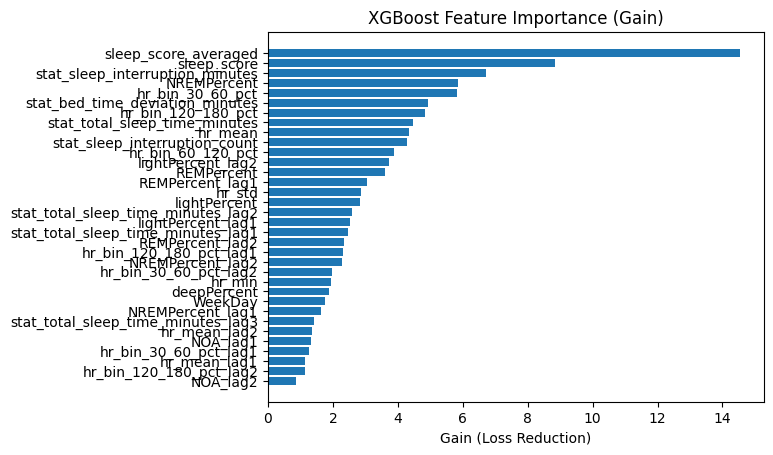

In [27]:
# Gradient Boosting — XGBoost / LightGBM (Advanced)
from xgboost import XGBClassifier
#tscv = TimeSeriesSplit(n_splits=5)

xgb = XGBClassifier(
    n_estimators=500,
    max_depth=8,
    learning_rate=0.01,
    subsample=0.8,
    colsample_bytree=0.8,
    scale_pos_weight=(y == 0).sum() / (y == 1).sum(),
    eval_metric='auc',
    random_state=42
)
rows = []
X =  X_new
y = y_new



for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):

    print(f"\nFold {fold + 1}")

    xgb.fit(X.iloc[train_idx], y.iloc[train_idx])

    preds = xgb.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = (preds >= 0.5).astype(int)
    y_true = y.iloc[test_idx].to_numpy()

    # ---- Confusion Matrix ----
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # ---- Metrics ----
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)      # Sensitivity
    f1 = f1_score(y_true, y_pred, zero_division=0)
    pr_auc = average_precision_score(y_true, y_pred)

    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    auc = roc_auc_score(y_true, preds)
    print("PredVal:",y_pred.flatten())
    print("TrueVal:", y.iloc[test_idx].to_numpy().flatten())
    # ---- Print ----
    print("Confusion Matrix:")
    print(cm)

    print(f"Accuracy    : {accuracy:.3f}")
    print(f"Precision   : {precision:.3f}")
    print(f"Recall      : {recall:.3f}  (Sensitivity)")
    print(f"Specificity : {specificity:.3f}")
    print(f"F1-score    : {f1:.3f}")
    print(f"AUC         : {auc:.3f}")
    print(f"PR AUC      : {pr_auc:.3f}")
    print(classification_report(y_true, y_pred))

    rows.append({"Acc": accuracy, "Precision": precision, "Recall": recall,
                   "F1-score":f1, "ROC-AUC":auc,  "Confusion Matrix:":cm})

df_GX = pd.DataFrame(rows)
print(df_GX.head())


score = xgb.get_booster().get_score(importance_type='gain')

imp_df = pd.DataFrame({
    'feature': X_new.columns,
    'importance': [score.get(f, 0.0) for f in X_new.columns]
}).sort_values('importance', ascending=False)

print(imp_df)

top = imp_df

plt.figure()
plt.barh(top['feature'], top['importance'])
plt.gca().invert_yaxis()
plt.xlabel('Gain (Loss Reduction)')
plt.title('XGBoost Feature Importance (Gain)')
plt.show()


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
'''
X =  X_new
y = y_new
split = int(0.8 * len(X_new))
X_train = X_new[:int(0.7 * len(X_new))]
y_train = y_new[:int(0.7 * len(y_new))]

X_test = X_new[int(0.7 * len(X_new)):]
y_test = y_new[int(0.7 * len(y_new)):]

#X_train, X_val = X_train[:split], X_train[split:]
#y_train, y_val = y_train[:split], y_train[split:]

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(
    optimizer=Adam(0.001),
    loss='binary_crossentropy',
    metrics=['AUC']
)

model.fit(
    X_train,
    y_train,
    epochs=40,
    batch_size=32,
    validation_split=0.2
)

y_pred_probs = model.predict(X_test)
y_pred_probs
# If probability > 0.5, it's an Attack (1). Otherwise, No Attack (0).
threshold = 0.5
y_pred_classes = (y_pred_probs > threshold).astype(int)

# 3. View results
# Flatten array to make it readable: [[1], [0]] -> [1, 0]
print("Probabilities:", y_pred_probs.flatten())
print("Predictions. :", y_pred_classes.flatten())
print("True Value.  :", y_test.to_numpy().flatten())

# Optional: Evaluate
from sklearn.metrics import accuracy_score, confusion_matrix
print("Accuracy:", accuracy_score(y_test, y_pred_classes))
print("AUC:", roc_auc_score(y_test, y_pred_classes))

'''
rows = []
X =  X_new
y = y_new

from tensorflow.keras.metrics import AUC
for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):

    print(f"\nFold {fold + 1}")

    model = Sequential([
      Dense(64, activation='relu', input_shape=(X.shape[1],)),
      Dropout(0.3),
      Dense(32, activation='relu'),
      Dense(1, activation='sigmoid')
    ])

    model.compile(
      optimizer=Adam(0.001),
      loss='binary_crossentropy',
      metrics=[AUC(curve='PR', name='pr_auc')]
    )

    model.fit(
      X.iloc[train_idx],
      y.iloc[train_idx],
      epochs=30,
      batch_size=32,
      validation_split=0.2
    )
    preds = model.predict(X.iloc[test_idx])
    y_pred = (preds >= 0.5).astype(int)
    y_true = y.iloc[test_idx].to_numpy()

    # ---- Confusion Matrix ----
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # ---- Metrics ----
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)      # Sensitivity
    f1 = f1_score(y_true, y_pred, zero_division=0)
    pr_auc = average_precision_score(y_true, y_pred)

    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    auc = roc_auc_score(y_true, preds)
    print("PredVal:",y_pred.flatten())
    print("TrueVal:", y.iloc[test_idx].to_numpy().flatten())
    # ---- Print ----
    print("Confusion Matrix:")
    print(cm)

    print(f"Accuracy    : {accuracy:.3f}")
    print(f"Precision   : {precision:.3f}")
    print(f"Recall      : {recall:.3f}  (Sensitivity)")
    print(f"Specificity : {specificity:.3f}")
    print(f"F1-score    : {f1:.3f}")
    print(f"AUC         : {auc:.3f}")
    print(f"PR AUC      : {pr_auc:.3f}")
    print(classification_report(y_true, y_pred))

    rows.append({"Acc": accuracy, "Precision": precision, "Recall": recall,
                  "Specificity":specificity, "F1-score":f1, "ROC-AUC":auc, "PR-AUC":pr_auc})


df_nn = pd.DataFrame(rows)
print(df_nn.head())


Fold 1


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 15.3820 - pr_auc: 0.3494 - val_loss: 33.9772 - val_pr_auc: 0.2500
Epoch 2/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - loss: 19.2213 - pr_auc: 0.0944 - val_loss: 35.7220 - val_pr_auc: 0.2500
Epoch 3/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - loss: 17.3730 - pr_auc: 0.1087 - val_loss: 36.2265 - val_pr_auc: 0.2500
Epoch 4/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step - loss: 17.9464 - pr_auc: 0.1004 - val_loss: 36.9429 - val_pr_auc: 0.2500
Epoch 5/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step - loss: 0.3143 - pr_auc: 1.0000 - val_loss: 37.0505 - val_pr_auc: 0.2500
Epoch 6/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step - loss: 8.0786 - pr_auc: 0.1250 - val_loss: 36.4673 - val_pr_auc: 0.2500
Epoch 7/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 6.6902 - pr_auc: 0.6196 - val_loss: 35.7374 - val_pr_auc: 0.2500
Epoch 8/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step - loss: 11.1184 - pr_auc: 0.1087 - val_loss: 35.2410 - val_pr_auc: 0.2500
Epoch 9/30
1/1

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/keras/src

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 43.8580 - pr_auc: 0.2033 - val_loss: 36.8463 - val_pr_auc: 0.0000e+00
Epoch 2/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 47.0143 - pr_auc: 0.1778 - val_loss: 21.0282 - val_pr_auc: 0.0000e+00
Epoch 3/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 28.2831 - pr_auc: 0.1833 - val_loss: 12.6739 - val_pr_auc: 0.0000e+00
Epoch 4/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - loss: 19.5223 - pr_auc: 0.2201 - val_loss: 10.0016 - val_pr_auc: 0.0000e+00
Epoch 5/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step - loss: 20.0216 - pr_auc: 0.2017 - val_loss: 7.5148 - val_pr_auc: 0.0000e+00
Epoch 6/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step - loss: 21.3964 - pr_auc: 0.1506 - val_loss: 5.2340 - val_pr_auc: 0.0000e+00
Epoch 7/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 29.7707 - pr_auc: 0.1765 - val_loss: 3.1155 - val_pr_auc: 0.0000e+00
Epoch 8/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 16.5901 - pr_auc: 0.1765 - val_loss: 1.2245 - val_pr_auc: 0.000

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [24]:
'''
import shap

# 1. Use a subset of your data as a background (e.g., 100 samples)
explainer = shap.KernelExplainer(model.predict, X_train[:100])

# 2. Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test[:100])

# 3. Plot the importance
'''


'\nimport shap\n\n# 1. Use a subset of your data as a background (e.g., 100 samples)\nexplainer = shap.KernelExplainer(model.predict, X_train[:100])\n\n# 2. Calculate SHAP values for the test set\nshap_values = explainer.shap_values(X_test[:100])\n\n# 3. Plot the importance\n'

In [25]:
#shap.summary_plot(shap_values, X_test[:100], feature_names=FEATURES)

In [ ]:
# Visualize to compare 5 models
dfs = [df_LR, df_RF, df_DT, df_GX, df_GAM, df_nn]

# Rename 'PR-ROC' to 'PR-AUC' in df_GX for consistency before plotting
if 'PR-ROC' in df_GX.columns:
    df_GX.rename(columns={'PR-ROC': 'PR-AUC'}, inplace=True)

metrics = df_RF.columns
labels = ["Logistic Regression", "Random Forest", "Decision Tree", "XGradient Boost", "GAM", "Neural Network"]

n_metrics = len(metrics)

fig, axes = plt.subplots(len(metrics), 1, figsize=(10, 18), sharex=True)

for j, metric in enumerate(metrics):
    for i, df in enumerate(dfs):
        axes[j].plot(
            df.index,
            df[metric],
            marker='o',
            label=labels[i]
        )
    axes[j].set_ylabel(metric)
    axes[j].grid(True)
    axes[j].legend()

axes[-1].set_xlabel("Index")
plt.suptitle("Comparison of Metrics Across 5 models", y=1.02)
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

dfs = [df_LR, df_RF, df_GX, df_nn]
print("Logistic regression")
print(df_LR)
print("Random Forest")
print(df_RF)
print("XGradient Boost")
print(df_GX)
print("Neural Network")
print(df_nn)
folds = df_LR.index
x = np.arange(len(folds))
print(x)
width = 0.15
epsilon = 0.01

colors = [
    '#4E79A7',  # muted blue
    '#59A14F',  # muted green
    '#E15759',  # muted red
    '#B07AA1',  # muted purple
    '#9C755F'   # muted brown
]


metrics = ['Precision', 'Recall', 'F1-score', 'PR-AUC', 'Acc', 'ROC-AUC']
model_names = ["Logistic Regression", "Random Forest", "XGradient Boost", "Neural Network"]
for metric in metrics:
    plt.figure(figsize=(10, 5))

    for i, (df, model) in enumerate(zip(dfs, model_names)):
        values = df[metric].values

        # Make zero bars visible
        plot_values = values.copy()
        plot_values[plot_values == 0] = epsilon

        plt.bar(
            x + i * width,
            plot_values,
            width,
            label=model,
            color=colors[i],
            edgecolor='black',
            linewidth=0.5
        )

    plt.xticks(x + width * (len(model_names) - 1) / 2, folds)
    plt.xlabel('Fold')
    plt.ylabel(metric)
    plt.ylim(0, 1.05)
    plt.title(f'{metric} Across Folds of Model')
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()



# **`Remaining models`**

In [187]:
LOOKBACK = 7      # last 14 days
TARGET = 'attack_in_1_day'

#sequential builder function
import numpy as np

def create_sequences(X, y, lookback):
    X_seq, y_seq = [], []

    for i in range(lookback, len(X)):
        X_seq.append(X[i - lookback:i])
        y_seq.append(y[i])

    return np.array(X_seq), np.array(y_seq)

# scale + create
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
X =  X_new
y = y_new

# Impute
imputer = SimpleImputer(strategy="median")
X_imp = imputer.fit_transform(df_required[FEATURES])
X_imp = X_imp[:-10]
#print(X_imp)
# Scale
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imp)
#print(X_scaled)
y = df_required[TARGET].astype(int).values
y = y[:-10]
X_seq, y_seq = create_sequences(X_scaled, y, LOOKBACK)

print(X_seq.shape)
# (samples, time_steps, features)

# Get train and test data
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.3, random_state=42, shuffle=False)


split = int(0.8 * len(X_train))

X_train, X_val = X_train[:split], X_train[split:]
y_train, y_val = y_train[:split], y_train[split:]
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)


(108, 7, 17)
(60, 7, 17)
(60,)
(15, 7, 17)
(15,)


In [190]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam

rnn_model = Sequential([
    SimpleRNN(32, activation='tanh', input_shape=(LOOKBACK, X_seq.shape[2])),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

rnn_model.compile(
    optimizer=Adam(0.001),
    loss='binary_crossentropy',
    metrics=['AUC']
)

rnn_model.summary()
'''
✅ Pros

Simple

Captures recent trends

Good baseline sequence model

❌ Cons

Suffers from vanishing gradients

Poor long-term memory

Misses slow sleep debt accumulation
'''


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn_9 (SimpleRNN)        │ (None, 32)             │         1,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,633 (6.38 KB)

 Trainable params: 1,633 (6.38 KB)

 Non-trainable params: 0 (0.00 B)

'\n✅ Pros\n\nSimple\n\nCaptures recent trends\n\nGood baseline sequence model\n\n❌ Cons\n\nSuffers from vanishing gradients\n\nPoor long-term memory\n\nMisses slow sleep debt accumulation\n'

In [192]:
rnn_model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val, y_val)
)


Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 676ms/step - AUC: 0.4173 - loss: 0.8170 - val_AUC: 0.6111 - val_loss: 0.6514
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - AUC: 0.3293 - loss: 0.8527 - val_AUC: 0.6667 - val_loss: 0.6495
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - AUC: 0.4426 - loss: 0.7188 - val_AUC: 0.7222 - val_loss: 0.6497
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - AUC: 0.3812 - loss: 0.7355 - val_AUC: 0.7222 - val_loss: 0.6526
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - AUC: 0.3792 - loss: 0.7939 - val_AUC: 0.7222 - val_loss: 0.6568
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - AUC: 0.5489 - loss: 0.6886 - val_AUC: 0.6944 - val_loss: 0.6621
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - AUC: 0.4281 - loss: 0.7026 - val_AUC: 0.7083 - val_loss: 0.6674
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - AUC: 0.5286 - loss: 0.7214 - val_AUC: 0.7083 - val_loss: 0.6743
Epoch 9/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - AUC: 0.5365 - loss: 0.6

In [193]:
# predict
y_pred_probs = rnn_model.predict(X_test)
y_pred_probs
# If probability > 0.5, it's an Attack (1). Otherwise, No Attack (0).
threshold = 0.5
y_pred_classes = (y_pred_probs > threshold).astype(int)

# 3. View results
# Flatten array to make it readable: [[1], [0]] -> [1, 0]
print("Probabilities:", y_pred_probs.flatten())
print("Predictions. :", y_pred_classes.flatten())
#print("True Value.  :", y_test.to_numpy().flatten())

# Optional: Evaluate
from sklearn.metrics import accuracy_score, confusion_matrix
print("Accuracy:", accuracy_score(y_test, y_pred_classes))
print("AUC:", roc_auc_score(y_test, y_pred_classes))

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilities: [0.4653887  0.20204403 0.57048535 0.3289482  0.49980348 0.70381415
 0.70815414 0.33608845 0.13750862 0.3875503  0.2488858  0.41690347
 0.34697086 0.20645326 0.19751723 0.19540432 0.28926    0.4076197
 0.8958744  0.9534882  0.5769154  0.16267015 0.23686619 0.8530208
 0.7815726  0.9194523  0.9602499  0.78272575 0.24626723 0.25733268
 0.20162536 0.09704479 0.06051425]
Predictions. : [0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 0 0 0 0 0]
Accuracy: 0.696969696969697
AUC: 0.6571428571428573


In [199]:
# LSTM model
from tensorflow.keras.layers import LSTM
lstm_model = Sequential([
    LSTM(64, return_sequences=False,
         input_shape=(LOOKBACK, X_seq.shape[2])),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

lstm_model.compile(
    optimizer=Adam(0.001),
    loss='binary_crossentropy',
    metrics=['AUC']
)

lstm_model.summary()
'''
✅ Pros

Learns long-term physiological buildup

Robust to noisy HR signals

Best deep model for SBS prediction

❌ Cons

Needs more data than XGBoost

Less interpretable (needs SHAP-for-sequences)
'''



Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_12 (LSTM)                  │ (None, 64)             │        20,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,057 (82.25 KB)

 Trainable params: 21,057 (82.25 KB)

 Non-trainable params: 0 (0.00 B)

'\n✅ Pros\n\nLearns long-term physiological buildup\n\nRobust to noisy HR signals\n\nBest deep model for SBS prediction\n\n❌ Cons\n\nNeeds more data than XGBoost\n\nLess interpretable (needs SHAP-for-sequences)\n'

In [200]:
'''
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42, shuffle=False)

split = int(0.8 * len(X_train))

X_train, X_val = X_train[:split], X_train[split:]
y_train, y_val = y_train[:split], y_train[split:]
'''

lstm_model.fit(
    X_train, y_train,
    epochs=40,
    batch_size=32,
    validation_data=(X_val, y_val)
)

Epoch 1/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 506ms/step - AUC: 0.3534 - loss: 1.1801 - val_AUC: 0.3750 - val_loss: 3.2309
Epoch 2/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - AUC: 0.5772 - loss: 0.8378 - val_AUC: 0.4722 - val_loss: 2.3401
Epoch 3/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - AUC: 0.6889 - loss: 0.7192 - val_AUC: 0.5833 - val_loss: 0.8124
Epoch 4/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - AUC: 0.7257 - loss: 0.3622 - val_AUC: 0.6111 - val_loss: 0.5381
Epoch 5/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - AUC: 0.6803 - loss: 0.5276 - val_AUC: 0.6389 - val_loss: 0.4849
Epoch 6/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - AUC: 0.6847 - loss: 0.7357 - val_AUC: 0.6667 - val_loss: 0.4505
Epoch 7/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - AUC: 0.8122 - loss: 0.3265 - val_AUC: 0.6944 - val_loss: 0.4374
Epoch 8/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - AUC: 0.8378 - loss: 0.4658 - val_AUC: 0.6944 - val_loss: 0.4304
Epoch 9/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - AUC: 0.8006 - loss: 0.6093 -

In [201]:
# predict
# predict
y_pred_probs = lstm_model.predict(X_test)
y_pred_probs
# If probability > 0.5, it's an Attack (1). Otherwise, No Attack (0).
threshold = 0.5
y_pred_classes = (y_pred_probs > threshold).astype(int)

# 3. View results
# Flatten array to make it readable: [[1], [0]] -> [1, 0]
print("Probabilities:", y_pred_probs.flatten())
print("Predictions:", y_pred_classes.flatten())

# Optional: Evaluate
from sklearn.metrics import accuracy_score, confusion_matrix
print("Accuracy:", accuracy_score(y_test, y_pred_classes))
print("AUC:", roc_auc_score(y_test, y_pred_classes))

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
Probabilities: [-0.49301326 -0.36760616 -0.23880766 -0.26926702 -0.18374117 -0.09943435
 -0.22972804 -0.33826455 -0.5145444  -0.36669675 -0.3620482  -0.1939009
 -0.20393795 -0.1992379  -0.41930106 -0.33789492 -0.36269307 -0.18236604
 -0.00466268  0.2487809  -0.1698979  -0.45132214 -0.16600011  0.05634585
  0.17901662  0.33862755  0.4431633  -0.11249944 -0.4814344  -0.18240605
 -0.26266208 -0.20449495 -0.41318575]
Predictions: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Accuracy: 0.8484848484848485
AUC: 0.5


In [210]:
# Advanced LSTM
advanced_lstm = Sequential([
    LSTM(64, return_sequences=True,
         input_shape=(LOOKBACK, X_seq.shape[2])),
    Dropout(0.3),

    LSTM(32),
    Dropout(0.3),

    Dense(1, activation='sigmoid')
])

advanced_lstm.compile(
    optimizer=Adam(0.0005),
    loss='binary_crossentropy',
    metrics=['AUC']
)

advanced_lstm.summary()


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_19 (LSTM)                  │ (None, 7, 64)          │        20,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_38 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_20 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_39 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,441 (130.63 KB)

 Trainable params: 33,441 (130.63 KB)

 Non-trainable params: 0 (0.00 B)

In [211]:
from sklearn.utils.class_weight import compute_class_weight

weights = compute_class_weight(
    class_weight='balanced',
    classes=np.array([0,1]),
    y=y_train
)

class_weights = {0: weights[0], 1: weights[1]}
lstm_model.fit(
    X_train, y_train,
    epochs=40,
    batch_size=32,
    validation_data=(X_val, y_val),
    class_weight=class_weights
)


Epoch 1/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - AUC: 0.9213 - loss: 1.1599 - val_AUC: 0.6667 - val_loss: 2.2056
Epoch 2/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - AUC: 0.9289 - loss: 1.1615 - val_AUC: 0.6667 - val_loss: 2.2051
Epoch 3/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - AUC: 0.9269 - loss: 1.1604 - val_AUC: 0.6667 - val_loss: 2.2045
Epoch 4/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - AUC: 0.9398 - loss: 1.1637 - val_AUC: 0.6667 - val_loss: 2.2038
Epoch 5/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - AUC: 0.9622 - loss: 0.5986 - val_AUC: 0.6667 - val_loss: 2.2030
Epoch 6/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - AUC: 0.9384 - loss: 1.1626 - val_AUC: 0.6667 - val_loss: 2.2021
Epoch 7/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - AUC: 0.9345 - loss: 1.1631 - val_AUC: 0.6667 - val_loss: 2.2014
Epoch 8/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - AUC: 0.9296 - loss: 1.1579 - val_AUC: 0.6667 - val_loss: 2.2010
Epoch 9/40
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - AUC: 0.9352 - loss: 1.1595 -

In [212]:
# predict

y_pred_probs = lstm_model.predict(X_test)
y_pred_probs
# If probability > 0.5, it's an Attack (1). Otherwise, No Attack (0).
threshold = 0.5
y_pred_classes = (y_pred_probs > threshold).astype(int)

# 3. View results
# Flatten array to make it readable: [[1], [0]] -> [1, 0]
print("Probabilities:", y_pred_probs.flatten())
print("Predictions:", y_pred_classes.flatten())
print("True Value:", y_test.flatten())

# Optional: Evaluate
from sklearn.metrics import accuracy_score, confusion_matrix
print("Accuracy:", accuracy_score(y_test, y_pred_classes))
print("AUC:", roc_auc_score(y_test, y_pred_classes))

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilities: [-0.9392199  -0.90794283 -0.99066657 -0.9152046  -0.98591626 -0.9894003
 -0.88497114 -0.8814827  -0.9310797  -0.9833691  -0.93534964 -0.9808864
 -0.8680746  -0.8056807  -0.86386484 -0.8850893  -0.98559266 -0.98770666
 -0.9937232  -0.9840422  -0.89711595 -0.94210994 -0.98231924 -0.98507786
 -0.9754919  -0.8466519  -0.6269611  -0.87635213 -0.95961297 -0.98751587
 -0.93518406 -0.9013974  -0.8958147 ]
Predictions: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
True Value: [0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0]
Accuracy: 0.8484848484848485
AUC: 0.5


# **Model Explaination - Dont run this **

1. Understanding Your Data
Based on your columns, here is the interpretation of the key features:

Sleep Architecture: REMPercent, deepPercent, NREMPercent, deep, DEEP_FH (Deep sleep in First Half), and stat_total_sleep_time_minutes.
Sleep Latency/Quality: SOL_AASM / SOL_10 (Time to fall asleep by different criteria), subjective_SOL, NOA (Number of Awakenings), and SE (Sleep Efficiency).
Heart Rate (HR) Bins: hr_0_50, hr_51_100, hr_101_150. These represent the frequency or duration spent in specific heart rate ranges during sleep—critical for spotting autonomic stress.
Behavioral: WeekDay and stat_bed_time_deviation_minutes (Circadian rhythm consistency).

Step 1: Basic Approach (Static Classification)
Goal: Establish a baseline to see if "yesterday's" data can predict "tomorrow's" attack.

Preprocessing:
WeekDay: Convert string to numbers (0-6).
Normalization: Use StandardScaler for heart rate bins and sleep minutes, as they have different scales.
Modeling: Use a Random Forest or Logistic Regression.
Setup: Treat each row as an independent sample. Predict attack_in_1_day using today's sleep metrics.
Why start here? It’s fast to implement and tells you which features (like DEEP_FH or NOA) have the highest correlation with an attack.


Step 2: Intermediate Approach (Feature Engineering & Multi-Horizon)
Goal: Capture "trends" (e.g., "I've slept poorly for 3 days") and predict multiple days at once.

Feature Engineering (The Secret Sauce):
Rolling Windows: Calculate the 3-day and 7-day moving average and standard deviation for columns like sleep_score and hr_51_100. Sudden drops in sleep quality are often more predictive than a single bad night.
Cyclical Encoding for WeekDay: Don't just use 0-6. Use Sine/Cosine transforms so the model knows Sunday (6) is adjacent to Monday (0).
code
Python
df['day_sin'] = np.sin(2 * np.pi * df['WeekDay_num']/7)
df['day_cos'] = np.cos(2 * np.pi * df['WeekDay_num']/7)
Lags: Add features from 1 and 2 days ago (t-1, t-2) to the current row.
Modeling: Use XGBoost or LightGBM with a MultiOutputClassifier wrapper. This allows one model to output three separate probabilities for 1, 2, and 3 days.
Step 3: Advanced Approach (Time-Series Sequence Models)
Goal: Use the full history of the user to identify complex "pre-attack" signatures.

Architecture: LSTM (Long Short-Term Memory) or GRU.
Input Structure: Instead of one row, the model takes a "window" of the last 7–14 days as a sequence (Samples, Time_Steps, Features).
Multi-Task Learning: Design the Neural Network to have one input (the 7-day sleep sequence) and three output "heads" (one for each probability). This helps the model learn that an attack in 1 day is highly correlated with an attack in 2 days.
Attention Mechanism: Add an Attention layer to let the model "focus" on specific nights (e.g., it might learn that the weekend sleep matters more for a Monday attack).
Step 4: Efficiency & Refinement (The "Expert" Level)
Goal: Make the model reliable for real-world use.

Handle Class Imbalance: Attacks are likely rare (e.g., 5% of days). Use SMOTE or class weighting (scale_pos_weight in XGBoost) to ensure the model doesn't just predict "No Attack" every time to get high accuracy.
Probability Calibration: Since you need the probability of occurrence, use CalibratedClassifierCV. A model saying "80% chance" should actually see an attack 8 out of 10 times.
Feature Importance (SHAP): Use SHAP values to explain why the model predicted an attack. (e.g., "Attack probability is high because your stat_bed_time_deviation_minutes was > 60 minutes for 2 days").
Evaluation Metrics: Do not use Accuracy. Use Precision-Recall AUC or F1-Score. In health, "False Negatives" (missing an attack) are often more dangerous than "False Positives" (a false alarm).
Recommended Roadmap Summary
Step	Model	Input	Complexity
1. Basic	Random Forest	Today's sleep data	Low
2. Intermediate	XGBoost + Lags	3-7 day rolling averages	Medium
3. Advanced	LSTM / Transformers	7-day raw sequence	High
4. Efficient	Calibrated XGBoost	Selected features + SHAP	High (Production ready)


Adding ARIMA (or its variants) is an interesting thought, but it is important to understand where it fits.

Strictly speaking, ARIMA is a regression tool used for forecasting continuous values (like stock prices or temperature) based on past values. Since your goal is to predict the probability of a binary event (Attack vs. No Attack), ARIMA cannot be used as the final classifier directly.

However, you can use a "Traditional Statistical Approach" involving ARIMA/SARIMAX in two very effective ways. Let's add this as Step 1.5.

Step 1.5: The Statistical Approach (ARIMAX & Residual Analysis)
Before jumping into complex Machine Learning, you can use statistical modeling to understand the "signals" in your sleep data.

1. Using SARIMAX (ARIMA with Exogenous Variables)
Since you have many features (Exogenous variables), you would use SARIMAX.

The Idea: Instead of predicting the attack directly, you use SARIMAX to predict your Sleep Score or Deep Sleep % for the next night.
How it helps: If the actual sleep quality is significantly lower than what the SARIMAX model predicted (this is called the Residual), that "unexpected drop" in sleep quality is often a much stronger predictor of an attack than the raw sleep score itself.
2. Feature Engineering via Decomposition
Traditional time-series libraries (like statsmodels) allow you to decompose your data into Trend, Seasonality, and Noise.

The Approach: Use seasonal_decompose on your stat_total_sleep_time_minutes.
The Insight: Is the user in a downward "Trend" of sleep? Is there a "Weekly Seasonality" (e.g., they sleep poorly every Sunday night before work)? These components can be fed into your Step 2 XGBoost model as features.
Why ARIMA might be difficult for this specific dataset:
Binary Target: ARIMA predicts a number (e.g., 420 minutes of sleep), not the probability of a "Yes/No" attack. You would need to wrap it in a Logistic regression to get probabilities.
Multivariate Complexity: You have ~20 columns. ARIMA is natively univariate. While SARIMAX handles exogenous variables, it becomes mathematically unstable and very slow when you have more than 5-10 features.
Stationarity: ARIMA requires the data to be "stationary" (mean and variance don't change over time). Sleep data is often "noisy" and non-stationary, requiring a lot of manual data cleaning (differencing).
Updated Roadmap with the "Statistical" Step:
Step	Approach	Role of ARIMA/Stats
Step 1	Basic Classification	None (Baseline using Random Forest).
Step 1.5	Statistical Analysis	Use SARIMAX to find anomalies/residuals in sleep patterns.
Step 2	Feature Engineering	Use Moving Averages and Decomposition (Trend/Seasonality).
Step 3	Boosting Models	Use XGBoost/LightGBM with the features found in Step 1.5.
Step 4	Deep Learning	Use LSTMs to capture the long-term dependencies ARIMA missed.


In [1]:
e# Step 1: Basic Approach (Random Forest)
from xgboost import XGBClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, classification_report

df = df_required.copy()
# 1. INITIAL PREPARATION
# ---------------------------------------------------------
weekday_map = {'Monday':0, 'Tuesday':1, 'Wednesday':2, 'Thursday':3, 'Friday':4, 'Saturday':5, 'Sunday':6}
df['WeekDay_num'] = df['WeekDay'].map(weekday_map)

# Sort by date to ensure time-series integrity
# df = df.sort_values('Date')

# Define raw feature groups
sleep_metrics = ['stat_total_sleep_time_minutes', 'REMPercent', 'deepPercent', 'DEEP_FH',
                 'SE', 'sleep_quality', 'sleep_score', 'NOA', 'SOL_AASM']
hr_metrics = ['hr_0_30', 'hr_31_70', 'hr_71_120']
behavioral = ['stat_bed_time_deviation_minutes', 'subjective_SOL']

# 2. ADVANCED FEATURE ENGINEERING
# ---------------------------------------------------------

# A. Cyclical Time Features (Sunday is next to Monday)
df['weekday_sin'] = np.sin(2 * np.pi * df['WeekDay_num'] / 7)
df['weekday_cos'] = np.cos(2 * np.pi * df['WeekDay_num'] / 7)

# B. Rolling Windows (Capturing Trends & Volatility)
# We look at the last 3 and 7 days to see if health is "trending down"
for col in sleep_metrics + hr_metrics:
    df[f'{col}_7d_avg'] = df[col].rolling(window=7).mean()
    df[f'{col}_3d_std'] = df[col].rolling(window=3).std() # Volatility

# C. Sleep Debt (Cumulative deficit)
df['sleep_debt_3d'] = df['stat_total_sleep_time_minutes'].rolling(window=3).sum()

# D. Lag Features (The "Yesterday" effect)
# What happened 1 and 2 days ago?
for col in ['sleep_score', 'hr_31_70', 'stat_bed_time_deviation_minutes']:
    df[f'{col}_lag1'] = df[col].shift(1)
    df[f'{col}_lag2'] = df[col].shift(2)

# E. Delta Features (Sudden Changes)
# Difference between today's sleep and the 7-day average
df['sleep_score_delta'] = df['sleep_score'] - df['sleep_score_7d_avg']
df['hr_stress_delta'] = df['hr_31_70'] - df['hr_31_70_7d_avg']

# Drop rows with NaNs created by rolling/lags
df_clean = df.dropna().copy()

# 3. PREPARING FOR MULTI-OUTPUT MODELING
# ---------------------------------------------------------

# Targets: We want to predict all three simultaneously
targets = ['attack_in_1_day', 'attack_in_2_days', 'attack_in_3_days']

# Features: All engineered columns except targets and the raw WeekDay string
X = df_clean.drop(targets + ['WeekDay', 'is_attack'], axis=1)
y = df_clean[targets]

# Split data (NO SHUFFLE for time series)
split_idx = int(len(df_clean) * 0.5)
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

# Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. TRAINING THE ADVANCED MODEL (XGBOOST)
# ---------------------------------------------------------

# scale_pos_weight helps if attacks are rare (e.g., only 10% of days have attacks)
# Calculate ratio: sum(neg) / sum(pos)
ratio = (y_train == 0).sum().sum() / (y_train == 1).sum().sum()

base_xgb = XGBClassifier(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=5,
    scale_pos_weight=ratio,
    subsample=0.8,
    colsample_bytree=0.8,
    use_label_encoder=False,
    eval_metric='logloss'
)

# MultiOutputClassifier wraps the XGBoost to handle 3 targets at once
model = MultiOutputClassifier(base_xgb)
model.fit(X_train_scaled, y_train)

# 5. EVALUATION & PROBABILITY OUTPUT
# ---------------------------------------------------------

# Predict probabilities
probs = model.predict_proba(X_test_scaled)

# Probs is a list of 3 arrays (one for each target day)
print("--- Prediction Probabilities for the next 3 days ---")
for i, day in enumerate([1, 2, 3]):
    # probs[i][:, 1] gives the probability of the "1" (Attack) class
    auc = roc_auc_score(y_test.iloc[:, i], probs[i][:, 1])
    print(f"Day {day} Prediction AUC: {auc:.4f}")

# Example output for the very last day in your dataset
last_day_probs = [p[-1, 1] for p in probs]
print(f"\nForecast for tomorrow: {last_day_probs[0]*100:.1f}%")
print(f"Forecast for day after: {last_day_probs[1]*100:.1f}%")
print(f"Forecast for 3 days out: {last_day_probs[2]*100:.1f}%")

NameError: name 'df_required' is not defined

In [ ]:
import matplotlib.pyplot as plt
# Plot importance for the '1-day' model
feat_importances = pd.Series(model.estimators_[0].feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

Step 1.5: Statistical Enhancement (SARIMAX Residuals)
Goal: Detect "anomalies" in sleep behavior. We use SARIMAX to predict the expected sleep_score. If the actual sleep is much worse than predicted, we create a residual feature.

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Model the user's typical sleep behavior
# We use sleep_score as the signal and bed_time_deviation as an external factor
sarima_model = SARIMAX(df['sleep_score'], exog=df[['stat_bed_time_deviation_minutes']], order=(1,1,1))
res = sarima_model.fit(disp=False)

# Add the residual (Error) to the dataframe
# A high negative residual means "Your sleep was surprisingly bad tonight"
df['sleep_anomaly_score'] = res.resid

In [ ]:
# Assuming your dataframe is df_eng (the engineered one)
# We take 80% of data for training, 20% for testing
df_eng = df_required.copy()
split_idx = int(len(df_eng) * 0.8)

# Split Features (X) and Targets (y)
X_train = X_eng.iloc[:split_idx]
X_test = X_eng.iloc[split_idx:]

y_train = y_eng.iloc[:split_idx]
y_test = y_eng.iloc[split_idx:]

print(f"Training rows: {len(X_train)}")
print(f"Testing rows: {len(X_test)}")

In [ ]:
from xgboost import XGBClassifier
from sklearn.multioutput import MultiOutputClassifier

# Calculate imbalance ratio to help the model see the rare "attack" days
# ratio = total_zeros / total_ones
ratio = (y_train == 0).sum().sum() / (y_train == 1).sum().sum()

# Initialize the model
xgb = XGBClassifier(
    scale_pos_weight=ratio,
    n_estimators=200,
    learning_rate=0.05,
    max_depth=5
)

# Wrap in MultiOutput to predict 1, 2, and 3 days at once
model_xgb = MultiOutputClassifier(xgb)

# Fit the model using the split data created above
model_xgb.fit(X_train, y_train)

print("XGBoost Model Trained Successfully")

from sklearn.metrics import classification_report, roc_auc_score, accuracy_score

def evaluate_ml_model(model, X_test, y_test):
    # 1. Get predictions and probabilities
    # Note: predict_proba for MultiOutputClassifier returns a list of [n_samples, 2] arrays
    y_pred = model.predict(X_test)
    y_prob_list = model.predict_proba(X_test)

    targets = ['Day 1', 'Day 2', 'Day 3']

    print("--- Model Evaluation ---")
    for i, target_name in enumerate(targets):
        # Extract probabilities for the 'positive' class (index 1)
        y_prob_day = y_prob_list[i][:, 1]

        acc = accuracy_score(y_test.iloc[:, i], y_pred[:, i])
        auc = roc_auc_score(y_test.iloc[:, i], y_prob_day)

        print(f"\nRESULTS FOR {target_name}:")
        print(f"Accuracy: {acc:.2%}")
        print(f"AUC-ROC Score: {auc:.4f}")
        print(classification_report(y_test.iloc[:, i], y_pred[:, i]))

# To test XGBoost from Phase 2:
evaluate_ml_model(model_xgb, X_te, y_te)

In [ ]:
# Create the 3D sequences (Samples, Time_Steps, Features)
X_s, y_s = create_sequences(pd.DataFrame(X_scaled), y_eng, time_steps=10)

# Now use the split_idx to divide the sequences
X_train_seq = X_s[:split_idx]
y_train_seq = y_s[:split_idx]

X_test_seq = X_s[split_idx:]
y_test_seq = y_s[split_idx:]

# Train the LSTM
model.fit(
    X_train_seq,
    y_train_seq,
    epochs=50,
    batch_size=16,
    validation_split=0.1 # Takes 10% of training data for internal validation
)

def evaluate_lstm(model, X_test_seq, y_test_seq):
    # 1. Get probability predictions
    y_prob = model.predict(X_test_seq)

    # 2. Convert probabilities to binary (0 or 1)
    y_pred = (y_prob > 0.5).astype(int)

    targets = ['Day 1', 'Day 2', 'Day 3']

    print("--- LSTM Model Evaluation ---")
    for i, target_name in enumerate(targets):
        acc = accuracy_score(y_test_seq[:, i], y_pred[:, i])
        auc = roc_auc_score(y_test_seq[:, i], y_prob[:, i])

        print(f"\nRESULTS FOR {target_name}:")
        print(f"Accuracy: {acc:.2%}")
        print(f"AUC-ROC Score: {auc:.4f}")
        print(classification_report(y_test_seq[:, i], y_pred[:, i]))

# To test LSTM from Phase 3:
# Assuming you named your split data X_test_seq and y_test_seq
evaluate_lstm(model, X_test_seq, y_test_seq)

In [ ]:
import tensorflow as tf
from sklearn.preprocessing import StandardScaler

# 1. Windowing Function
def create_sequences(X, y, time_steps=10):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X.iloc[i:(i + time_steps)].values)
        ys.append(y.iloc[i + time_steps].values)
    return np.array(Xs), np.array(ys)

# 2. Scale and Sequence
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_eng)
X_s, y_s = create_sequences(pd.DataFrame(X_scaled), y_eng, time_steps=10)

# 3. LSTM Model
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(X_s.shape[1], X_s.shape[2]), return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(32),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(3, activation='sigmoid') # Sigmoid for probability of each day
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

# 4. Training
model.fit(X_s[:split_idx], y_s[:split_idx], epochs=50, batch_size=16, validation_split=0.1, verbose=1)



In [ ]:
# 5. Prediction
# predict returns probability for [Day 1, Day 2, Day 3]
current_risk = model.predict(X_s[3:])
print(f"Probabilities: Day 1: {current_risk[0][0]:.2%}, Day 2: {current_risk[0][1]:.2%}, Day 3: {current_risk[0][2]:.2%}")